Notebook containing several analyses of the data that go far beyond what was presented in the paper. 

by Warren Woodrich Pettine, M.D.
Last updated 2023-11-18

In [20]:
from datetime import datetime, timedelta
from sys import displayhook
import numpy as np
import os
from scipy.stats import hmean, zscore, pearsonr, ttest_ind, linregress
import statsmodels.api as sm
import statsmodels.formula.api as smf
import pingouin as pg
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from dbinterfacefunctions import connectDroneReconDB, getSessionData, getRecruitmentInfo, getAnalysisData,\
    getQuestionnaireData
from analysisfunctions import binEstimatesOutcomes, calcBrierScore, calcCalibration, decompositionFigure,\
    convertConfidenceKeysToProbs, calcOutcomeVariance, calcResolution, getQuestionnaireSummaries, \
    cleanDataOnlyProlificSubjects, convertCalibration, getSubdimMatrixDF, renameDfColumns

from factor_analyzer import FactorAnalyzer
from factor_analyzer.factor_analyzer import calculate_bartlett_sphericity
from factor_analyzer.factor_analyzer import calculate_kmo

import copy

# Load data
The files can be downloaded at https://zenodo.org/records/10155670


In [22]:
data_dir = os.getcwd() + '/data/'

# Load questionnaire responses
data_questionnaires = pd.read_csv(os.path.join(data_dir,'questionnaire_data.csv')) # Individual questions
overall_scores_df = pd.read_csv(os.path.join(data_dir,'questionnaire_overall_scores.csv')) # Overall responses to the questionnaries
subscale_scores_df = pd.read_csv(os.path.join(data_dir,'questionnaire_subscale_scores.csv')) # Broken down into subscales

# Load all subject task data from all sessions
data_initial_test = pd.read_csv(os.path.join(data_dir,'task_data_initial_test.csv'))
data_retest_1 = pd.read_csv(os.path.join(data_dir,'task_data_retest_1.csv'))
data_retest_2 = pd.read_csv(os.path.join(data_dir,'task_data_retest_2.csv'))
data_initial_test['test'] = 0
data_retest_1['test'] = 1
data_retest_2['test'] = 2
data_test_all = pd.concat([data_initial_test,data_retest_1,data_retest_2])

# Cut down to just the subjects that completed all three sessions
data_initial_test = data_initial_test.loc[data_initial_test.subject_id.isin(data_retest_2.subject_id.unique()),:]
data_retest_1 = data_retest_1.loc[data_retest_1.subject_id.isin(data_retest_2.subject_id.unique()),:]

data_questionnaires = data_questionnaires.loc[data_questionnaires.subject_id.isin(data_test_all.subject_id.unique()),:]

# Demographics

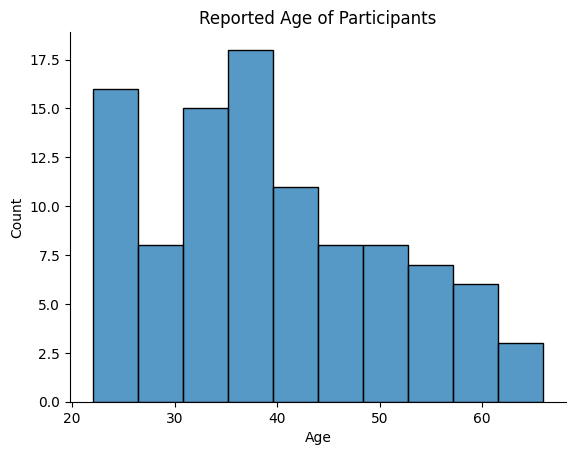

['female' 'male'] [32 68]


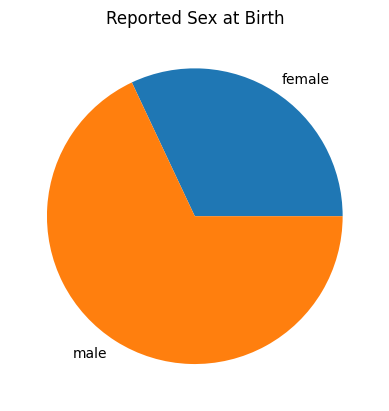

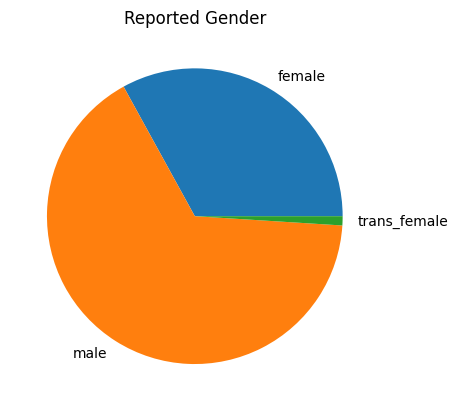

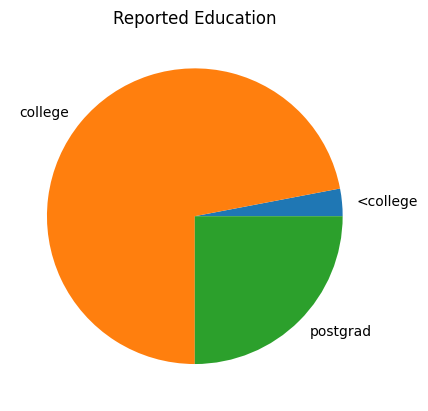

In [17]:
# Plot histogram of the age of participants
ax = sns.histplot(data_questionnaires.loc[:,['subject_id','age']].drop_duplicates(), x='age', bins=10)
ax.set(xlabel='Age', ylabel='Count', title='Reported Age of Participants')
sns.despine()
plt.show()

# Pie chart of reported sex
resp, count = np.unique(data_questionnaires.loc[:,['subject_id','sex']].drop_duplicates().sex,return_counts=True)
print(resp, count)
plt.pie(count,labels=resp)
plt.title('Reported Sex at Birth')
plt.show()

# Pie chart of reported gender
resp, count = np.unique(data_questionnaires.loc[:,['subject_id','gender']].drop_duplicates().gender,return_counts=True)
plt.pie(count,labels=resp)
plt.title('Reported Gender')
plt.show()

# Pie chart of reported education
resp, count = np.unique(data_questionnaires.loc[:,['subject_id','education']].drop_duplicates().education,return_counts=True)
plt.pie(count,labels=resp)
plt.title('Reported Education')
plt.show()

# Analysis
## Brier scores, calibration and the rest across tests
Calculate the stats. Run this before moving on. The function is show here to make it more clear what is being calculated, and what is available.

In [4]:
def calibrationSummaries(data,correct_rewarded_score=True):
    # Get the external IDs
    subject_ids = data.subject_id.unique()

    # Create the arrays to store the data
    subject_id = np.zeros(len(subject_ids))
    accuracy = np.zeros(len(subject_ids))
    brier_score = np.zeros(len(subject_ids))
    calibration = np.zeros(len(subject_ids))
    resolution = np.zeros(len(subject_ids))
    outcome_variance = np.zeros(len(subject_ids))
    calibration_converted_score = np.zeros(len(subject_ids))
    accuracy_calibrationconverted_mean = np.zeros(len(subject_ids))

    for i, subj_id in enumerate(subject_ids):
        # Get the data for the current external ID
        data_subject = data.loc[data.subject_id == subj_id, :]
        accuracy[i] = data_subject.loc[data_subject.block=='test',:].correct.mean()
        subject_id[i] = data_subject.subject_id.iloc[0]
        estimates_ = data_subject.loc[data_subject.block=='test',:].confidence.to_numpy().astype(int)
        outcomes_ = data_subject.loc[data_subject.block=='test',:].correct.to_numpy().astype(int)
        brier_score[i] = calcBrierScore(estimates_,outcomes_)
        resolution[i] = calcResolution(estimates_,outcomes_)
        calibration[i] = calcCalibration(estimates_,outcomes_)
        outcome_variance[i] = calcOutcomeVariance(outcomes_)
        calibration_converted_score[i] = convertCalibration(estimates_,outcomes_)
        accuracy_calibrationconverted_mean[i] = (accuracy[i]+calibration_converted_score[i])/2

    if correct_rewarded_score:
        accuracy_calibrationconverted_mean[accuracy_calibrationconverted_mean<0] = 0
        
    task_summaries_df = pd.DataFrame({
            'subject_id': subject_id,
            'accuracy':accuracy,
            'brier_score':brier_score,
            'calibration':calibration,
            'resolution': resolution,
            'outcome_variance': outcome_variance,
            'calibration_converted_score': calibration_converted_score,
            'rewarded_score': accuracy_calibrationconverted_mean
    })
    return task_summaries_df


task_summaries_initial_test = calibrationSummaries(data_initial_test)
task_summaries_retest_1 = calibrationSummaries(data_retest_1)
task_summaries_retest_2 = calibrationSummaries(data_retest_2)

task_summaries_initial_test['test'] = 0
task_summaries_retest_1['test'] = 1
task_summaries_retest_2['test'] = 2
task_summaries = pd.concat([task_summaries_initial_test,task_summaries_retest_1,task_summaries_retest_2])


### Calculate the ICC for each variable metric

In [16]:
icc = pg.intraclass_corr(data=task_summaries, raters='test', targets='subject_id', ratings='accuracy')
print('Accuracy ICC')
display(icc.set_index('Type'))

icc = pg.intraclass_corr(data=task_summaries, raters='test', targets='subject_id', ratings='brier_score')
print('Brier Score ICC')
display(icc.set_index('Type'))

icc = pg.intraclass_corr(data=task_summaries, raters='test', targets='subject_id', ratings='calibration')
print('Calibration ICC')
display(icc.set_index('Type'))

icc = pg.intraclass_corr(data=task_summaries, raters='test', targets='subject_id', ratings='resolution')
print('Resolution ICC')
display(icc.set_index('Type'))

icc = pg.intraclass_corr(data=task_summaries, raters='test', targets='subject_id', ratings='outcome_variance')
print('Outcome Variance ICC')
display(icc.set_index('Type'))

icc = pg.intraclass_corr(data=task_summaries, raters='test', targets='subject_id', ratings='rewarded_score')
print('Score ICC')
display(icc.set_index('Type'))

Accuracy ICC


,Description,ICC,F,df1,df2,pval,CI95%
Type,,,,,,,
ICC1,Single raters absolute,0.287206,2.208791,79,160,0.000012,"[0.15, 0.43]"
ICC2,Single random raters,0.298325,2.366635,79,158,0.000002,"[0.16, 0.44]"
ICC3,Single fixed raters,0.312972,2.366635,79,158,0.000002,"[0.17, 0.46]"
ICC1k,Average raters absolute,0.547264,2.208791,79,160,0.000012,"[0.34, 0.7]"
ICC2k,Average random raters,0.560533,2.366635,79,158,0.000002,"[0.37, 0.7]"
ICC3k,Average fixed raters,0.577459,2.366635,79,158,0.000002,"[0.39, 0.72]"


Brier Score ICC


,Description,ICC,F,df1,df2,pval,CI95%
Type,,,,,,,
ICC1,Single raters absolute,0.273474,2.129238,79,160,0.000028,"[0.14, 0.42]"
ICC2,Single random raters,0.274304,2.139347,79,158,0.000027,"[0.14, 0.42]"
ICC3,Single fixed raters,0.275248,2.139347,79,158,0.000027,"[0.14, 0.42]"
ICC1k,Average raters absolute,0.530349,2.129238,79,160,0.000028,"[0.32, 0.68]"
ICC2k,Average random raters,0.531388,2.139347,79,158,0.000027,"[0.32, 0.68]"
ICC3k,Average fixed raters,0.532568,2.139347,79,158,0.000027,"[0.32, 0.69]"


Calibration ICC


,Description,ICC,F,df1,df2,pval,CI95%
Type,,,,,,,
ICC1,Single raters absolute,0.117543,1.399598,79,160,0.037827,"[-0.01, 0.26]"
ICC2,Single random raters,0.135851,1.508227,79,158,0.015089,"[0.01, 0.28]"
ICC3,Single fixed raters,0.144867,1.508227,79,158,0.015089,"[0.01, 0.29]"
ICC1k,Average raters absolute,0.285509,1.399598,79,160,0.037827,"[-0.04, 0.52]"
ICC2k,Average random raters,0.320478,1.508227,79,158,0.015089,"[0.04, 0.54]"
ICC3k,Average fixed raters,0.336970,1.508227,79,158,0.015089,"[0.04, 0.55]"


Resolution ICC


,Description,ICC,F,df1,df2,pval,CI95%
Type,,,,,,,
ICC1,Single raters absolute,0.053591,1.169877,79,160,0.202181,"[-0.07, 0.2]"
ICC2,Single random raters,0.086447,1.320410,79,158,0.071467,"[-0.03, 0.22]"
ICC3,Single fixed raters,0.096497,1.320410,79,158,0.071467,"[-0.03, 0.24]"
ICC1k,Average raters absolute,0.145210,1.169877,79,160,0.202181,"[-0.24, 0.42]"
ICC2k,Average random raters,0.221112,1.320410,79,158,0.071467,"[-0.09, 0.46]"
ICC3k,Average fixed raters,0.242659,1.320410,79,158,0.071467,"[-0.1, 0.49]"


Outcome Variance ICC


,Description,ICC,F,df1,df2,pval,CI95%
Type,,,,,,,
ICC1,Single raters absolute,0.292910,2.242743,79,160,0.000008,"[0.15, 0.44]"
ICC2,Single random raters,0.295166,2.273617,79,158,0.000006,"[0.16, 0.44]"
ICC3,Single fixed raters,0.298019,2.273617,79,158,0.000006,"[0.16, 0.44]"
ICC1k,Average raters absolute,0.554117,2.242743,79,160,0.000008,"[0.35, 0.7]"
ICC2k,Average random raters,0.556801,2.273617,79,158,0.000006,"[0.36, 0.7]"
ICC3k,Average fixed raters,0.560172,2.273617,79,158,0.000006,"[0.36, 0.7]"


Score ICC


,Description,ICC,F,df1,df2,pval,CI95%
Type,,,,,,,
ICC1,Single raters absolute,0.353979,2.643814,79,160,1.007144e-07,"[0.22, 0.49]"
ICC2,Single random raters,0.367138,2.926362,79,158,5.042270e-09,"[0.23, 0.51]"
ICC3,Single fixed raters,0.391031,2.926362,79,158,5.042270e-09,"[0.25, 0.53]"
ICC1k,Average raters absolute,0.621759,2.643814,79,160,1.007144e-07,"[0.45, 0.75]"
ICC2k,Average random raters,0.635085,2.926362,79,158,5.042270e-09,"[0.47, 0.75]"
ICC3k,Average fixed raters,0.658279,2.926362,79,158,5.042270e-09,"[0.5, 0.77]"


### Plot the ICC, along with individual and group data

61 of 80 subjects with calibration var < 0.007 and resolution var < 0.0008


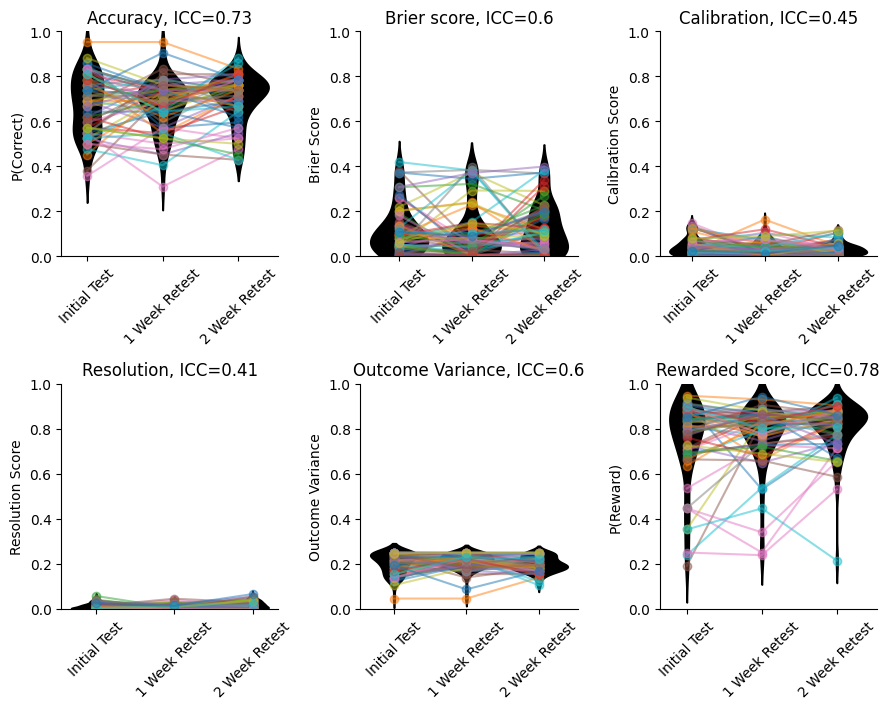

In [17]:
import os
save_bool = False
fig_dir = 'plots/'

alpha = 0.5

fig, ax = plt.subplots(2,3,figsize=np.array([10,8])*.9)
ax = ax.flatten()

ratings = ['accuracy','brier_score','calibration','resolution','outcome_variance','rewarded_score']
violin_color = (.0,.0,.0)

icc_list = []

rename_dict ={'accuracy':'Accuracy','brier_score':'Brier Score','calibration':'Calibration',
    'resolution':'Resolution','outcome_variance':'Outcome Variance','rewarded_score':'Reward Score'}

var_threshold_calibration = 0.007
var_threshold_resolution = 0.0008
threshold_calibration = 0.1
task_summaries_test_calibration = task_summaries.pivot(index='subject_id',columns='test',values='calibration')
task_summaries_test_resolution = task_summaries.pivot(index='subject_id',columns='test',values='resolution')
subject_id_consistent = np.intersect1d(task_summaries_test_calibration.index[(task_summaries_test_calibration.var(axis=1)\
    <var_threshold_calibration)&(task_summaries_test_calibration.mean(axis=1)<threshold_calibration)],\
    task_summaries_test_resolution.index[(task_summaries_test_resolution.var(axis=1)<var_threshold_resolution)])
print(f'{len(subject_id_consistent)} of {task_summaries.subject_id.nunique()} subjects with ' +\
    f'calibration var < {var_threshold_calibration} and resolution var < {var_threshold_resolution}')

task_summaries_ = task_summaries
task_summaries_ = task_summaries.loc[task_summaries.subject_id.isin(subject_id_consistent),:]

for i, rating in enumerate(rename_dict.values()):
    ax[i] = sns.violinplot(x='test',y=rating,data=task_summaries_.rename(columns=rename_dict),ax=ax[i],color=violin_color)
    icc_df = pg.intraclass_corr(data=task_summaries_.rename(columns=rename_dict), raters='test', targets='subject_id', ratings=rating)
    icc_list.append(icc_df.loc[(icc_df.Type=='ICC2k') & (icc_df.Description=='Average random raters'),'ICC'].to_numpy()[0]) 

for subject_id in task_summaries_.subject_id.unique():
    subj_df = task_summaries_.loc[task_summaries_.subject_id==subject_id,:].rename(columns=rename_dict)    
    for i, rating in enumerate(rename_dict.values()):
        ax[i].plot(subj_df['test'],subj_df[rating],'o-',alpha=alpha)
        
# Change x axis labels from (0, 1, 2) to ['Initial Test', '1 Week Retest', '3 Week Retest'] and rotate 45 degrees
ylabels = ['P(Correct)','Brier Score','Calibration Score','Resolution Score','Outcome Variance','P(Reward)']
for i, ax_ in enumerate(ax):
    ax_.set_xticks([0,1,2])
    ax_.set_xticklabels(['Initial Test', '1 Week Retest', '2 Week Retest'])
    ax_.tick_params(axis='x', rotation=45)
    ax_.set_xlabel('')
    ax_.set_ylabel(ylabels[i])
    ax_.set_ylim([0,1])
    
ax[0].set_title(f'Accuracy, ICC={np.round(icc_list[0],2)}')
ax[1].set_title(f'Brier score, ICC={np.round(icc_list[1],2)}')
ax[2].set_title(f'Calibration, ICC={np.round(icc_list[2],2)}')
ax[3].set_title(f'Resolution, ICC={np.round(icc_list[3],2)}')
ax[4].set_title(f'Outcome Variance, ICC={np.round(icc_list[4],2)}')
ax[5].set_title(f'Rewarded Score, ICC={np.round(icc_list[5],2)}')
fig.tight_layout()
sns.despine()

if save_bool:
    fig.savefig(os.path.join(fig_dir,'task_analysis_test_retest.svg'),dpi=300)
plt.show()

## Correlation between accuracy and calibration

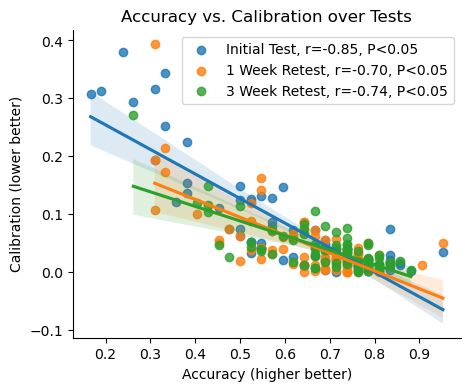

In [7]:
fig_dir = 'plots/'

test_labels = ['Initial Test', '1 Week Retest', '3 Week Retest']

fig, ax = plt.subplots(1,1,figsize=(5,4))
for i, test in enumerate(task_summaries.test.unique()):
    test_df = task_summaries.loc[task_summaries.test==test,:]
    corr, pval = pearsonr(test_df["accuracy"], test_df['calibration'])
    if pval < 0.05:
        p_txt = 'P<0.05'
    else:
        p_txt = 'P={pval:.2f}'
    sns.regplot(x='accuracy',y='calibration',data=test_df,ax=ax,
                label=f'{test_labels[i]}, r={corr:.2f}, {p_txt}')
ax.set_xlabel('Accuracy (higher better)')
ax.set_ylabel('Calibration (lower better)')
ax.legend()
ax.set_title('Accuracy vs. Calibration over Tests')
sns.despine()

fig.savefig(os.path.join(fig_dir,'task_analysis_accuracy_calibration.svg'),dpi=300)
plt.show()

## Look at confidence ratings across sessions

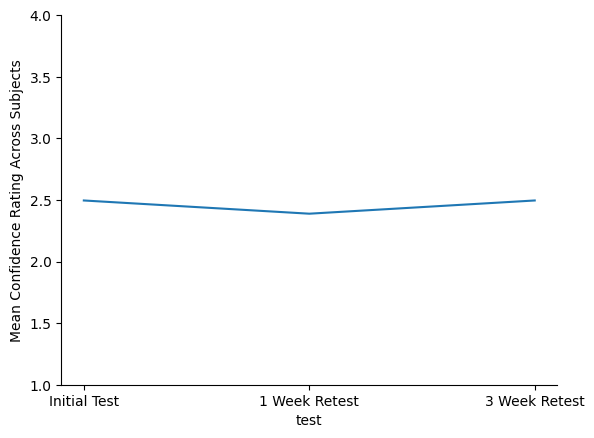

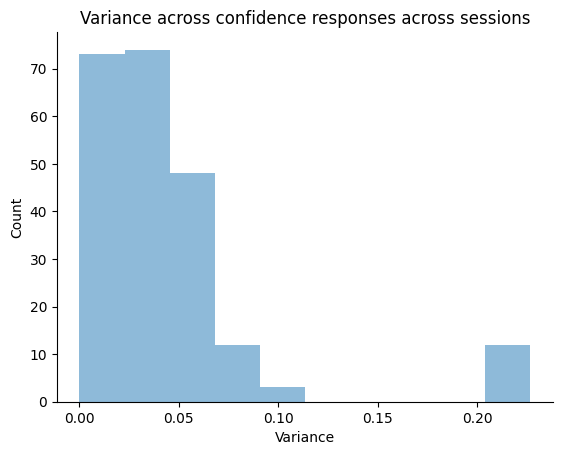

In [82]:
vals, counts, ids, tests, hmeans, variance = [], [], [], [], [], []
for subject in data_test_all.subject_id.unique():
    data_subject = data_test_all.loc[(data_test_all.subject_id==subject) & (data_test_all.block == 'test'),:]
    for test in data_subject.test.unique():
        data_subject_test = data_subject.loc[data_subject.test==test,:]
        val, count =  np.unique(data_subject_test.confidence, return_counts=True)
        vals += val.tolist()
        counts += count.tolist()
        ids += [data_subject.subject_id.iloc[0]]*len(val)
        tests += [test]*len(val)
        hmeans += [hmean(count)]*len(count)
        variance += [np.var(count/sum(count))]*len(count)
        
confidence_resp_var = pd.DataFrame({
    'subject_id':ids,
    'test':tests,
    'confidence':vals,
    'count':counts,
    'hmean':hmeans,
    'var':variance
})

ax = confidence_resp_var.groupby(['test']).mean().reset_index().groupby('test').mean().confidence.plot()
ax.set_xticks([0,1,2])
ax.set_xticklabels(['Initial Test', '1 Week Retest', '3 Week Retest'])
ax.set_ylabel('Mean Confidence Rating Across Subjects')
ax.set_ylim([1,4])
sns.despine()
plt.show()

confidence_resp_var.loc[:,['subject_id','hmean','var']].drop_duplicates()
plt.hist(confidence_resp_var.loc[confidence_resp_var.test==0,'var'],alpha=0.5)
plt.title('Variance across confidence responses across sessions')
plt.xlabel('Variance')
plt.ylabel('Count')
sns.despine()
plt.show()

## Strategies
### Reported strategies in each session, proportion

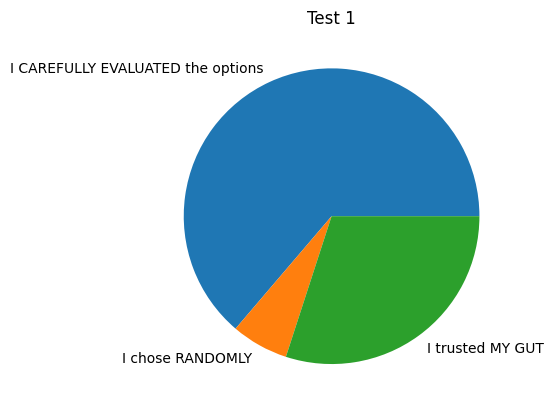

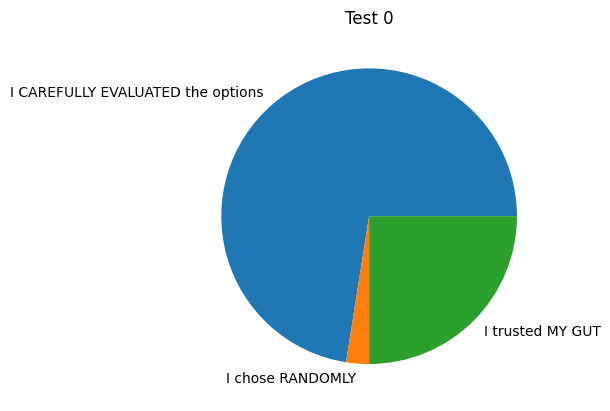

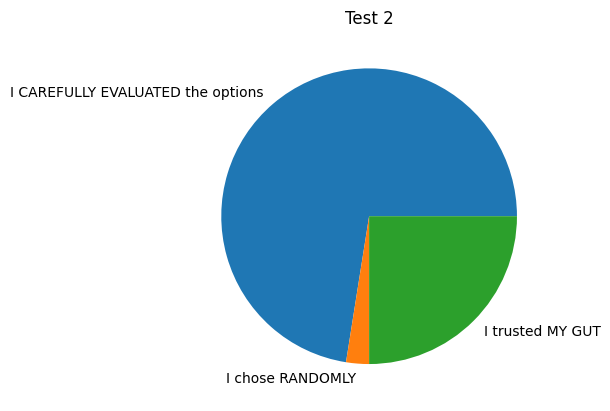

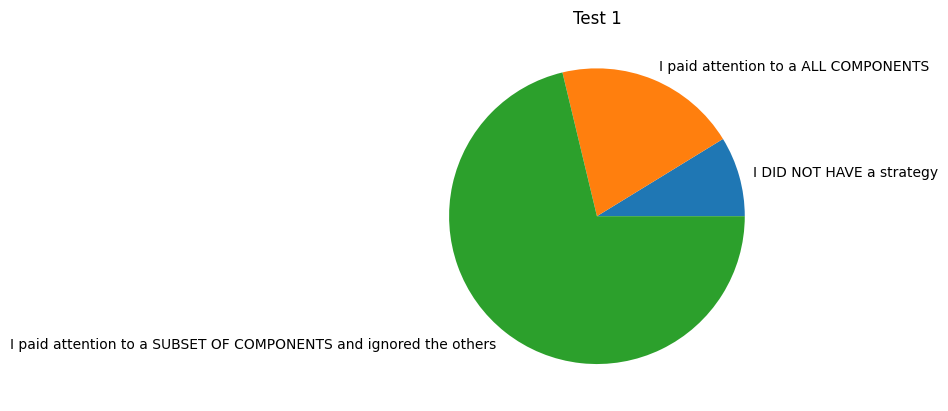

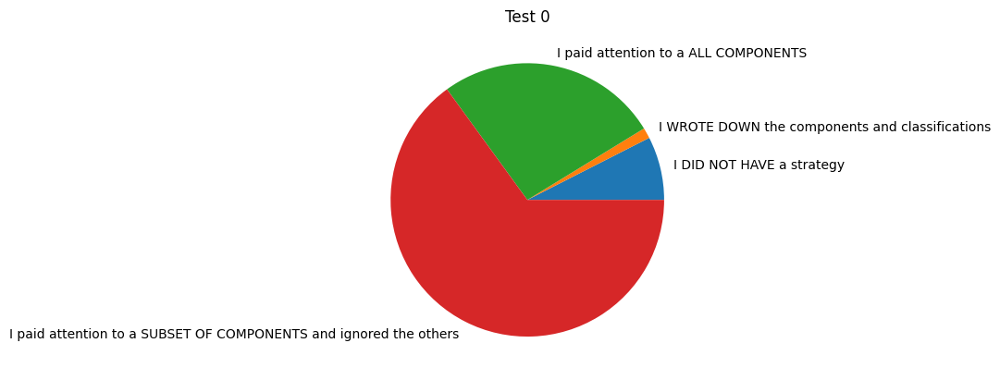

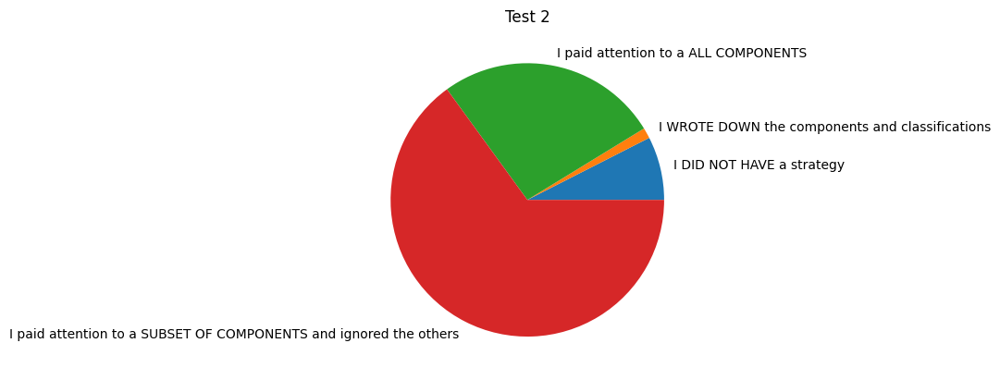

In [83]:
strategy_decision_df = data.loc[data.strategy_prompt == 'decision_process',\
    ['subject_id','strategy_prompt','strategy_response','test']].drop_duplicates().sort_values(by='subject_id')
strategy_classification_df = data.loc[data_all_tests.strategy_prompt == 'strategy_classification',\
    ['subject_id','strategy_prompt','strategy_response','test']].drop_duplicates().sort_values(by='subject_id')

# fig, ax = plt.subplots(1,3,figsize=(10,4))
for test in strategy_decision_df.test.unique():
    test_df = strategy_decision_df.loc[strategy_decision_df.test==test,:]
    resp, count = np.unique(test_df.strategy_response,return_counts=True)
    # ax[test].pie(count,labels=resp)
    # ax[test].set_title(f'Test {test}')
    plt.pie(count,labels=resp)
    plt.title(f'Test {test}')
    plt.show()
# plt.show()

# fig, ax = plt.subplots(1,3,figsize=(10,4))
for test in strategy_classification_df.test.unique():
    test_df = strategy_classification_df.loc[strategy_classification_df.test==test,:]
    resp, count = np.unique(test_df.strategy_response,return_counts=True)
    # ax[test].pie(count,labels=resp)
    # ax[test].set_title(f'Test {test}')
    plt.pie(count,labels=resp)
    plt.title(f'Test {test}')
    plt.show()

### Reported strategies in each session, correspondance with task metrics

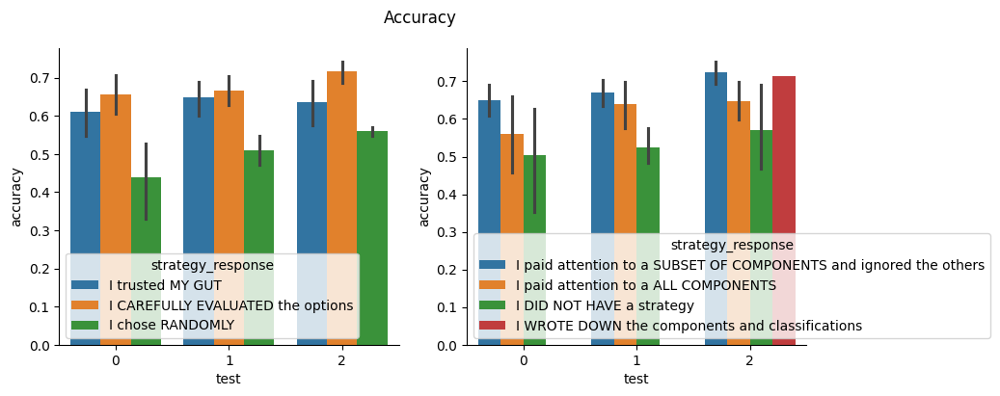

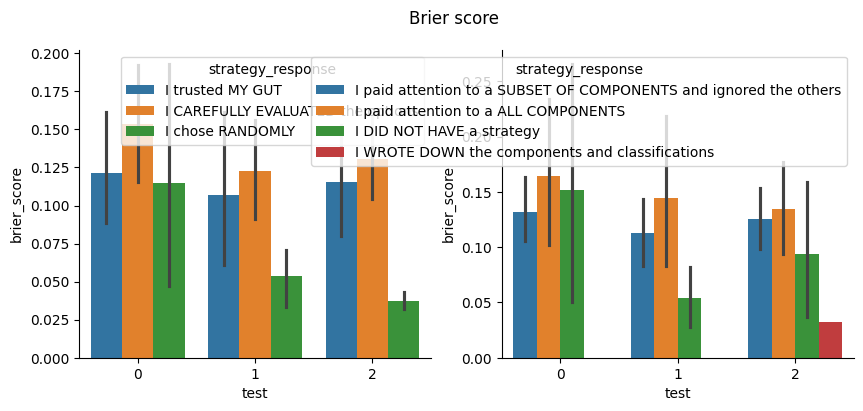

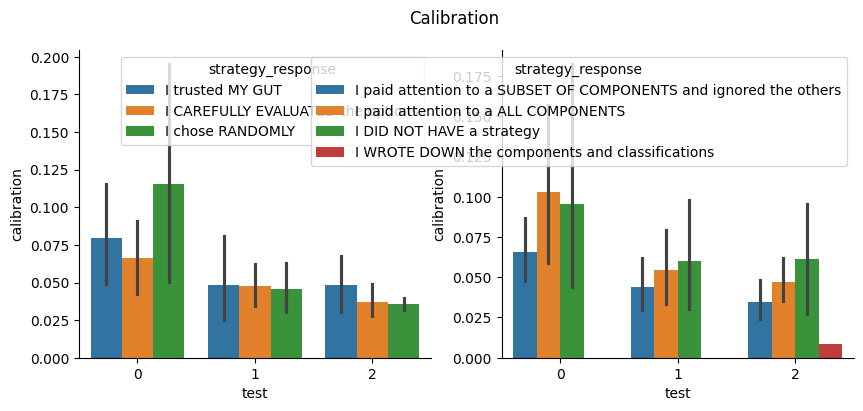

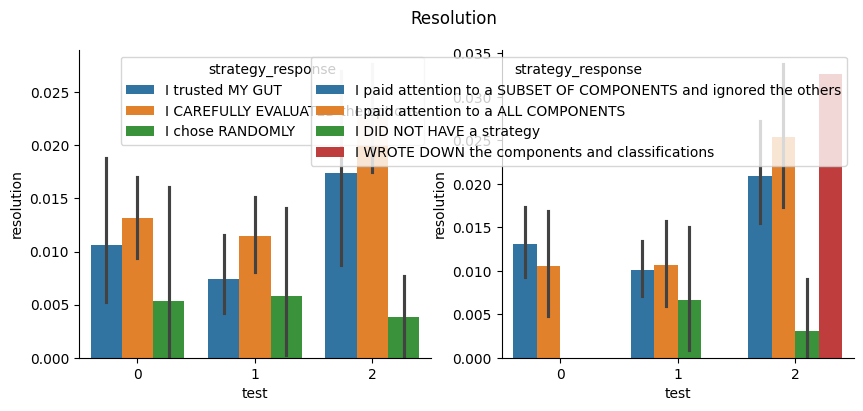

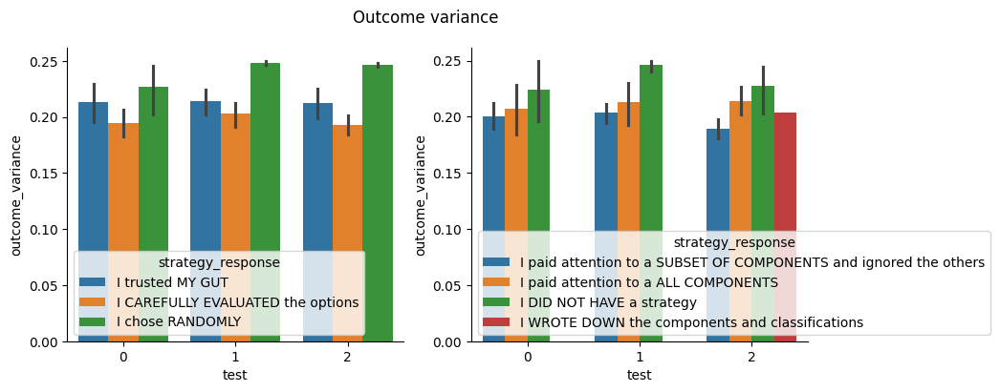

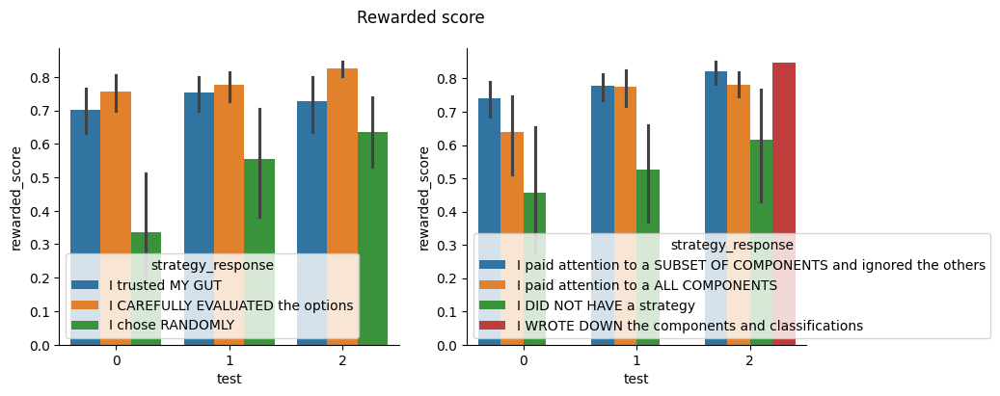

In [24]:
ratings = ['accuracy','brier_score','calibration','resolution','outcome_variance','rewarded_score']


strategy_df = data.loc[:,['subject_id','strategy_prompt','strategy_response','test']].drop_duplicates()
bar_df = pd.merge(strategy_df,task_summaries, on=['subject_id','test'],how='left')

for rating in ratings:
    fig, ax = plt.subplots(1,2,figsize=(10,4))
    bar_decision_df = bar_df.loc[bar_df.strategy_prompt == 'decision_process']
    ax[0] = sns.barplot(data=bar_decision_df,x='test',y=rating,hue='strategy_response',ax=ax[0])

    bar_classification_df = bar_df.loc[bar_df.strategy_prompt == 'strategy_classification']
    ax[1] = sns.barplot(data=bar_classification_df,x='test',y=rating,hue='strategy_response',ax=ax[1])
    fig.suptitle(rating.replace('_',' ').capitalize())
    sns.despine()
    plt.show()

### Reported strategies correspondence between decision process and classification. 

Text(50.7222222222222, 0.5, 'Decision Process')

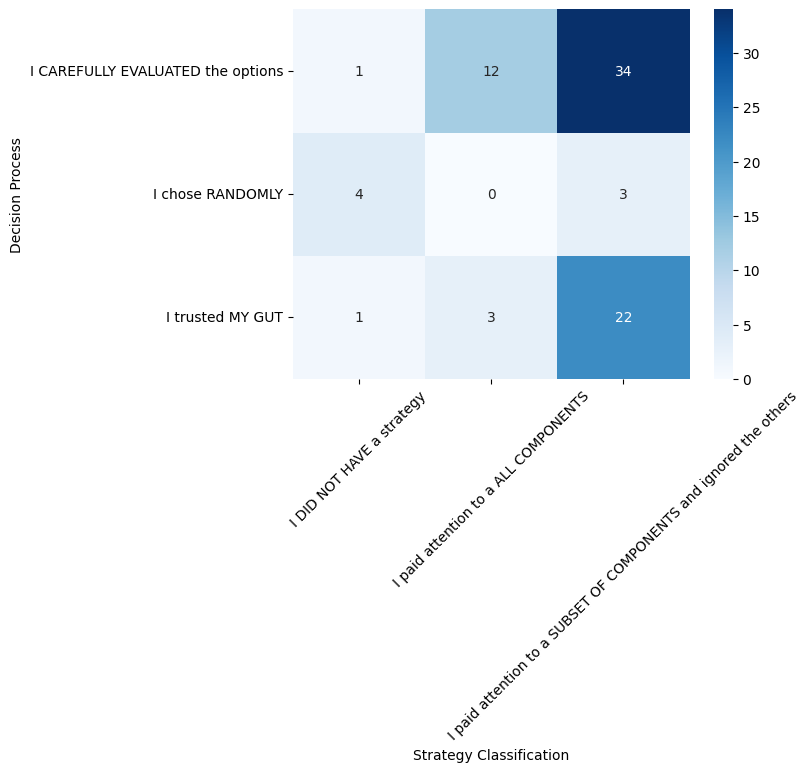

In [25]:
test = 0 # set to 0, 1, 2

bar_df = pd.merge(strategy_df,task_summaries, on=['subject_id','test'],how='left')
strategy_df_tmp = bar_df.loc[:,['subject_id','strategy_prompt','strategy_response','test']].drop_duplicates()
strategy_df_tmp = strategy_df_tmp.loc[strategy_df_tmp.test==test,:]

strategy_df_tmp = strategy_df_tmp.pivot(index='subject_id',columns='strategy_prompt',values='strategy_response').loc[:,['decision_process','strategy_classification']]

# Create a cross-tabulation
cross_tab = pd.crosstab(index=strategy_df_tmp['decision_process'], columns=strategy_df_tmp['strategy_classification'])

# # Create the 2x2 countplot
ax = sns.heatmap(cross_tab, annot=True, fmt='d', cmap='Blues')
ax.tick_params(axis='x', rotation=45)
ax.set_xlabel('Strategy Classification')
ax.set_ylabel('Decision Process')


## Correlations of task metrics with demographics


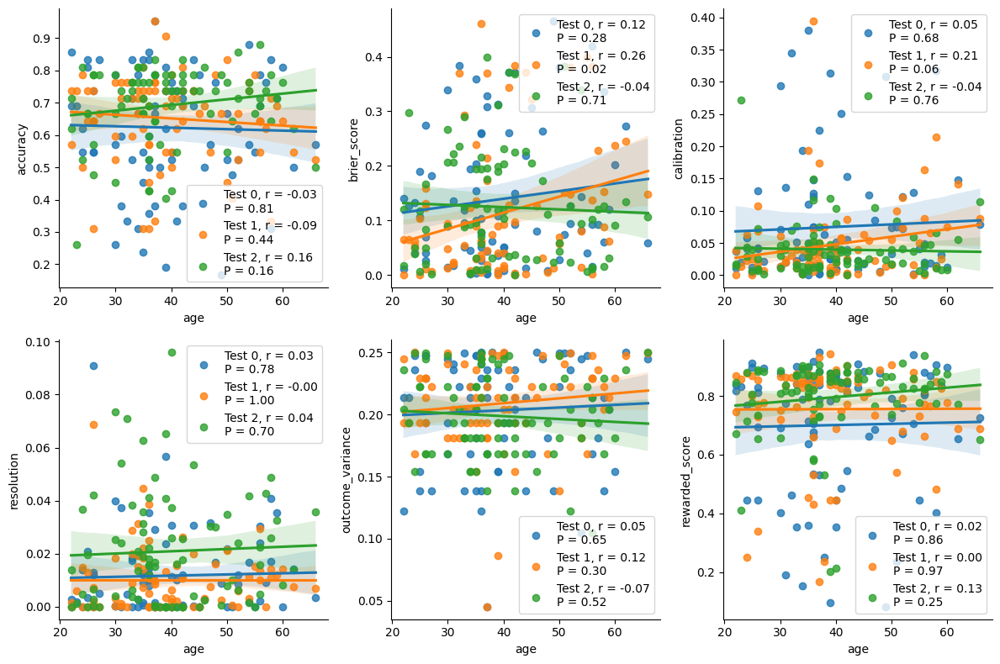

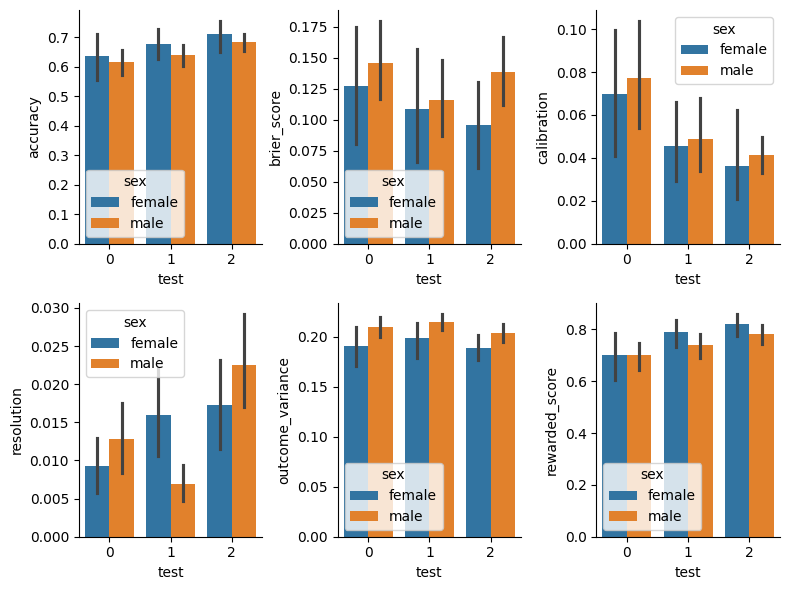

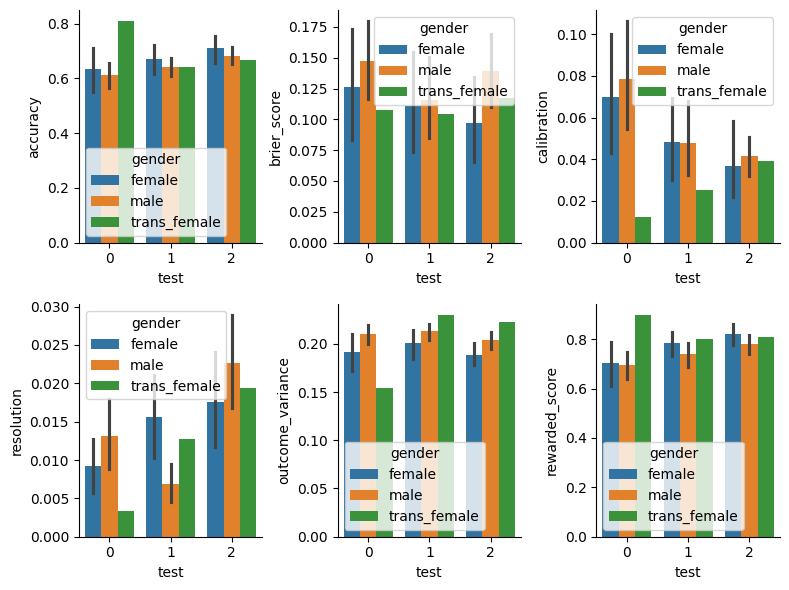

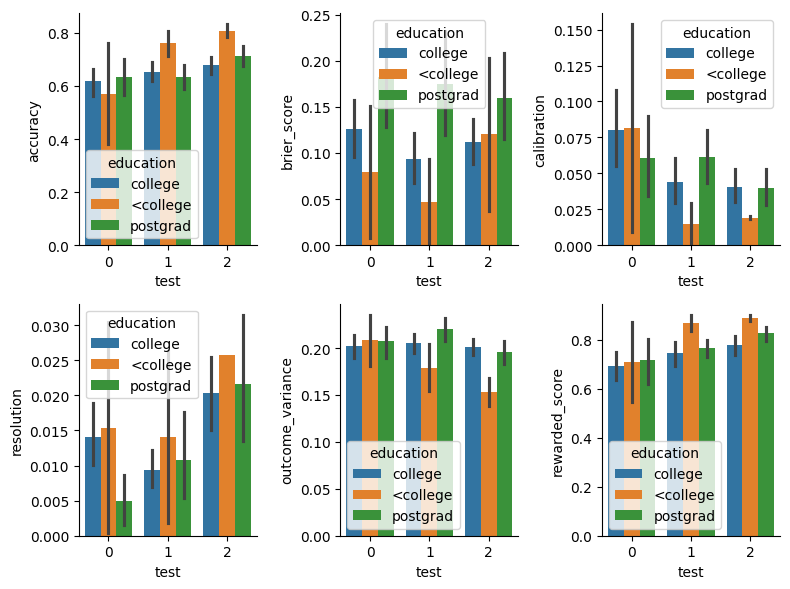

In [50]:
data_demographics = data_questionnaires.loc[:,['subject_id','gender', 'sex', 'age','education']].drop_duplicates()

joint_task_demographics = pd.merge(data_demographics,task_summaries, on='subject_id',how='right')

ratings = ['accuracy','brier_score','calibration','resolution','outcome_variance','rewarded_score']

fig, ax = plt.subplots(2,3,figsize=(12,8))
ax = ax.flatten()
for i, rating in enumerate(ratings):
    for test in joint_task_demographics.test.unique():
        joint_test_df = joint_task_demographics.loc[joint_task_demographics.test==test,:]
        corr, pval = pearsonr(joint_test_df["age"], joint_test_df[rating])
        ax[i] = sns.regplot(data=joint_test_df,x='age', y=rating,
            label=f'Test {test}, r = {corr:.2f}\nP = {pval:.2f}',ax=ax[i])
    ax[i].legend()
sns.despine()
fig.tight_layout()
plt.show()


fig, ax = plt.subplots(2,3,figsize=(8,6))
ax = ax.flatten()
for i, rating in enumerate(ratings):
    ax[i] = sns.barplot(data=joint_task_demographics,x='test',y=rating,hue='sex',ax=ax[i])
sns.despine()
fig.tight_layout()
plt.show()

fig, ax = plt.subplots(2,3,figsize=(8,6))
ax = ax.flatten()
for i, rating in enumerate(ratings):
    ax[i] = sns.barplot(data=joint_task_demographics,x='test',y=rating,hue='gender',ax=ax[i])
sns.despine()
fig.tight_layout()
plt.show()

fig, ax = plt.subplots(2,3,figsize=(8,6))
ax = ax.flatten()
for i, rating in enumerate(ratings):
    ax[i] = sns.barplot(data=joint_task_demographics,x='test',y=rating,hue='education',ax=ax[i])
sns.despine()
fig.tight_layout()
plt.show()

# Questionnaire responses
## Overall scores
### Histogram of individual scores

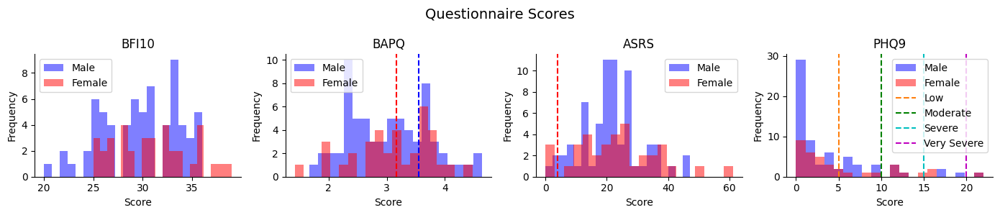

In [51]:
extension = 'png'
fig_dir = 'plots/'
save_bool = False

questionnaires = overall_scores_df['questionnaire_name'].unique()

# fig, axs = plt.subplots(2,2,figsize=(10,7))
fig, axs = plt.subplots(1,4,figsize=(14,3))
axs = axs.reshape(-1)
for i, questionnaire in enumerate(questionnaires):
    data = overall_scores_df.loc[overall_scores_df['questionnaire_name'] == questionnaire]
    axs[i].hist(data.loc[data['gender']=='male',['score']], bins=20, color='b',alpha=0.5,label='Male')
    axs[i].hist(data.loc[data['gender']=='female',['score']], bins=20, color='r',alpha=0.5,label='Female')
    axs[i].set_title(questionnaire.upper())
    axs[i].set_xlabel('Score')
    axs[i].set_ylabel('Frequency')
    if questionnaire == 'bapq':
        axs[i].axvline(x=3.55, color='b', linestyle='--')
        axs[i].axvline(x=3.17, color='r', linestyle='--')
    if questionnaire == 'phq9':
        axs[i].axvline(x=5, color='tab:orange', linestyle='--', label='Low')
        axs[i].axvline(x=10, color='g', linestyle='--', label='Moderate')
        axs[i].axvline(x=15, color='c', linestyle='--', label='Severe')
        axs[i].axvline(x=20, color='m', linestyle='--', label='Very Severe')
    if questionnaire == 'asrs':
        axs[i].axvline(x=4, color='r', linestyle='--')
    axs[i].legend()
    # axs[i].hist(data['score'], bins=20, color='#1f77b4')
# axs[-1].axis('off')
sns.despine()
fig.suptitle('Questionnaire Scores',fontsize=14)
fig.tight_layout()
if save_bool:
    fig.savefig(os.path.join(fig_dir,f"questionnaire_scores_cutoffs.{extension}"), dpi=300, bbox_inches='tight',facecolor='white')
plt.show()

### Covariance, overall scores

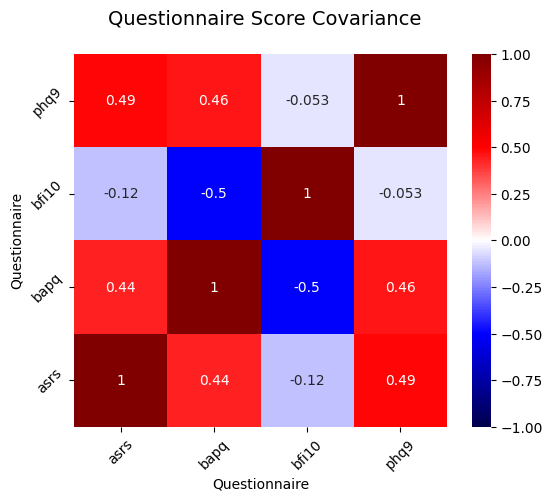

In [52]:
fig_dir = 'plots/'
save_bool = False

vals_overall = overall_scores_df.pivot_table(values='score', index='subject_id', columns='questionnaire_name', aggfunc='first')
vals_overall = (vals_overall - vals_overall.mean())/vals_overall.std()

fig, ax = plt.subplots(1,1,figsize=(6,5))

ax = sns.heatmap(vals_overall.cov(),ax=ax,vmin=-1,vmax=1,annot=True,cmap='seismic')
# ax[0] = sns.heatmap(np.cov(vals_overall.T),ax=ax[0],vmin=0,vmax=1,annot=True)

ax.invert_yaxis()
ax.get_xaxis().set_ticklabels(vals_overall.columns,rotation=45)
ax.get_yaxis().set_ticklabels(vals_overall.columns,rotation=45)
ax.set_aspect('equal', adjustable='box')
ax.set_xlabel('Questionnaire')
ax.set_ylabel('Questionnaire')
fig.suptitle('Questionnaire Score Covariance',fontsize=14)
fig.tight_layout()

if save_bool:
    fig.savefig(os.path.join(fig_dir,'overall_score_covariance.png'),dpi=300, bbox_inches='tight',facecolor='white')

### Subscale covariance

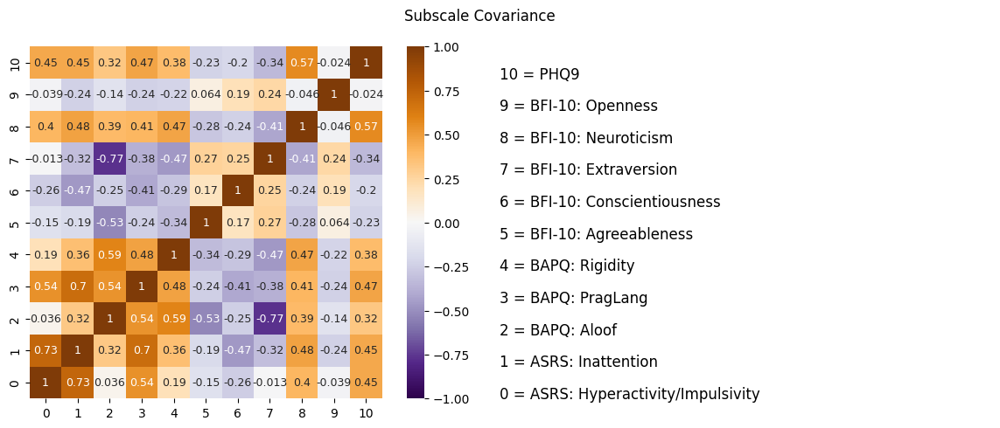

In [55]:
save_bool = False
fig_dir = 'plots/'

vals_subscales = subscale_scores_df.pivot_table(values='score', index='subject_id', columns='subscale', aggfunc='first')
vals_subscales = (vals_subscales - vals_subscales.mean())/vals_subscales.std()

fontsize = 9

fig, ax = plt.subplots(1,2,figsize=np.array([20,8])*.6)

vals_subscales = renameDfColumns(vals_subscales)

ax[0] = sns.heatmap(np.cov(vals_subscales.T),ax=ax[0],vmin=-1,vmax=1,annot=True,annot_kws={"fontsize":fontsize},cmap='PuOr_r')
ax[0].invert_yaxis()
ax[0].set_aspect('equal', adjustable='box')
ax[1].set_axis_off()
for i, label in zip(np.arange(len(vals_subscales.columns)),vals_subscales.columns):
    ax[1].text(0,i/len(vals_subscales.columns),f'{i} = {label}',fontsize=fontsize+3)

fig.suptitle('Subscale Covariance',fontsize=12)
fig.tight_layout()

if save_bool:
    fig.savefig(os.path.join(fig_dir,'subscale_score_covariance.svg'), dpi=300, bbox_inches='tight',facecolor='white')

plt.show()

### Subscales, individual score histograms

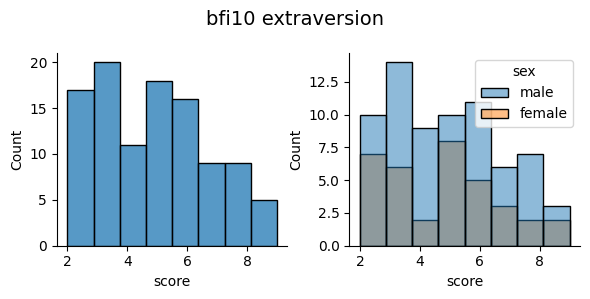

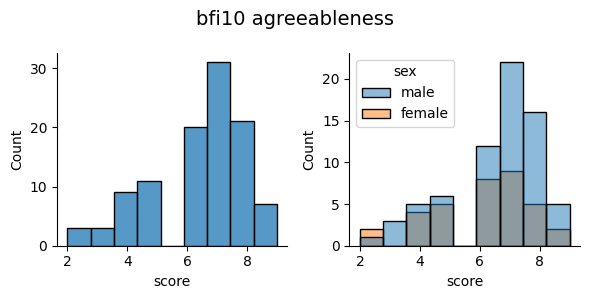

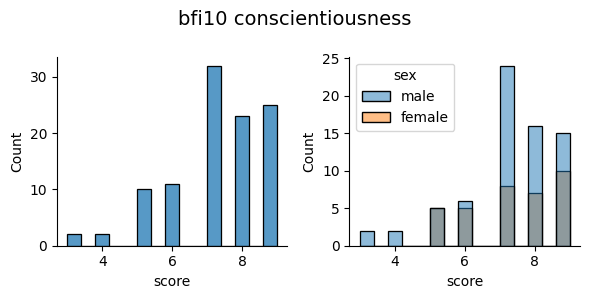

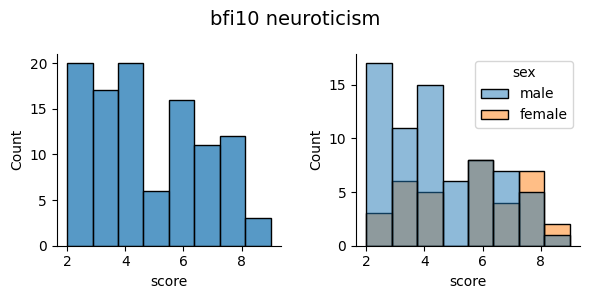

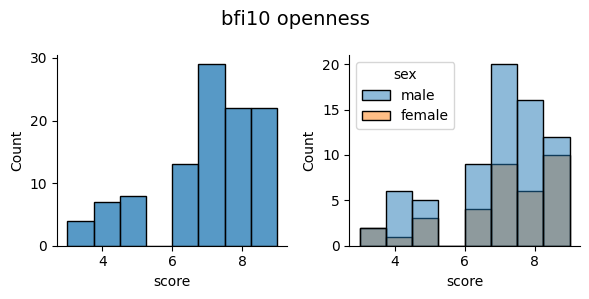

...

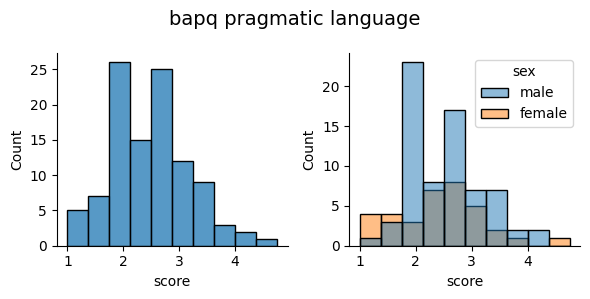

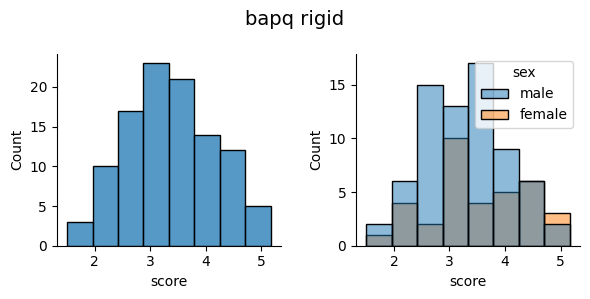

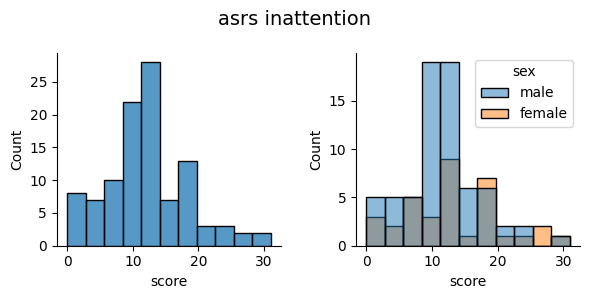

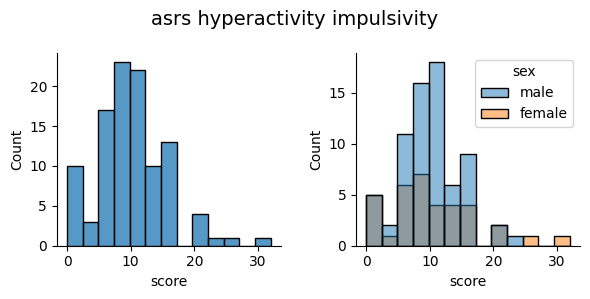

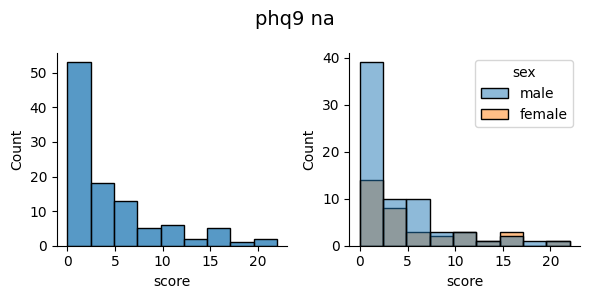

In [57]:
fig_dir = 'plots/'
save_bool = False

for subscale in subscale_scores_df['subscale'].unique():
    # if 'conners' not in subscale:
    #     continue
    fig, ax = plt.subplots(1,2,figsize=(6,3))
    vals_df = subscale_scores_df.loc[subscale_scores_df['subscale'] == subscale,['sex','gender','score']]
    ax[0] = sns.histplot(data=vals_df, x='score',ax=ax[0])
    ax[1] = sns.histplot(data=vals_df, x='score',hue='sex',ax=ax[1])
    sns.despine()
    fig.suptitle(subscale.replace('_',' '),fontsize=14)
    fig.tight_layout()
    if save_bool:
        fig.savefig(os.path.join(fig_dir,f"subscales_{subscale}.{extension}"), dpi=300, bbox_inches='tight',facecolor='white')
    plt.show()

# Task metrics and questionnaire scores together
## Join the questionnaire and the task data

In [6]:
overall_scores_df.subject_id = overall_scores_df.subject_id.astype(int)
subscale_scores_df.subject_id = subscale_scores_df.subject_id.astype(int)
task_summaries.subject_id = task_summaries.subject_id.astype(int)

joint_overall_scores_df = pd.merge(overall_scores_df, task_summaries, on='subject_id', how='right')
joint_subscale_scores_df = pd.merge(subscale_scores_df, task_summaries, on='subject_id', how='right')

### Correlation plot between task metrics and questionnaires
#### Overall questionnaire scores

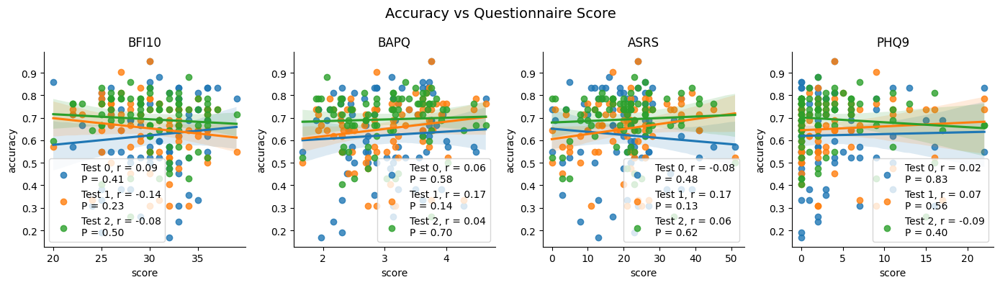

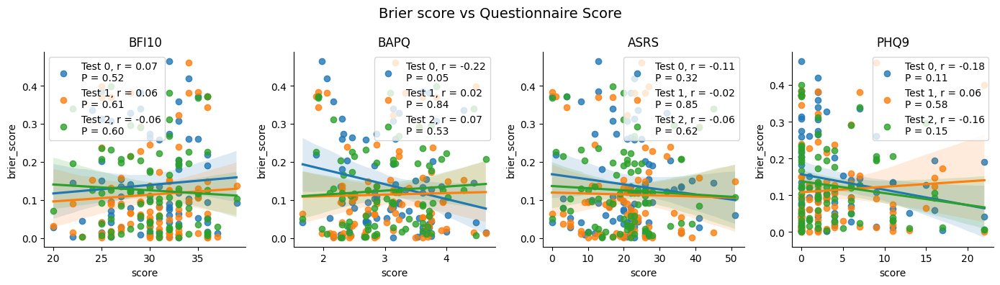

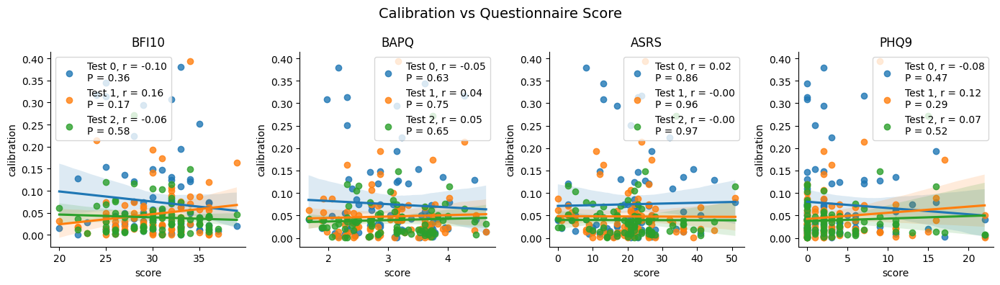

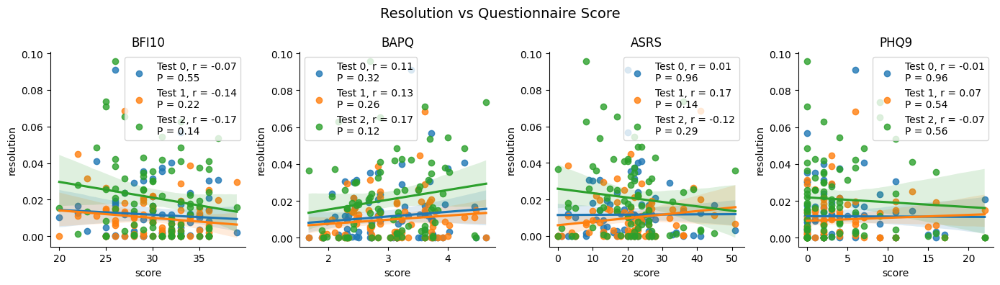

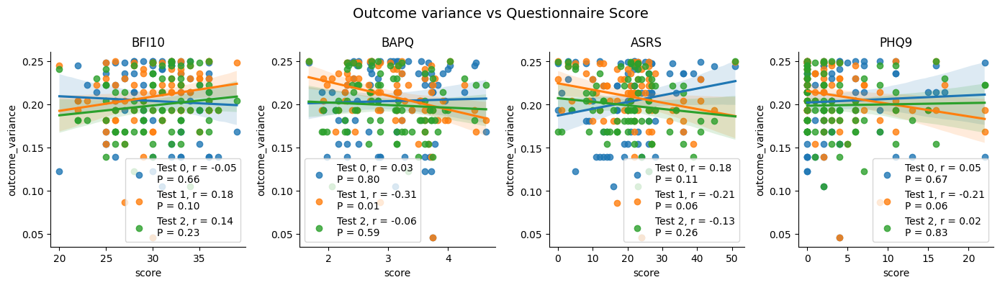

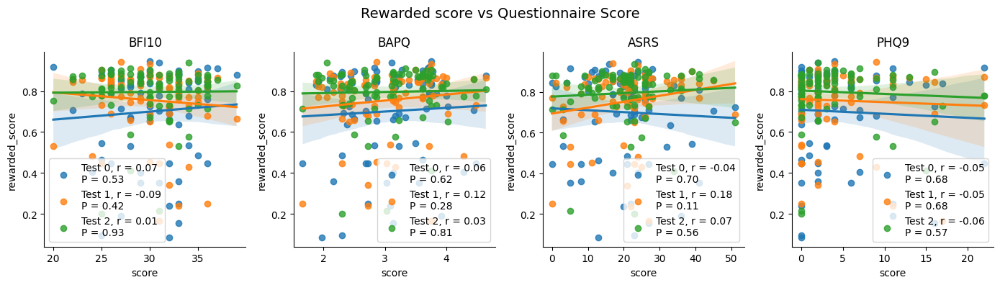

In [60]:
from scipy.stats import pearsonr

ratings = ['accuracy','brier_score','calibration','resolution','outcome_variance','rewarded_score']

for rating in ratings:
    fig, ax = plt.subplots(1,4,figsize=(14,4))
    for i, questionnaire_name in enumerate(joint_overall_scores_df.questionnaire_name.unique()):
        joint_df = joint_overall_scores_df.loc[joint_overall_scores_df.questionnaire_name==questionnaire_name,:]
        for test in joint_overall_scores_df.test.unique():
            joint_test_df = joint_df.loc[joint_df.test==test,:]
            corr, pval = pearsonr(joint_test_df["score"], joint_test_df[rating])
            ax[i] = sns.regplot(data=joint_test_df,x='score', y=rating,
                label=f'Test {test}, r = {corr:.2f}\nP = {pval:.2f}',ax=ax[i])
        ax[i].legend()
        ax[i].set_title(questionnaire_name.upper())
    fig.suptitle(f"{rating.replace('_',' ').capitalize()} vs Questionnaire Score",fontsize=14)        
    fig.tight_layout()
    sns.despine()
    plt.show()

#### Subscale scores

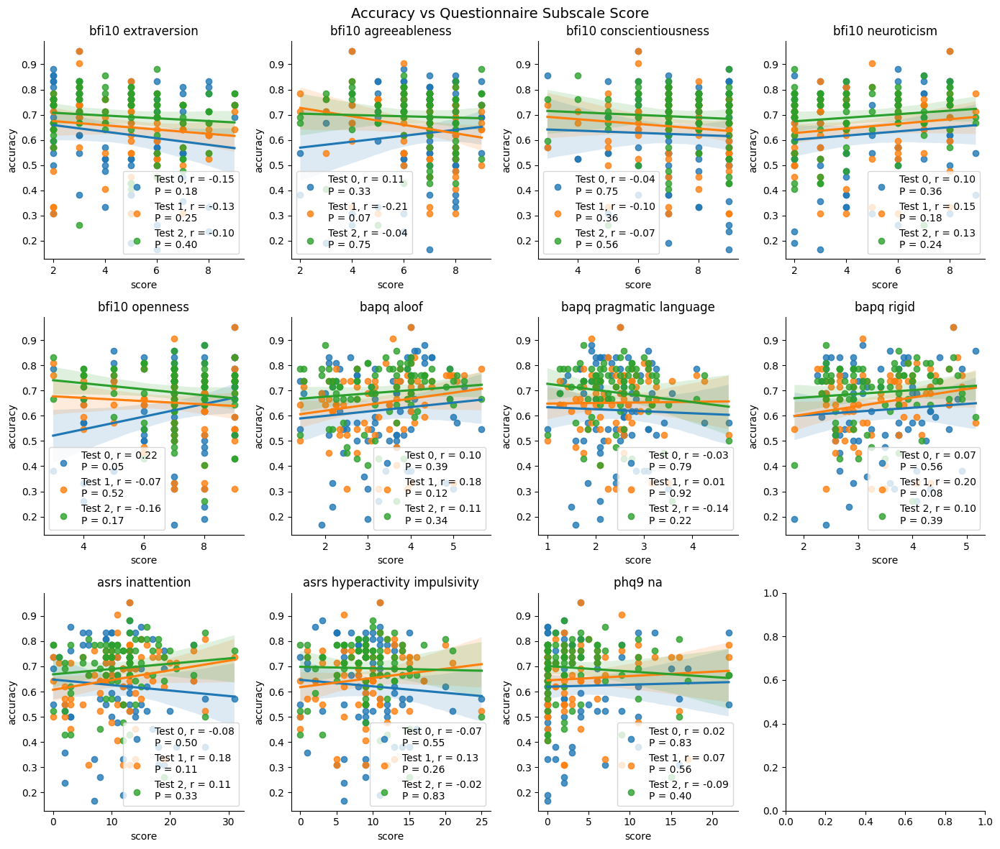

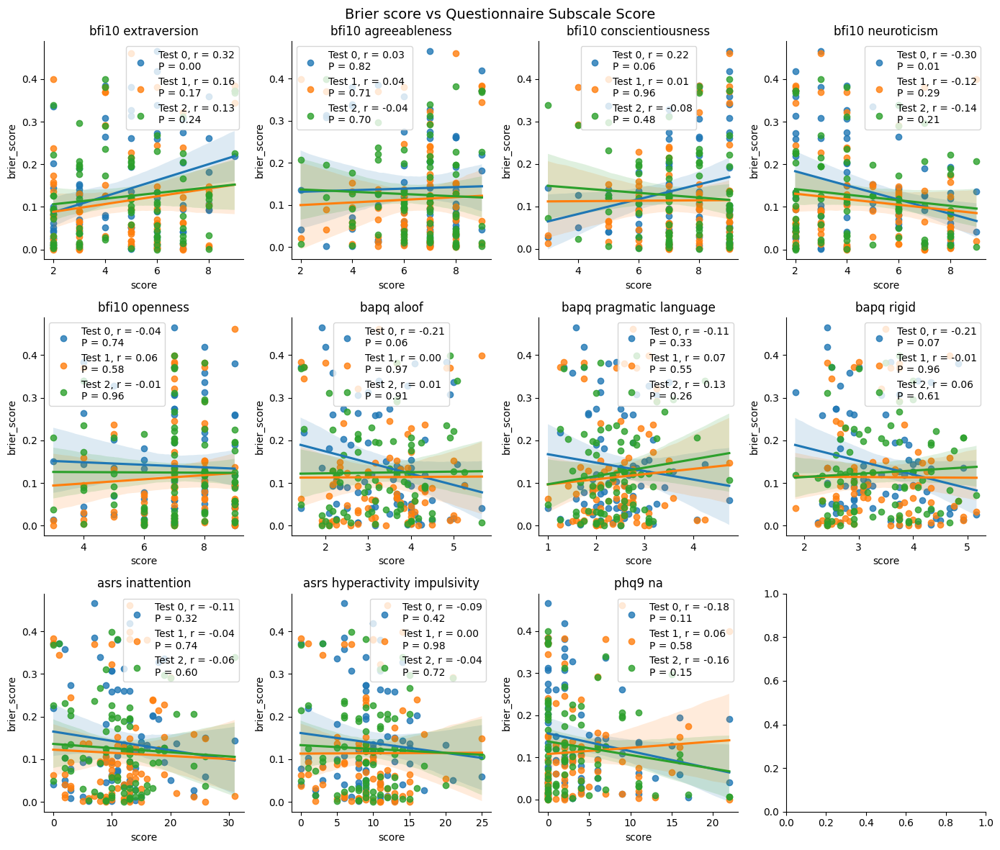

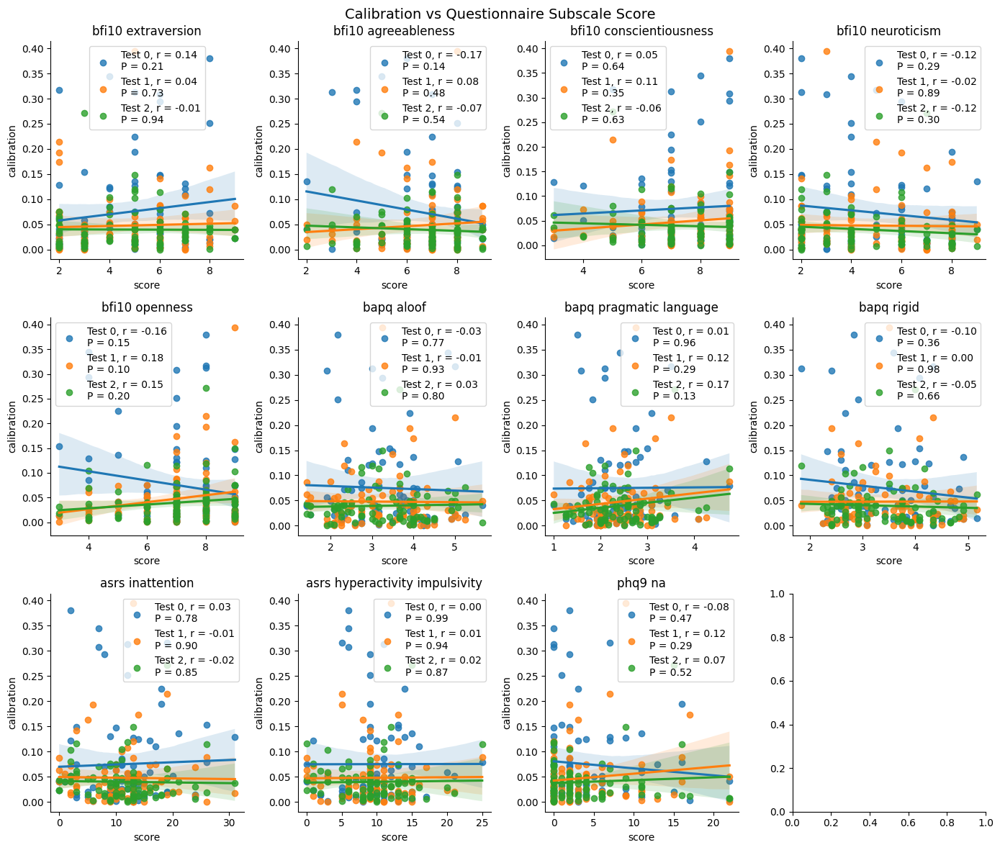

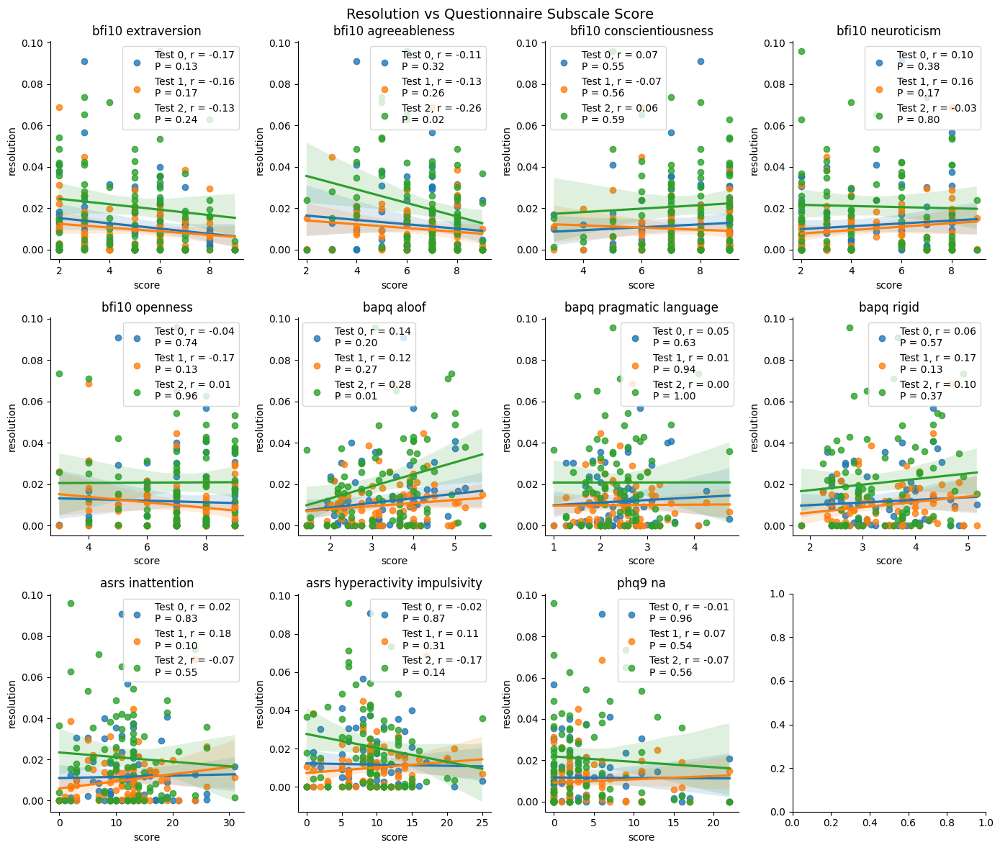

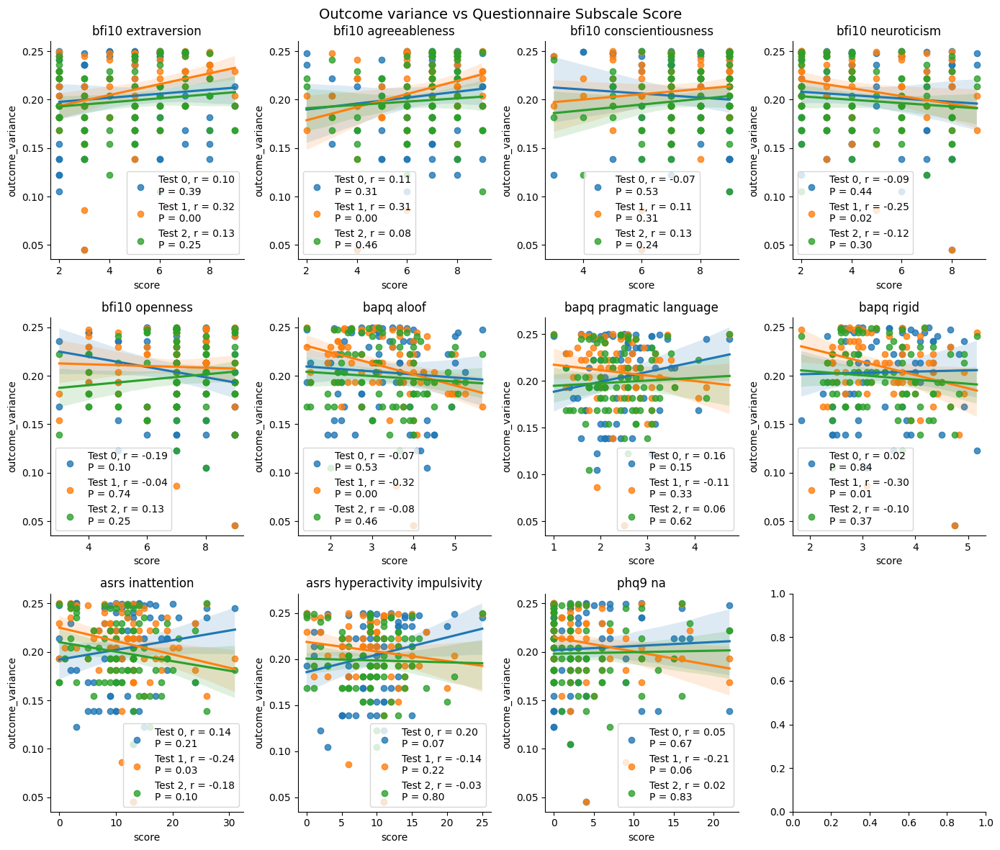

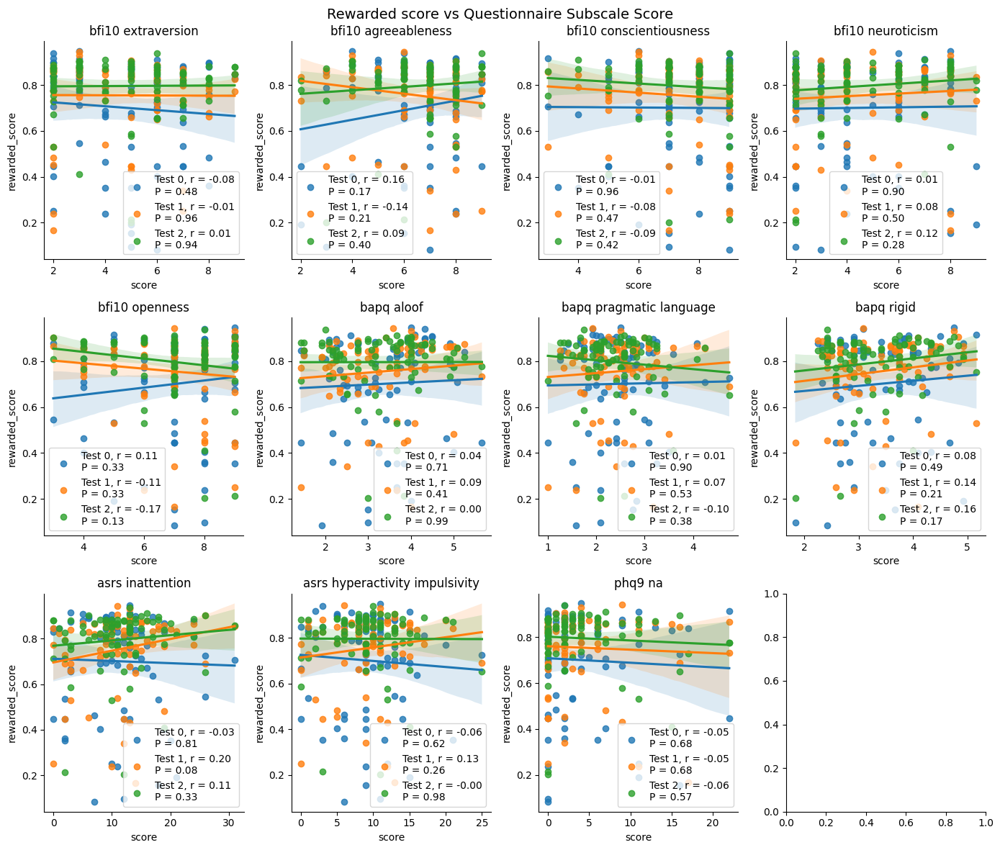

In [61]:
ratings = ['accuracy','brier_score','calibration','resolution','outcome_variance','rewarded_score']

for rating in ratings:
    fig, ax = plt.subplots(3,4,figsize=(14,12))
    ax = ax.flatten()
    for i, subscale in enumerate(joint_subscale_scores_df.subscale.unique()):
        joint_df = joint_subscale_scores_df.loc[joint_subscale_scores_df.subscale==subscale,:]
        for test in joint_df.test.unique():
            joint_test_df = joint_df.loc[joint_df.test==test,:]
            corr, pval = pearsonr(joint_test_df["score"], joint_test_df[rating])
            ax[i] = sns.regplot(data=joint_test_df,x='score', y=rating,
                label=f'Test {test}, r = {corr:.2f}\nP = {pval:.2f}',ax=ax[i])
        ax[i].legend()
        ax[i].set_title(subscale.replace('_',' '))
    fig.suptitle(f"{rating.replace('_',' ').capitalize()} vs Questionnaire Subscale Score",fontsize=14)        
    fig.tight_layout()
    sns.despine()
    plt.show()

## Correlations between task metric variance across sessions and questionnaire responses
#### Calculate the variance

In [62]:
joint_overall_scores_var_df = pd.merge(overall_scores_df, task_summaries.groupby('subject_id').var().drop(columns=['test']), on='subject_id', how='inner')
joint_subscale_scores_var_df = pd.merge(subscale_scores_df, task_summaries.groupby('subject_id').var().drop(columns=['test']), on='subject_id', how='inner')

#### Overall questionnaire scores

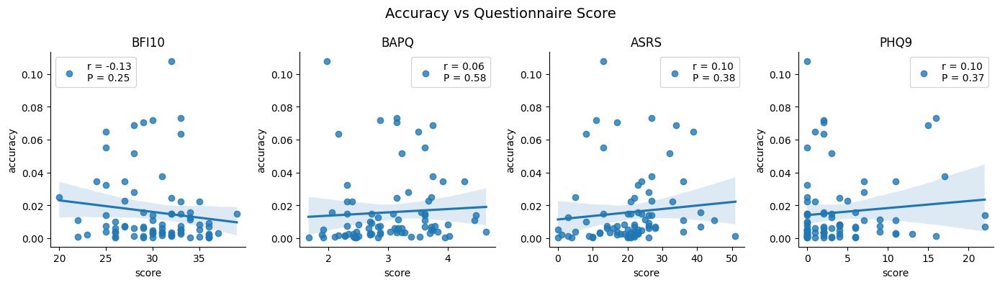

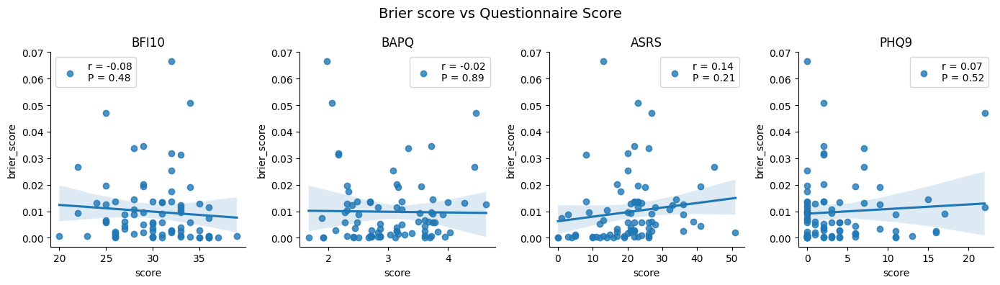

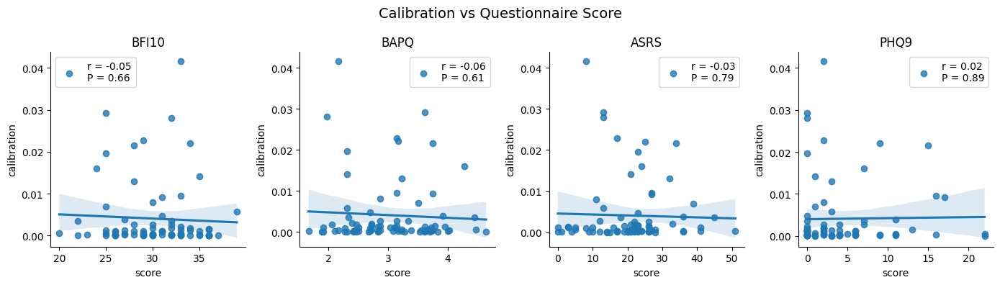

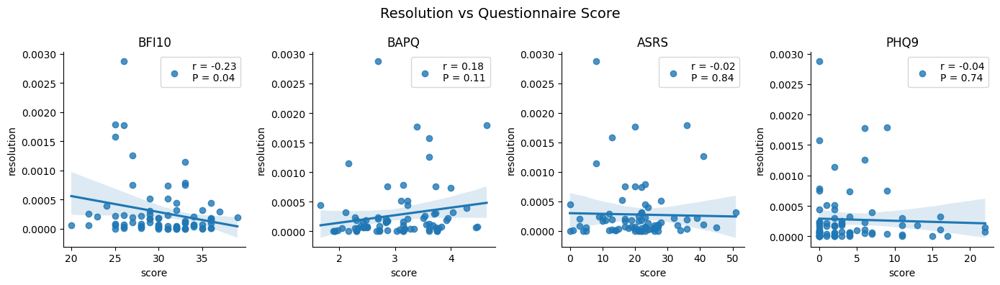

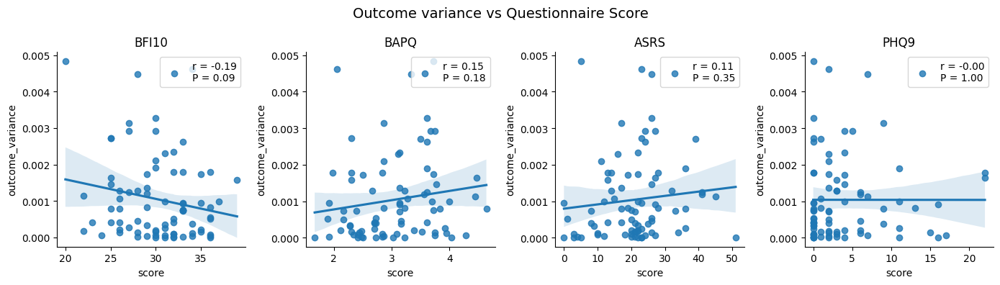

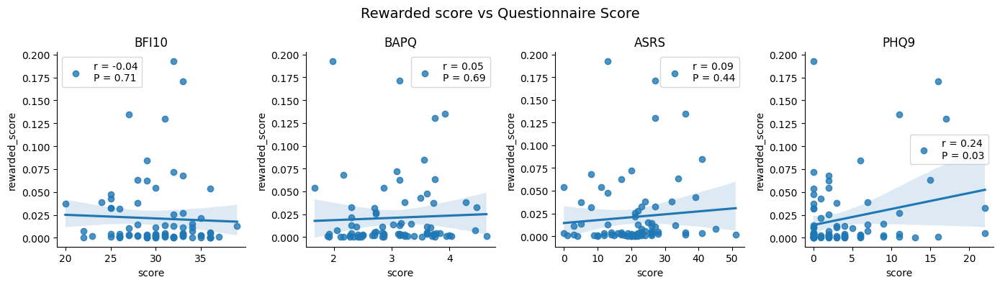

In [63]:
ratings = ['accuracy','brier_score','calibration','resolution','outcome_variance','rewarded_score']

for rating in ratings:
    fig, ax = plt.subplots(1,4,figsize=(14,4))
    for i, questionnaire_name in enumerate(joint_overall_scores_var_df.questionnaire_name.unique()):
        joint_df = joint_overall_scores_var_df.loc[joint_overall_scores_var_df.questionnaire_name==questionnaire_name,:]
        corr, pval = pearsonr(joint_df["score"], joint_df[rating])
        ax[i] = sns.regplot(data=joint_df,x='score', y=rating,
            label=f'r = {corr:.2f}\nP = {pval:.2f}',ax=ax[i])
        ax[i].legend()
        ax[i].set_title(questionnaire_name.upper())
    fig.suptitle(f"{rating.replace('_',' ').capitalize()} vs Questionnaire Score",fontsize=14)        
    fig.tight_layout()
    sns.despine()
    plt.show()

#### Subscales

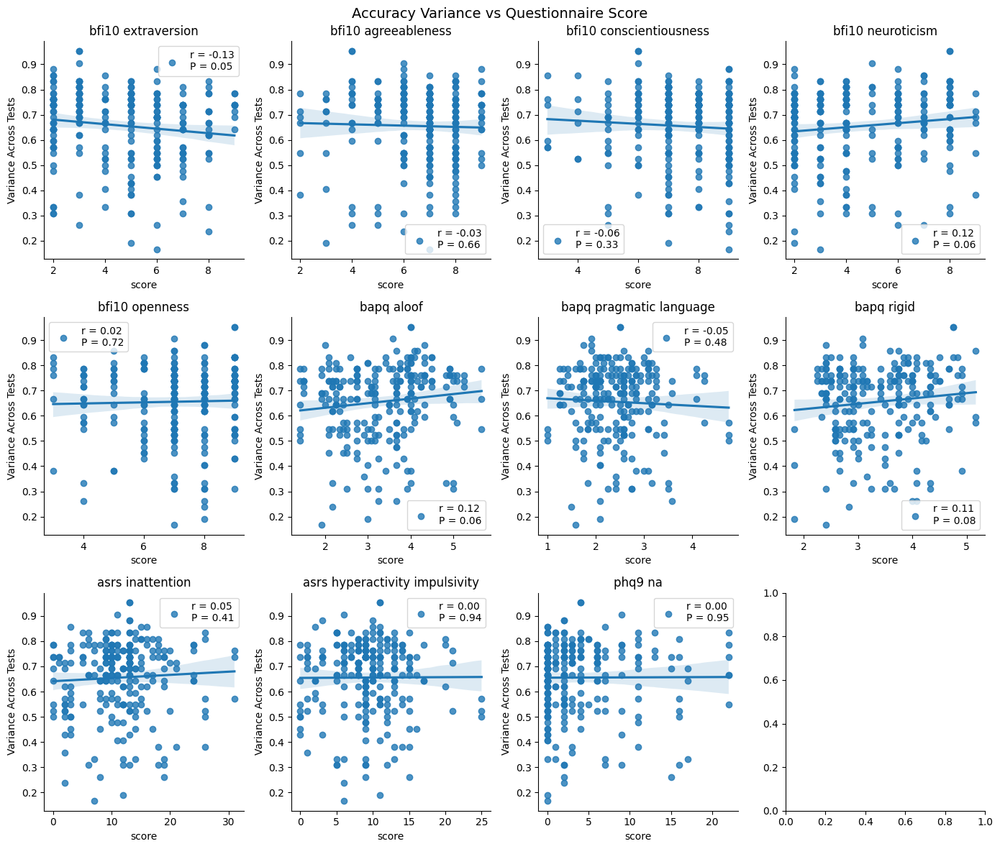

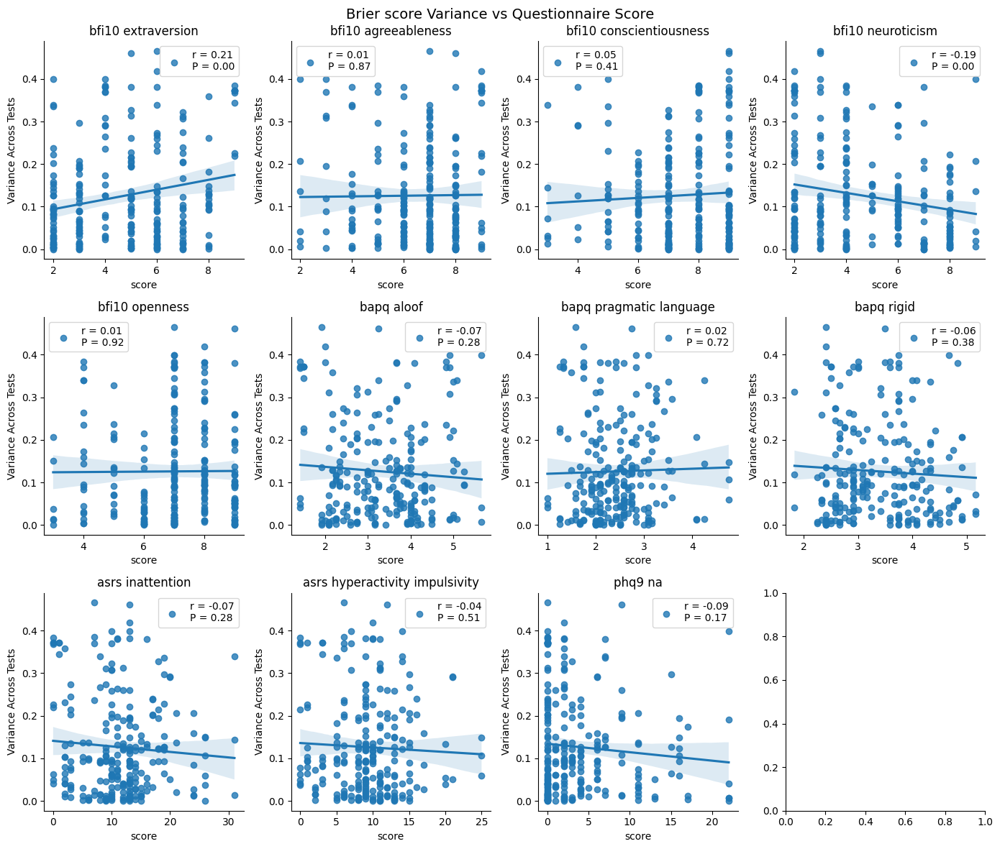

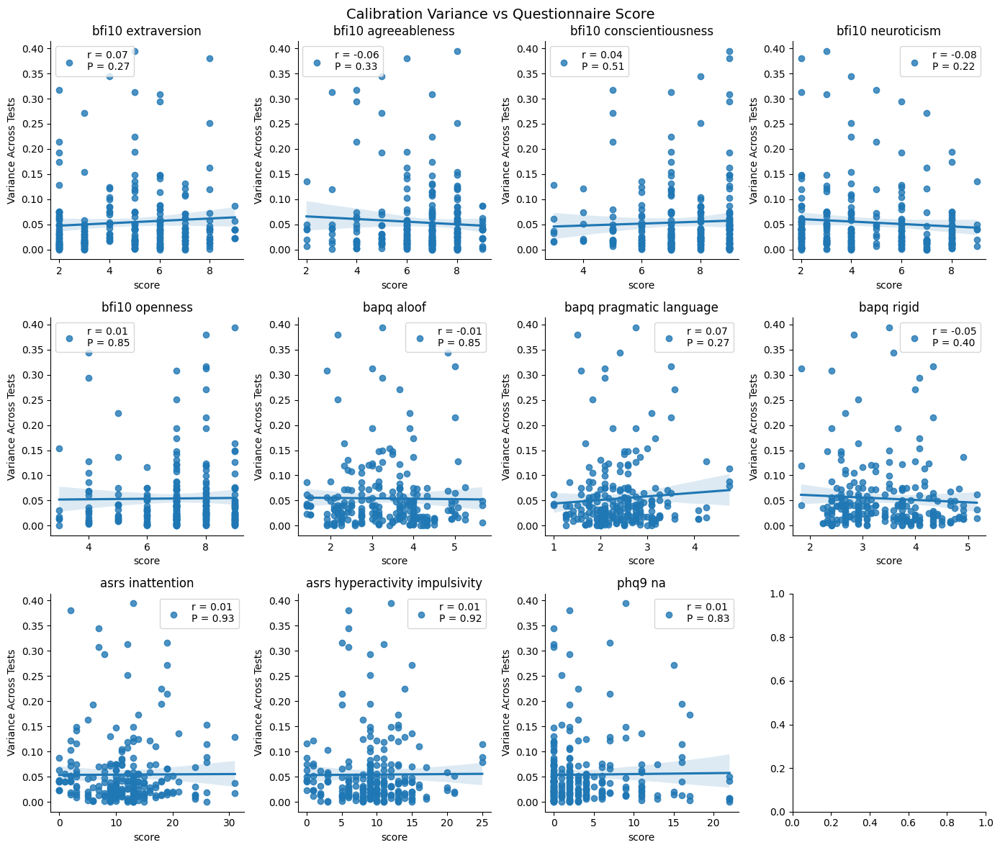

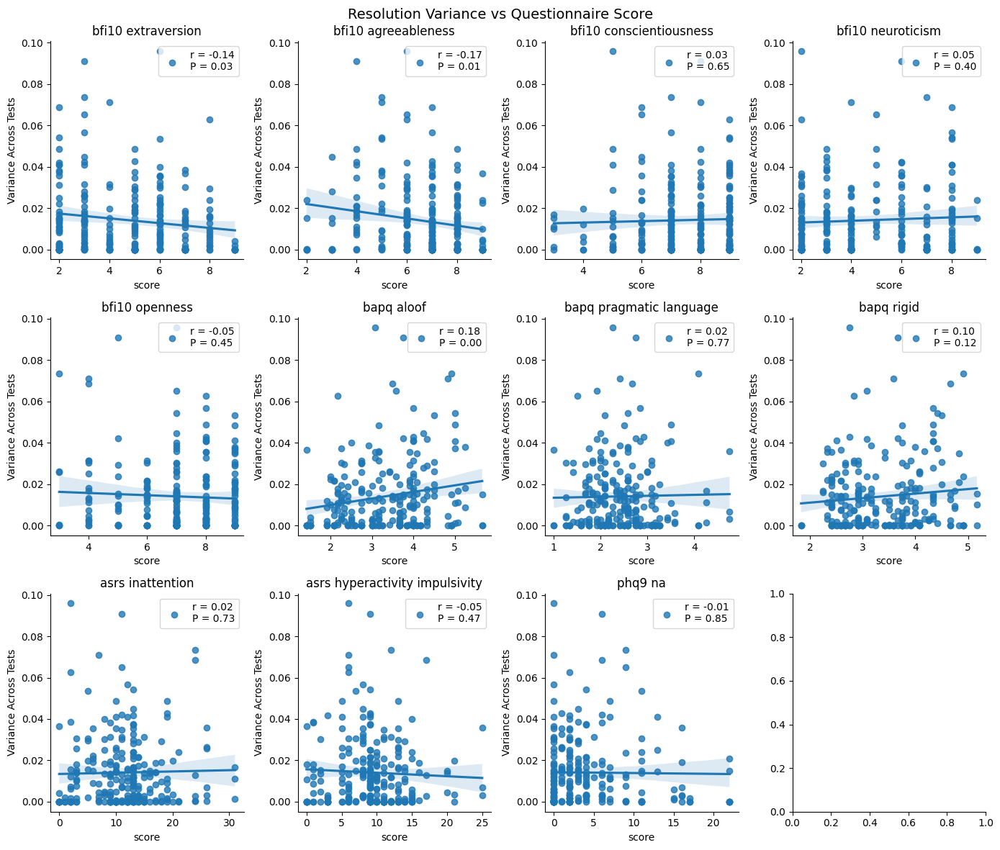

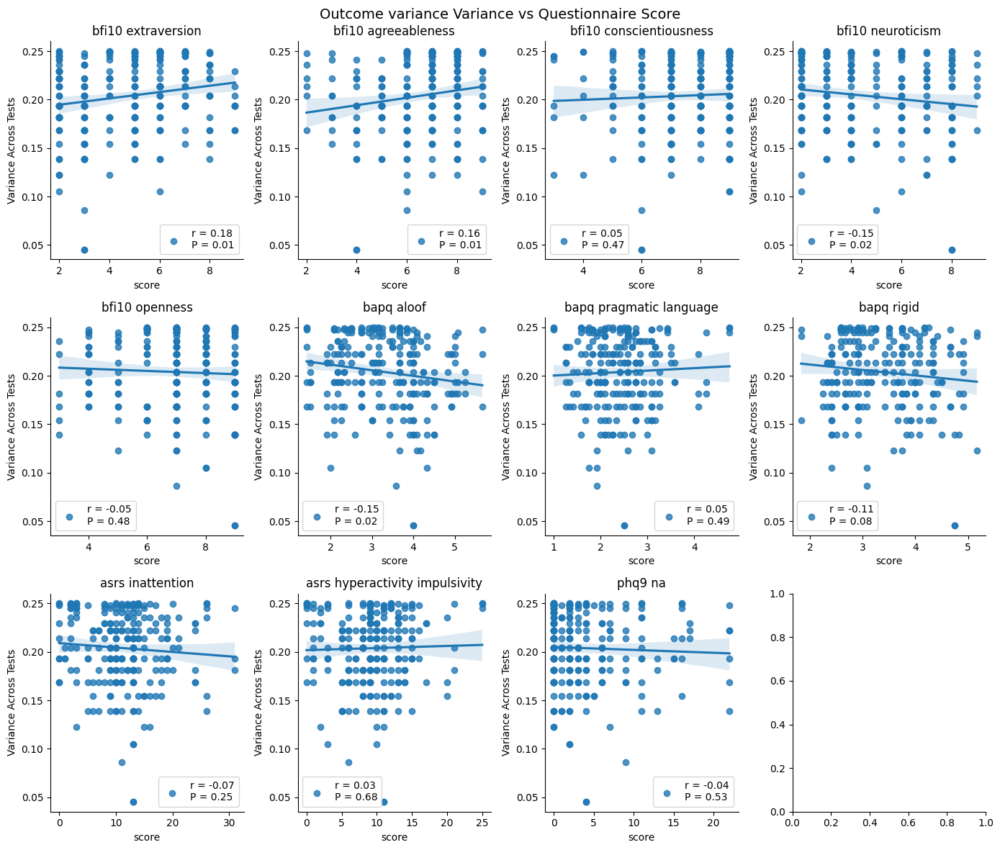

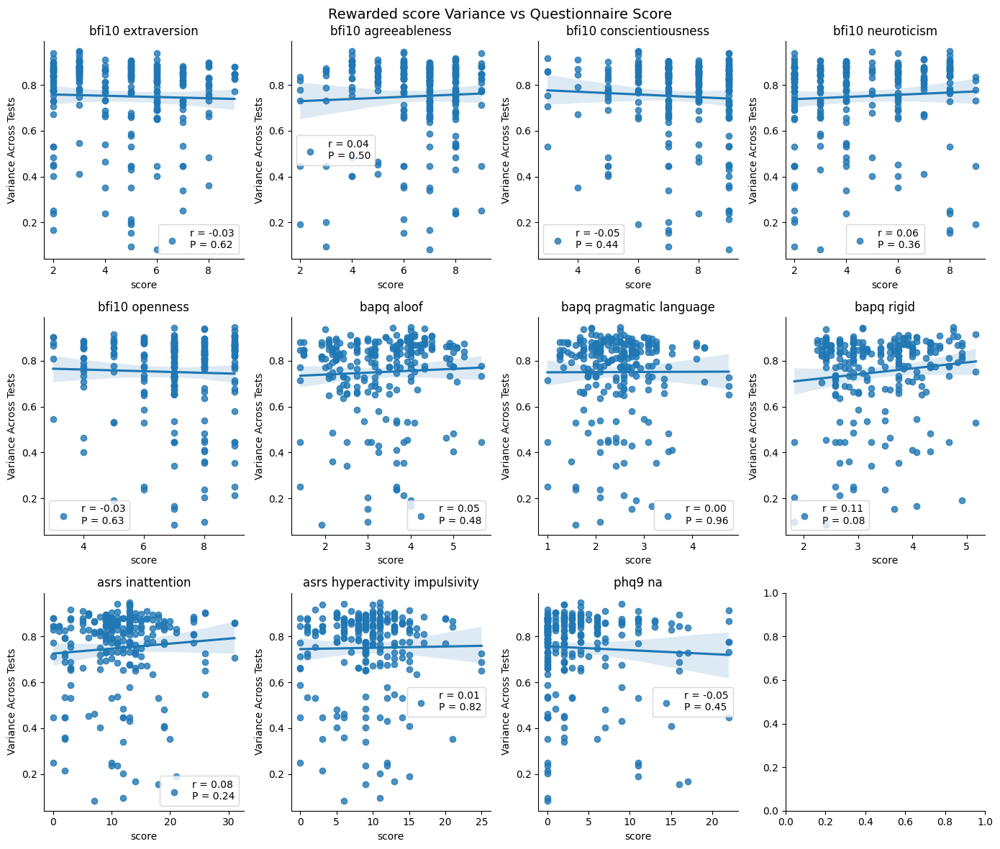

In [64]:
ratings = ['accuracy','brier_score','calibration','resolution','outcome_variance','rewarded_score']

for rating in ratings:
    fig, ax = plt.subplots(3,4,figsize=(14,12))
    ax = ax.flatten()
    for i, subscale in enumerate(joint_subscale_scores_df.subscale.unique()):
        joint_df = joint_subscale_scores_df.loc[joint_subscale_scores_df.subscale==subscale,:]
        corr, pval = pearsonr(joint_df["score"], joint_df[rating])
        ax[i] = sns.regplot(data=joint_df,x='score', y=rating,
            label=f'r = {corr:.2f}\nP = {pval:.2f}',ax=ax[i])
        ax[i].legend()
        ax[i].set_title(subscale.replace('_',' '))
        ax[i].set_ylabel('Variance Across Tests')
    fig.suptitle(f"{rating.replace('_',' ').capitalize()} Variance vs Questionnaire Score",fontsize=14)        
    fig.tight_layout()
    sns.despine()
    plt.show()

# Use regression for statistics

In [286]:
joint_subscale_pivot_df = pd.merge(subscale_scores_df.pivot_table(values='score', index='subject_id', columns='subscale', aggfunc='first').apply(zscore), task_summaries, on='subject_id', how='inner')
joint_subscale_pivot_df = pd.merge(joint_subscale_pivot_df,data_questionnaires.loc[:,['subject_id','gender', 'sex', 'age','education']].drop_duplicates(),on='subject_id',how='inner')
X = joint_subscale_pivot_df.loc[joint_subscale_pivot_df.test==2,:]

subscales = ['asrs_hyperactivity_impulsivity', 'asrs_inattention','bapq_aloof', 'bapq_pragmatic_language', 'bapq_rigid',
       'bfi10_agreeableness', 'bfi10_conscientiousness', 'bfi10_extraversion','bfi10_neuroticism', 'bfi10_openness', 'phq9_na']
performance_metric = 'calibration'

# formula_multiple_regression=f"{performance_metric} ~ {'+'.join(subscales)}"
# est = smf.ols(formula=formula_multiple_regression,data=X).fit() 

# display(est.summary())


vcf = { "sex": "0 + C(sex)"}
X_ = copy.deepcopy(X)
X_['random_effects_group'] = 1
md = sm.MixedLM.from_formula(formula_multiple_regression, groups="random_effects_group",                                                    
                                vc_formula=vcf, re_formula="0", data=X_).fit()
print(md.summary())


                  Mixed Linear Model Regression Results
Model:                  MixedLM      Dependent Variable:      calibration
No. Observations:       75           Method:                  REML       
No. Groups:             1            Scale:                   0.0017     
Min. group size:        75           Log-Likelihood:          88.1189    
Max. group size:        75           Converged:               Yes        
Mean group size:        75.0                                             
-------------------------------------------------------------------------
                               Coef.  Std.Err.   z    P>|z| [0.025 0.975]
-------------------------------------------------------------------------
Intercept                       0.041    0.005  8.462 0.000  0.032  0.051
asrs_hyperactivity_impulsivity -0.008    0.010 -0.806 0.420 -0.026  0.011
asrs_inattention               -0.007    0.010 -0.762 0.446 -0.026  0.012
bapq_aloof                     -0.014    0.012 -1.193 0.

/Users/wwp9/opt/anaconda3/envs/py39metapy/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/wwp9/opt/anaconda3/envs/py39metapy/lib/python3.9/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(
/Users/wwp9/opt/anaconda3/envs/py39metapy/lib/python3.9/site-packages/statsmodels/regression/mixed_linear_model.py:1634: UserWarning: Random effects covariance is singular
  warnings.warn(msg)
/Users/wwp9/opt/anaconda3/envs/py39metapy/lib/python3.9/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)
/Users/wwp9/opt/anaconda3/envs/py39metapy/lib/python3.9/site-packages/statsmodels/regression/mixed_linear_model.py:2261

# Reported strategy and clinical trait scores

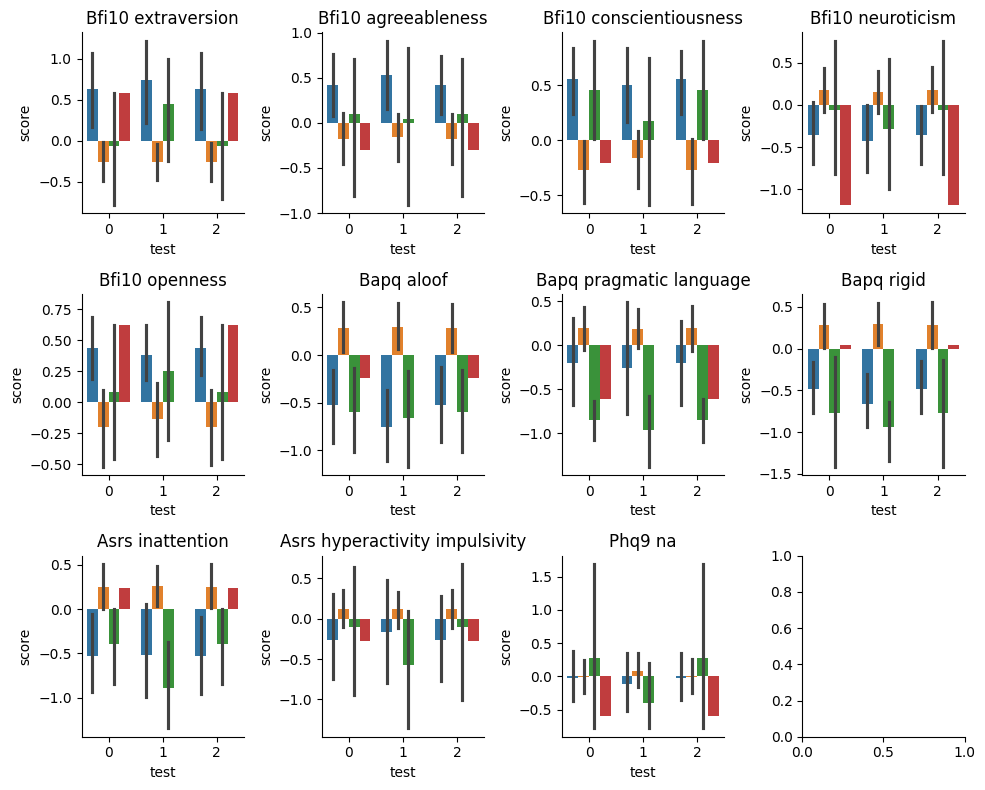

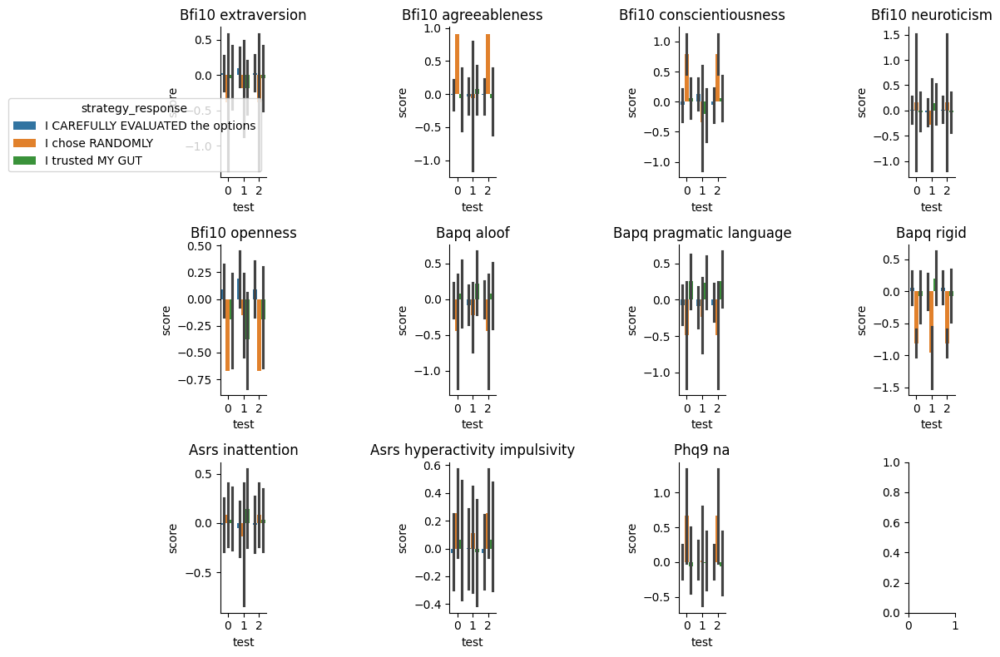

In [99]:
strategy_df = data_test_all.loc[:,['subject_id','strategy_prompt','strategy_response','test']].drop_duplicates()
joint_subscale_strategy_df = pd.merge(strategy_df,joint_subscale_scores_df, on=['subject_id','test'],how='inner')

for subscale in joint_subscale_strategy_df.subscale.unique():
    joint_subscale_strategy_df.loc[joint_subscale_strategy_df.subscale==subscale,'score'] = \
        zscore(joint_subscale_strategy_df[joint_subscale_strategy_df.subscale==subscale].score)

joint_subscale_classification_df = joint_subscale_strategy_df.loc[joint_subscale_strategy_df.strategy_prompt=='strategy_classification',:]

fig, ax = plt.subplots(3,4,figsize=(10,8))
ax = ax.flatten()
for i, subscale in enumerate(joint_subscale_classification_df.subscale.unique()):
    ax[i] = sns.barplot(data=joint_subscale_classification_df.loc[joint_subscale_classification_df.subscale==subscale,:],
                        x='test',y='score',hue='strategy_response',ax=ax[i])
    ax[i].set_title(subscale.replace('_',' ').capitalize())
    ax[i].get_legend().remove()

sns.despine()
fig.tight_layout()
plt.show()

joint_subscale_decision_df = joint_subscale_strategy_df.loc[joint_subscale_strategy_df.strategy_prompt=='decision_process',:]
fig, ax = plt.subplots(3,4,figsize=(10,8))
ax = ax.flatten()
for i, subscale in enumerate(joint_subscale_decision_df.subscale.unique()):
    ax[i] = sns.barplot(data=joint_subscale_decision_df.loc[joint_subscale_decision_df.subscale==subscale,:],
                        x='test',y='score',hue='strategy_response',ax=ax[i])
    ax[i].set_title(subscale.replace('_',' ').capitalize())
    if i != 0:
        ax[i].get_legend().remove()

sns.despine()
fig.tight_layout()
plt.show()

# Examine subjects with reasonably good calibration

/var/folders/hf/yqm2zm8x70z77y51rqgymn200000gn/T/ipykernel_51438/1059818364.py:25: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value 'Initial Test' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  task_summaries_copy.loc[task_summaries_copy.test==0,'test'] = 'Initial Test'


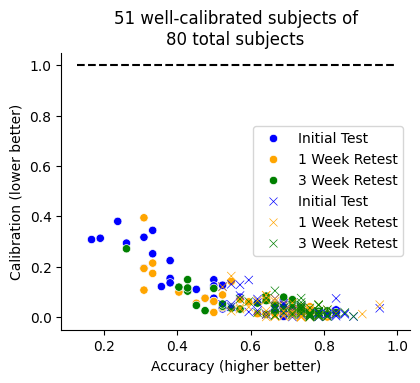

In [7]:
save_bool = False
fig_dir = 'plots/'
accuracy_thresh = 0.5
calibration_thresh = 1#0.1

var_threshold_calibration = 1.00
var_threshold_resolution = 1.000

task_summaries_test_calibration = task_summaries.pivot(index='subject_id',columns='test',values='calibration')
task_summaries_test_resolution = task_summaries.pivot(index='subject_id',columns='test',values='resolution')
subject_id_consistent = np.intersect1d(task_summaries_test_calibration.index[(task_summaries_test_calibration.var(axis=1)\
    <var_threshold_calibration)&(task_summaries_test_calibration.mean(axis=1)<calibration_thresh)],\
    task_summaries_test_resolution.index[(task_summaries_test_resolution.var(axis=1)<var_threshold_resolution)])
well_calibrated_ = task_summaries.loc[task_summaries.subject_id.isin(subject_id_consistent),:].subject_id.unique()

ids, counts = np.unique(task_summaries.subject_id[(task_summaries.accuracy>accuracy_thresh) & \
    (task_summaries.calibration<calibration_thresh)],return_counts=True)
well_calibrated = ids[counts==3]

well_calibrated = np.intersect1d(well_calibrated,well_calibrated_)

palette=['blue','orange','green']

task_summaries_copy = copy.deepcopy(task_summaries)
task_summaries_copy.loc[task_summaries_copy.test==0,'test'] = 'Initial Test'
task_summaries_copy.loc[task_summaries_copy.test==1,'test'] = '1 Week Retest'
task_summaries_copy.loc[task_summaries_copy.test==2,'test'] = '3 Week Retest'

fig, ax = plt.subplots(1,1,figsize=np.array([5,4])*.9)
ax = sns.scatterplot(data=task_summaries_copy.loc[~task_summaries_copy.subject_id.isin(well_calibrated),:],\
    x='accuracy',y='calibration',hue='test',marker='o',palette=palette,ax=ax)
ax = sns.scatterplot(data=task_summaries_copy.loc[task_summaries_copy.subject_id.isin(well_calibrated),:],\
    x='accuracy',y='calibration',hue='test',marker='x',palette=palette,ax=ax)
ax.plot(ax.get_xlim(),[calibration_thresh,calibration_thresh],'k--')
ax.legend()
ax.set_xlabel('Accuracy (higher better)')
ax.set_ylabel('Calibration (lower better)')
ax.set_title(f'{len(well_calibrated)} well-calibrated subjects of\n{len(task_summaries_copy.subject_id.unique())} total subjects')
sns.despine()
if save_bool:
    fig.savefig(os.path.join(fig_dir,'task_analysis_accuracy_calibration_well_calibrated.svg'),dpi=300)
plt.show()

#### Histogram showing the groups

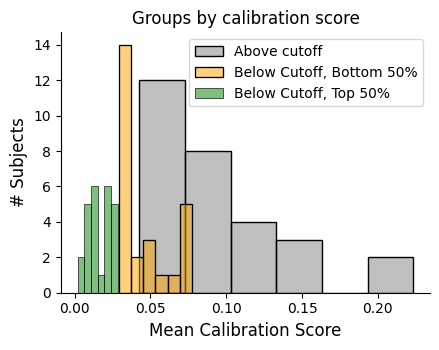

In [13]:
save_bool = True

fontsize = 12
task_summaries_mean = task_summaries.groupby('subject_id').mean()

subject_ids_below_cutoff = task_summaries[~task_summaries.subject_id.isin(well_calibrated)].subject_id.to_list()

task_summaries_cutoff_mean = task_summaries_mean.loc[~task_summaries_mean.index.isin(subject_ids_below_cutoff),:].reset_index().drop(columns=['test']).sort_values('calibration',ascending=True)
subject_ids_top = task_summaries_cutoff_mean.subject_id[:int(task_summaries_cutoff_mean.shape[0]/2)].to_list()
subject_ids_bottom = task_summaries_cutoff_mean.subject_id[int(task_summaries_cutoff_mean.shape[0]/2):].to_list()

fig, ax = plt.subplots(1,1,figsize=np.array([5,4])*.9)

task_summaries_mean['Group'] = ''
task_summaries_mean.loc[task_summaries_mean.index.isin(subject_ids_below_cutoff),'Group'] = 'Above cutoff'
task_summaries_mean.loc[task_summaries_mean.index.isin(subject_ids_top),'Group'] = 'Below Cutoff, Top 50%'
task_summaries_mean.loc[task_summaries_mean.index.isin(subject_ids_bottom),'Group'] = 'Below Cutoff, Bottom 50%'

groups, colors = ['Above cutoff','Below Cutoff, Bottom 50%','Below Cutoff, Top 50%'], ['gray','orange','green']
for group, color in zip(groups,colors):
    ax = sns.histplot(data=task_summaries_mean.loc[task_summaries_mean['Group']==group,:],x='calibration',ax=ax,
                     fill=True,color=color,alpha=0.5,label=group)

## Using seaborn, make a KDE plot for each group on the same axis
ax.legend()
ax.set_xlabel('Mean Calibration Score',fontsize=fontsize)
ax.set_ylabel('# Subjects',fontsize=fontsize)
ax.set_title('Groups by calibration score',fontsize=fontsize)
sns.despine()
plt.tight_layout()
if save_bool:
    fig.savefig(os.path.join(fig_dir,'task_analysis_calibration_groups.svg'),dpi=300)
plt.show()


## Their strategy

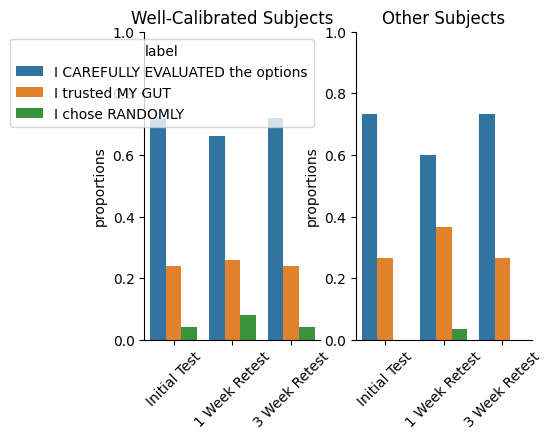

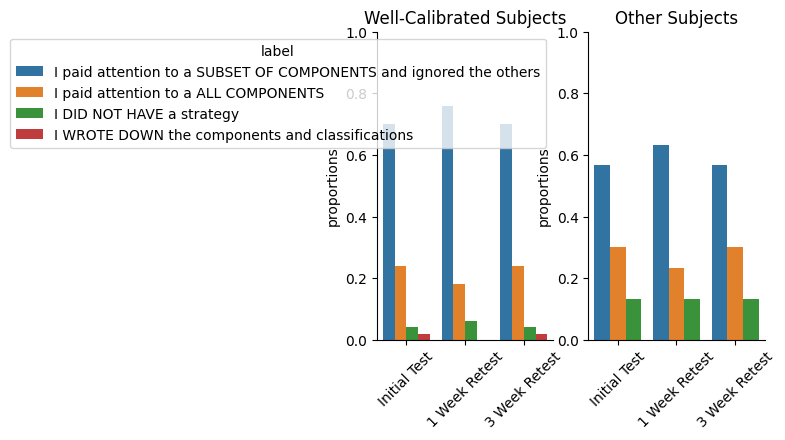

In [109]:
def popStrategyPie(df,indx,ttl='',ax=None):
    if ax is None:
        fig, ax = plt.subplots(1,1)
    val_df = df.loc[indx,['strategy_response']].value_counts()/df.loc[indx,['strategy_response']].shape[0]
    ax.pie(val_df.to_list(),labels=[val[0] for val in val_df.index.tolist()],autopct='%1.1f%%')
    ax.set_title(ttl)
    return ax

def groupStrategyDF(df,indx_hp):
    hp_prop_df = popStrategyDF(df,indx_hp)
    hp_prop_df['Group'] = 'Well-Calibrated'
    other_prop_df = popStrategyDF(df,~indx_hp)
    other_prop_df['Group'] = 'Other'
    prop_df = pd.concat([hp_prop_df,other_prop_df])
    return prop_df
    
def popStrategyDF(df,indx):
    prop_dic = {
        'proportions':[],
        'label':[],
        'test': []
    }
    for test in df.test.unique():
        val_df = df.loc[(indx) & (df.test==test),['strategy_response']].value_counts()/\
            df.loc[indx & (df.test==test),['strategy_response']].shape[0]
        prop_dic['proportions'] += val_df.to_list()
        prop_dic['label'] += [val[0] for val in val_df.index.tolist()]
        prop_dic['test'] += [test]*len(val_df.to_list())
    prop_df = pd.DataFrame(prop_dic)
    return prop_df

def tidyAx(ax):
    # Change x axis labels from (0, 1, 2) to ['Initial Test', '1 Week Retest', '3 Week Retest'] and rotate 45 degrees
    for ax_ in ax:
        ax_.set_xticks([0,1,2])
        ax_.set_xticklabels(['Initial Test', '1 Week Retest', '3 Week Retest'])
        ax_.tick_params(axis='x', rotation=45)
        ax_.set_xlabel('')
        ax_.set_ylim([0,1])
    return ax

strategy_df = data.loc[:,['subject_id','strategy_prompt','strategy_response','test']].drop_duplicates()
bar_df = pd.merge(strategy_df,task_summaries, on=['test','subject_id'],how='left')
bar_df['well_calibrated'] = bar_df.subject_id.isin(high_performing).to_list()

bar_decision_df = bar_df.loc[bar_df.strategy_prompt == 'decision_process']
prop_decision_hp_df = popStrategyDF(bar_decision_df,bar_decision_df.well_calibrated)
prop_decision_hp_df['Group'] = 'Well-Calibrated'
prop_decision_other_df = popStrategyDF(bar_decision_df,~bar_decision_df.well_calibrated)
prop_decision_other_df['Group'] = 'Other'

bar_classification_df = bar_df.loc[bar_df.strategy_prompt == 'strategy_classification']

prop_classification_hp_df = popStrategyDF(bar_classification_df,bar_classification_df.well_calibrated)
prop_classification_hp_df['Group'] = 'Well-Calibrated'
prop_classification_other_df = popStrategyDF(bar_classification_df,~bar_classification_df.well_calibrated)
prop_classification_other_df['Group'] = 'Other'

fig, ax = plt.subplots(1,2,figsize=(5,4))
ax[0] = sns.barplot(data=prop_decision_hp_df,x='test',y='proportions',hue='label',ax=ax[0])
ax[0].set_title('Well-Calibrated Subjects')
ax[1] = sns.barplot(data=prop_decision_other_df,x='test',y='proportions',hue='label',ax=ax[1])
ax[1].get_legend().remove()
ax[1].set_title('Other Subjects')
ax = tidyAx(ax)
sns.despine()
plt.show()

fig, ax = plt.subplots(1,2,figsize=(5,4))
ax[0] = sns.barplot(data=prop_classification_hp_df,x='test',y='proportions',hue='label',ax=ax[0])
ax[0].set_title('Well-Calibrated Subjects')
ax[1] = sns.barplot(data=prop_classification_other_df,x='test',y='proportions',hue='label',ax=ax[1])
ax[1].get_legend().remove()
ax[1].set_title('Other Subjects')
ax = tidyAx(ax)
sns.despine()
plt.show()

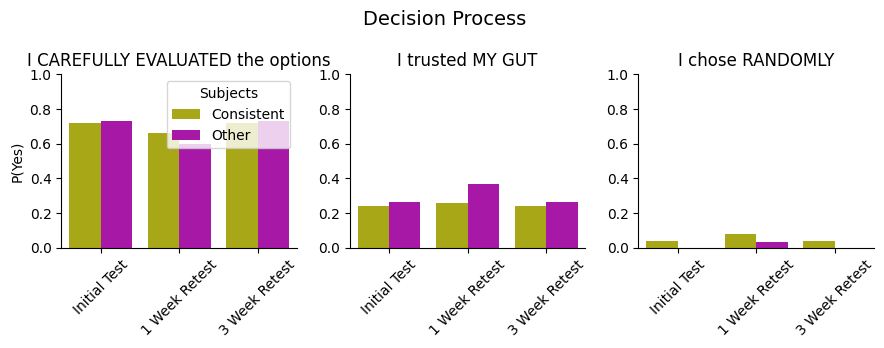

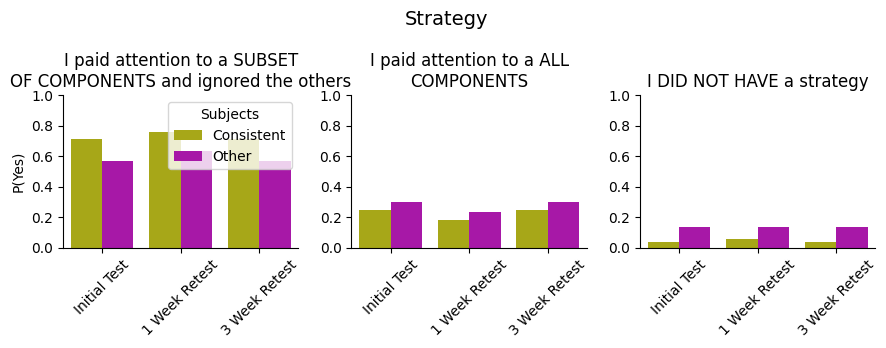

In [110]:
save_bool = False
fig_dir = 'plots/'

def groupStrategyDF(df,indx_hp):
    hp_prop_df = popStrategyDF(df,indx_hp)
    hp_prop_df['Subjects'] = 'Consistent'
    other_prop_df = popStrategyDF(df,~indx_hp)
    other_prop_df['Subjects'] = 'Other'
    prop_df = pd.concat([hp_prop_df,other_prop_df])
    return prop_df
    
def popStrategyDF(df,indx):
    prop_dic = {
        'proportions':[],
        'label':[],
        'test': []
    }
    for test in df.test.unique():
        val_df = df.loc[(indx) & (df.test==test),['strategy_response']].value_counts()/\
            df.loc[indx & (df.test==test),['strategy_response']].shape[0]
        prop_dic['proportions'] += val_df.to_list()
        prop_dic['label'] += [val[0] for val in val_df.index.tolist()]
        prop_dic['test'] += [test]*len(val_df.to_list())
    prop_df = pd.DataFrame(prop_dic)
    return prop_df


def plotGroupStrategy(prop_df,ttl='Decision Strategy'):
    n_q = prop_df.label.nunique()
    fig, ax = plt.subplots(1,n_q,figsize=(3*n_q,3.5))
    for i, question in enumerate(prop_df.label.unique()):
        ax[i] = sns.barplot(data=prop_df.loc[prop_df.label==question,:],palette=['y','m'],
                            x='test',y='proportions',hue='Subjects',ax=ax[i])
        words = question.split(' ')
        if len(words) > 6:
            ttl_sub = ' '.join(words[:6]) + '\n' + ' '.join(words[6:])
        else:
            ttl_sub = ' '.join(words)
        ax[i].set_title(ttl_sub)
        ax[i].set_ylabel('P(Yes)')
        if i != 0:
            ax[i].get_legend().remove()
            ax[i].set_ylabel('')
    fig.suptitle(ttl,fontsize=14)
    ax = tidyAx(ax)
    sns.despine()
    fig.tight_layout()
    return fig, ax

bar_df = pd.merge(strategy_df,task_summaries, on=['test','subject_id'],how='left')

bar_df['well_calibrated'] = bar_df.subject_id.isin(well_calibrated)

bar_decision_df = bar_df.loc[bar_df.strategy_prompt == 'decision_process']
prop_df = groupStrategyDF(bar_decision_df,bar_decision_df.well_calibrated)
fig, ax = plotGroupStrategy(prop_df,ttl='Decision Process')
if save_bool:
    fig.savefig(os.path.join(fig_dir,'groups_decision_process.svg'),dpi=300)
plt.show()

bar_classification_df = bar_df.loc[bar_df.strategy_prompt == 'strategy_classification']
bar_classification_df = bar_classification_df.loc[bar_classification_df.strategy_response != 'I WROTE DOWN the components and classifications' ,:]
prop_df = groupStrategyDF(bar_classification_df,bar_classification_df.well_calibrated)
fig, ax = plotGroupStrategy(prop_df,ttl='Strategy')
if save_bool:
    fig.savefig(os.path.join(fig_dir,'groups_strategy.svg'),dpi=300)
plt.show()

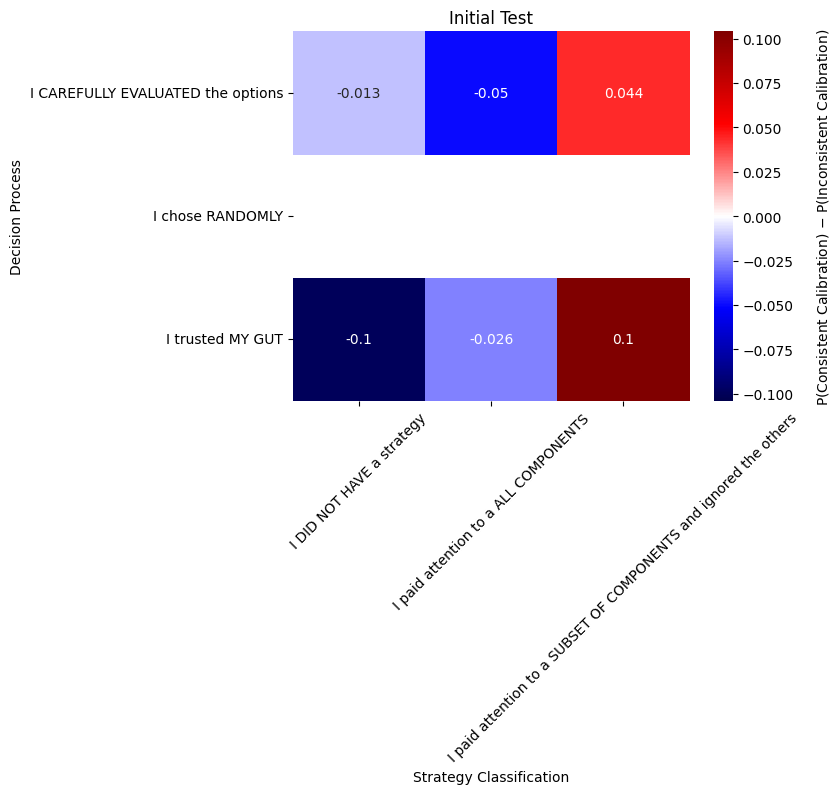

In [112]:
def createCrossTab(bar_df,test=0):
    strategy_df_tmp = bar_df.loc[:,['subject_id','strategy_prompt','strategy_response','test']].drop_duplicates()
    strategy_df_tmp = strategy_df_tmp.loc[strategy_df_tmp.test==test,:]
    strategy_df_tmp = strategy_df_tmp.pivot(index='subject_id',columns='strategy_prompt',values='strategy_response').loc[:,['decision_process','strategy_classification']]
    # Create a cross-tabulation
    cross_tab = pd.crosstab(index=strategy_df_tmp['decision_process'], columns=strategy_df_tmp['strategy_classification'])
    return cross_tab

def plotCrosstabHeatmap(cross_tab_test_diff,ttl='Initial Test',vmin=None,vmax=None):
    if vmin is None:
        vmin = -cross_tab_test_diff.abs().max().max()
    if vmax is None:
        vmax = cross_tab_test_diff.abs().max().max()
    ax = sns.heatmap(cross_tab_test_diff, annot=True, cmap='seismic',vmin=vmin,vmax=vmax)
    ax.figure.axes[-1].set_ylabel('P(Consistent Calibration) $-$ P(Inconsistent Calibration)', labelpad=15)
    ax.tick_params(axis='x', rotation=45)
    ax.set_xlabel('Strategy Classification')
    ax.set_ylabel('Decision Process')
    ax.set_title(ttl)
    return ax
    
def calcCrosstabDiff(bar_df,test=0,fix=False):
    cross_tab_consistent = createCrossTab(bar_df.loc[bar_df.well_calibrated,:],test=test)
    cross_tab_consistent = cross_tab_consistent / cross_tab_consistent.sum().sum()
    cross_tab_inconsistent = createCrossTab(bar_df.loc[~bar_df.well_calibrated,:],test=test)
    cross_tab_inconsistent = cross_tab_inconsistent / cross_tab_inconsistent.sum().sum()
    cross_tab_diff = cross_tab_consistent - cross_tab_inconsistent
    if fix:
        cross_tab_diff.loc[cross_tab_diff.index == 'I chose RANDOMLY',:] = cross_tab_consistent.loc[cross_tab_consistent.index == 'I chose RANDOMLY',:]
    return cross_tab_diff

bar_df_ = bar_df.loc[bar_df.strategy_response != 'I WROTE DOWN the components and classifications' ,:]
cross_tab_test_diff = calcCrosstabDiff(bar_df_,test=0)

vmax =cross_tab_test_diff.abs().max().max()
vmin = -vmax
plotCrosstabHeatmap(cross_tab_test_diff,ttl='Initial Test',vmin=vmin,vmax=vmax)
plt.show()

## Their Traits

In [113]:
# joint_overall_scores_df = pd.merge(overall_scores_df, task_summaries, on='subject_id', how='inner')
# joint_subscale_scores_df = pd.merge(subscale_scores_df, task_summaries, on='subject_id', how='inner')

group_overall_scores_df = overall_scores_df.copy()
group_subscale_scores_df = subscale_scores_df.copy()
group_overall_scores_df = group_overall_scores_df.loc[group_overall_scores_df.subject_id.isin(task_summaries.subject_id),:]
group_subscale_scores_df = group_subscale_scores_df.loc[group_subscale_scores_df.subject_id.isin(task_summaries.subject_id),:]


for subscale in group_subscale_scores_df.subscale.unique():
    group_subscale_scores_df.loc[group_subscale_scores_df.subscale==subscale,'score'] = \
        zscore(group_subscale_scores_df[group_subscale_scores_df.subscale==subscale].score)

for questionnaire_name in group_overall_scores_df.questionnaire_name.unique():
    group_overall_scores_df.loc[group_overall_scores_df.questionnaire_name==questionnaire_name,'score'] = \
        zscore(group_overall_scores_df[group_overall_scores_df.questionnaire_name==questionnaire_name].score)   
        
group_overall_scores_df['high_performing'] = group_overall_scores_df.subject_id.isin(high_performing)
group_subscale_scores_df['high_performing'] = group_subscale_scores_df.subject_id.isin(high_performing)

replace_dict = {}
for i, subscale in enumerate(group_subscale_scores_df.subscale.unique()):
    if subscale == 'phq9_na':
        new_name = 'PHQ9'
    else:
        new_name = group_subscale_scores_df.subscale.unique()[i].split('_')[0].upper() + '\n' + '\n'.join(group_subscale_scores_df.subscale.unique()[i].split('_')[1:]).title()
    replace_dict[subscale] = new_name
# replace_dict['high_performing'] = 'High Performing Subjects'

group_subscale_scores_df.replace(replace_dict,inplace=True)
# group_subscale_scores_df.rename(columns={'high_performing':'High Performing Subjects'},inplace=True)
group_subscale_scores_df['High Performing Subjects'] = group_subscale_scores_df.high_performing

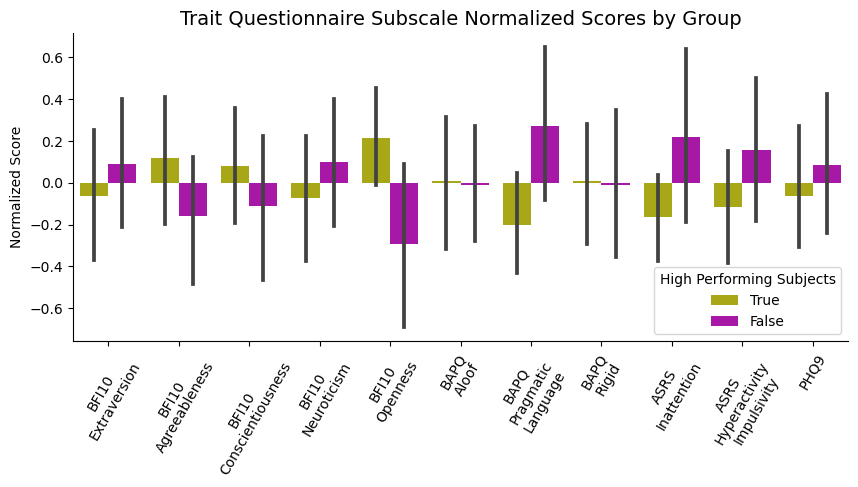

BFI10 Extraversion: t = -0.67, p = 0.50

BFI10 Agreeableness: t = 1.24, p = 0.22

BFI10 Conscientiousness: t = 0.84, p = 0.40

BFI10 Neuroticism: t = -0.74, p = 0.46

BFI10 Openness: t = 2.28, p = 0.03

BAPQ Aloof: t = 0.07, p = 0.95

BAPQ Pragmatic Language: t = -2.13, p = 0.04

BAPQ Rigid: t = 0.09, p = 0.93

ASRS Inattention: t = -1.70, p = 0.09

ASRS Hyperactivity Impulsivity: t = -1.20, p = 0.23

PHQ9: t = -0.64, p = 0.52



In [336]:
save_bool = True
fig_dir = '/Users/wwp9/Dropbox/_Murray/Project/judgement_calibration/2023_final_report/Figures'
# sns.barplot(data=group_overall_scores_df,x='questionnaire_name',y='score',hue='high_performing')
# plt.show()
fig, ax = plt.subplots(1,1,figsize=(10,4))
ax = sns.barplot(data=group_subscale_scores_df,x='subscale',y='score',palette=['y','m'],
                 hue='High Performing Subjects',ax=ax,hue_order=[True,False])
ax.set_ylabel('Normalized Score')
ax.tick_params(axis='x', rotation=60)
ax.set_title('Trait Questionnaire Subscale Normalized Scores by Group',fontsize=14)
ax.set_xlabel('')
sns.despine()
plt.show()

for subscale in group_subscale_scores_df.subscale.unique():
    vals1 = group_subscale_scores_df.loc[(group_subscale_scores_df.high_performing) & (group_subscale_scores_df.subscale==subscale),'score']
    vals2 = group_subscale_scores_df.loc[(~group_subscale_scores_df.high_performing) & (group_subscale_scores_df.subscale==subscale),'score']
    t_val, p_val = ttest_ind(vals1,vals2)
    sub = subscale.replace('\n',' ')
    print(f"{sub}: t = {t_val:.2f}, p = {p_val:.2f}\n")
    
if save_bool:
    fig.savefig(os.path.join(fig_dir,'group_subscale_scores.svg'),dpi=300)
    

## Their correlation with questionniares and metrics
### For each test separately

bfi10_extraversion 0 accuracy, N=50
bfi10_extraversion 1 accuracy, N=50
bfi10_extraversion 2 accuracy, N=50
bfi10_agreeableness 0 accuracy, N=50
bfi10_agreeableness 1 accuracy, N=50
bfi10_agreeableness 2 accuracy, N=50
bfi10_conscientiousness 0 accuracy, N=50
bfi10_conscientiousness 1 accuracy, N=50
bfi10_conscientiousness 2 accuracy, N=50
bfi10_neuroticism 0 accuracy, N=50
bfi10_neuroticism 1 accuracy, N=50
bfi10_neuroticism 2 accuracy, N=50
bfi10_openness 0 accuracy, N=50
bfi10_openness 1 accuracy, N=50
bfi10_openness 2 accuracy, N=50
bapq_aloof 0 accuracy, N=50
bapq_aloof 1 accuracy, N=50
bapq_aloof 2 accuracy, N=50
bapq_pragmatic_language 0 accuracy, N=50
bapq_pragmatic_language 1 accuracy, N=50
bapq_pragmatic_language 2 accuracy, N=50
bapq_rigid 0 accuracy, N=50
bapq_rigid 1 accuracy, N=50
bapq_rigid 2 accuracy, N=50
asrs_inattention 0 accuracy, N=50
asrs_inattention 1 accuracy, N=50
asrs_inattention 2 accuracy, N=50
asrs_hyperactivity_impulsivity 0 accuracy, N=50
asrs_hyperactivi

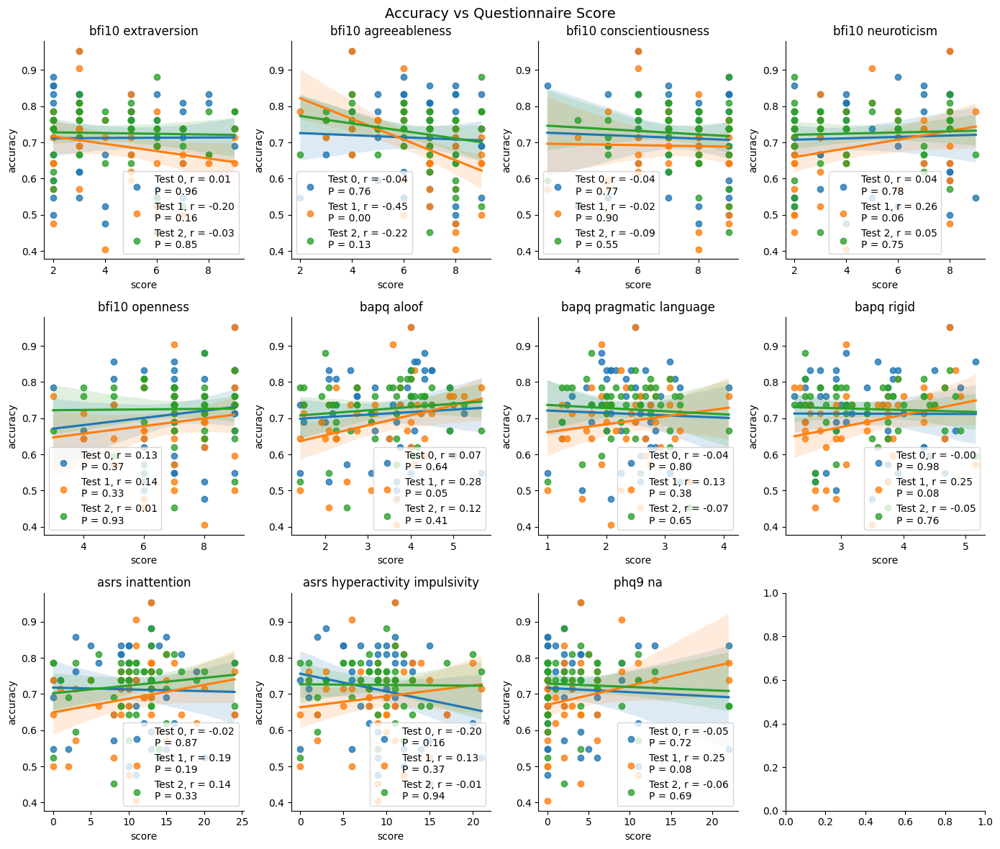

bfi10_extraversion 0 brier_score, N=50
bfi10_extraversion 1 brier_score, N=50
bfi10_extraversion 2 brier_score, N=50
bfi10_agreeableness 0 brier_score, N=50
bfi10_agreeableness 1 brier_score, N=50
bfi10_agreeableness 2 brier_score, N=50
bfi10_conscientiousness 0 brier_score, N=50
bfi10_conscientiousness 1 brier_score, N=50
bfi10_conscientiousness 2 brier_score, N=50
bfi10_neuroticism 0 brier_score, N=50
bfi10_neuroticism 1 brier_score, N=50
bfi10_neuroticism 2 brier_score, N=50
bfi10_openness 0 brier_score, N=50
bfi10_openness 1 brier_score, N=50
bfi10_openness 2 brier_score, N=50
bapq_aloof 0 brier_score, N=50
bapq_aloof 1 brier_score, N=50
bapq_aloof 2 brier_score, N=50
bapq_pragmatic_language 0 brier_score, N=50
bapq_pragmatic_language 1 brier_score, N=50
bapq_pragmatic_language 2 brier_score, N=50
bapq_rigid 0 brier_score, N=50
bapq_rigid 1 brier_score, N=50
bapq_rigid 2 brier_score, N=50
asrs_inattention 0 brier_score, N=50
asrs_inattention 1 brier_score, N=50
asrs_inattention 2 b

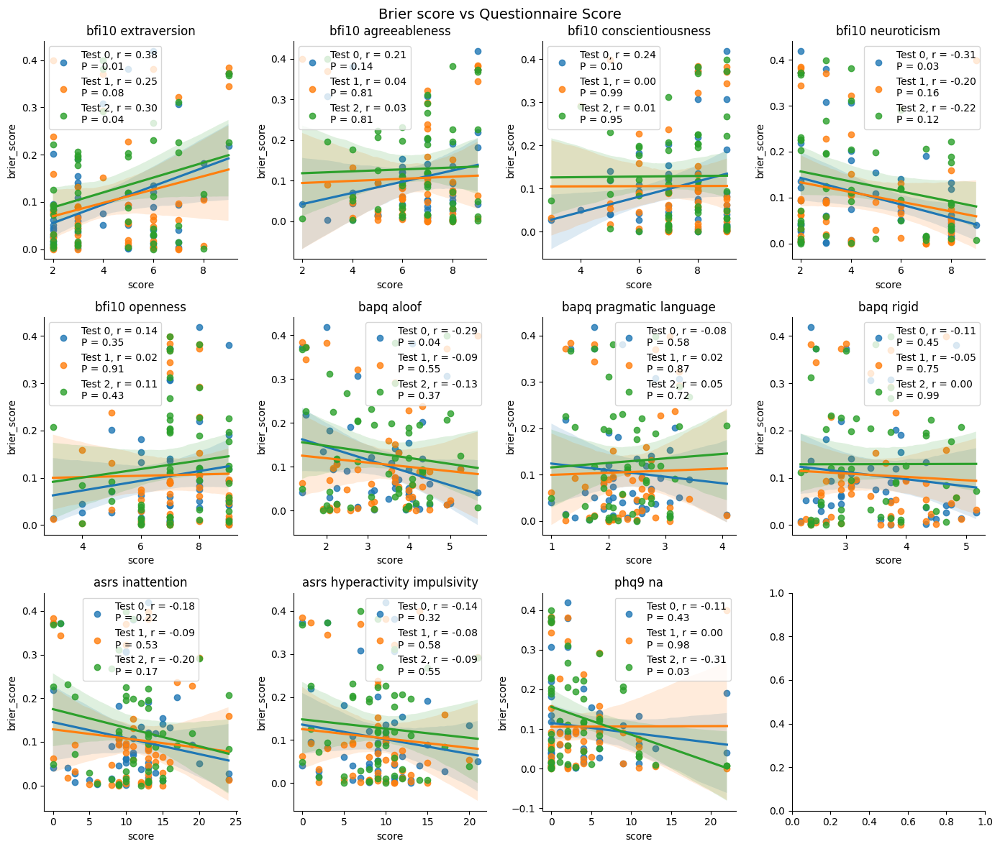

bfi10_extraversion 0 calibration, N=50
bfi10_extraversion 1 calibration, N=50
bfi10_extraversion 2 calibration, N=50
bfi10_agreeableness 0 calibration, N=50
bfi10_agreeableness 1 calibration, N=50
bfi10_agreeableness 2 calibration, N=50
bfi10_conscientiousness 0 calibration, N=50
bfi10_conscientiousness 1 calibration, N=50
bfi10_conscientiousness 2 calibration, N=50
bfi10_neuroticism 0 calibration, N=50
bfi10_neuroticism 1 calibration, N=50
bfi10_neuroticism 2 calibration, N=50
bfi10_openness 0 calibration, N=50
bfi10_openness 1 calibration, N=50
bfi10_openness 2 calibration, N=50
bapq_aloof 0 calibration, N=50
bapq_aloof 1 calibration, N=50
bapq_aloof 2 calibration, N=50
bapq_pragmatic_language 0 calibration, N=50
bapq_pragmatic_language 1 calibration, N=50
bapq_pragmatic_language 2 calibration, N=50
bapq_rigid 0 calibration, N=50
bapq_rigid 1 calibration, N=50
bapq_rigid 2 calibration, N=50
asrs_inattention 0 calibration, N=50
asrs_inattention 1 calibration, N=50
asrs_inattention 2 c

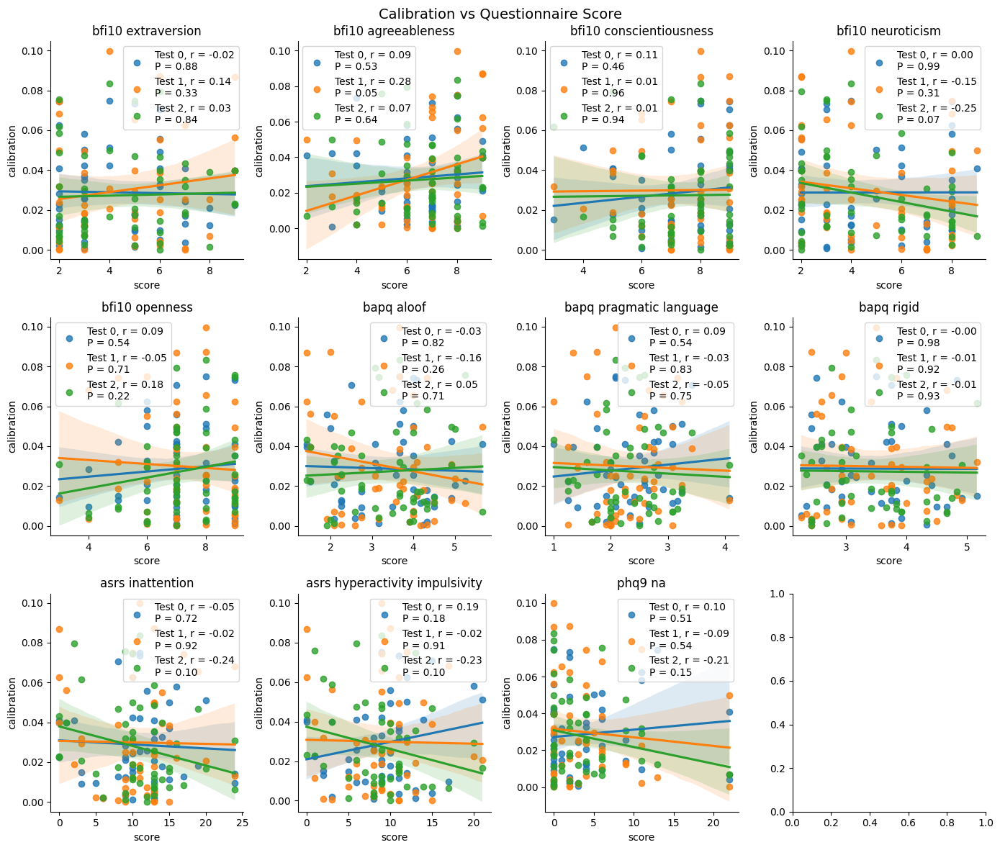

bfi10_extraversion 0 resolution, N=50
bfi10_extraversion 1 resolution, N=50
bfi10_extraversion 2 resolution, N=50
bfi10_agreeableness 0 resolution, N=50
bfi10_agreeableness 1 resolution, N=50
bfi10_agreeableness 2 resolution, N=50
bfi10_conscientiousness 0 resolution, N=50
bfi10_conscientiousness 1 resolution, N=50
bfi10_conscientiousness 2 resolution, N=50
bfi10_neuroticism 0 resolution, N=50
bfi10_neuroticism 1 resolution, N=50
bfi10_neuroticism 2 resolution, N=50
bfi10_openness 0 resolution, N=50
bfi10_openness 1 resolution, N=50
bfi10_openness 2 resolution, N=50
bapq_aloof 0 resolution, N=50
bapq_aloof 1 resolution, N=50
bapq_aloof 2 resolution, N=50
bapq_pragmatic_language 0 resolution, N=50
bapq_pragmatic_language 1 resolution, N=50
bapq_pragmatic_language 2 resolution, N=50
bapq_rigid 0 resolution, N=50
bapq_rigid 1 resolution, N=50
bapq_rigid 2 resolution, N=50
asrs_inattention 0 resolution, N=50
asrs_inattention 1 resolution, N=50
asrs_inattention 2 resolution, N=50
asrs_hyper

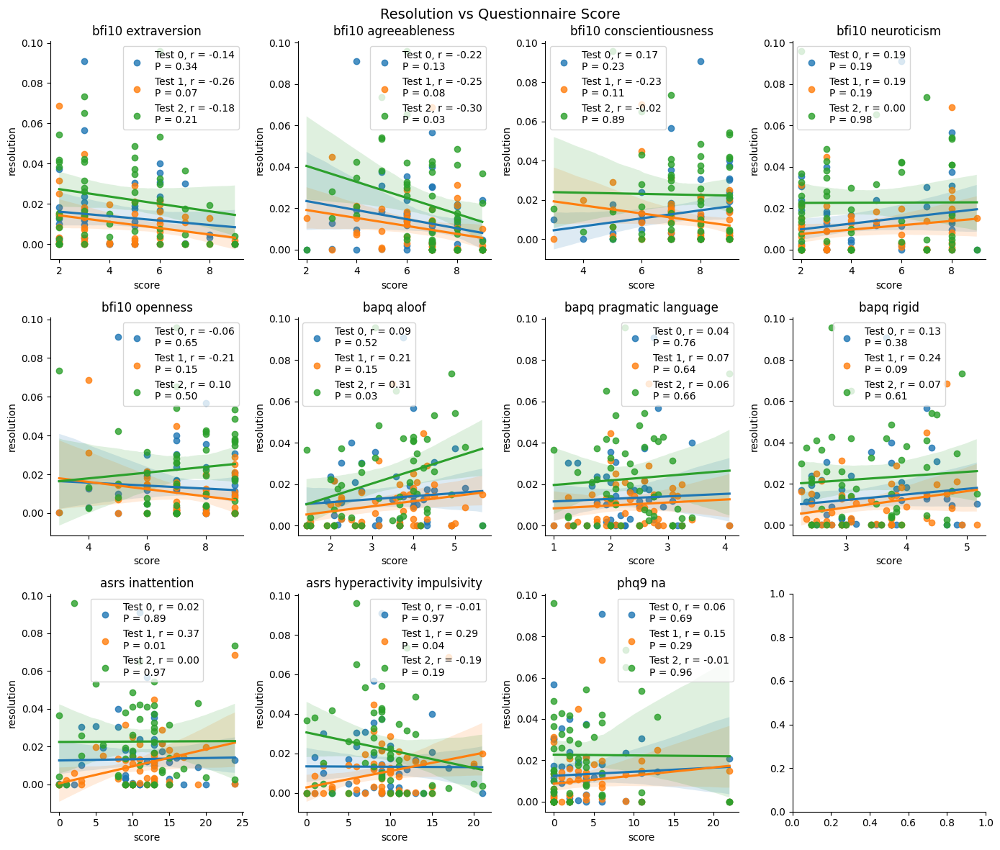

bfi10_extraversion 0 outcome_variance, N=50
bfi10_extraversion 1 outcome_variance, N=50
bfi10_extraversion 2 outcome_variance, N=50
bfi10_agreeableness 0 outcome_variance, N=50
bfi10_agreeableness 1 outcome_variance, N=50
bfi10_agreeableness 2 outcome_variance, N=50
bfi10_conscientiousness 0 outcome_variance, N=50
bfi10_conscientiousness 1 outcome_variance, N=50
bfi10_conscientiousness 2 outcome_variance, N=50
bfi10_neuroticism 0 outcome_variance, N=50
bfi10_neuroticism 1 outcome_variance, N=50
bfi10_neuroticism 2 outcome_variance, N=50
bfi10_openness 0 outcome_variance, N=50
bfi10_openness 1 outcome_variance, N=50
bfi10_openness 2 outcome_variance, N=50
bapq_aloof 0 outcome_variance, N=50
bapq_aloof 1 outcome_variance, N=50
bapq_aloof 2 outcome_variance, N=50
bapq_pragmatic_language 0 outcome_variance, N=50
bapq_pragmatic_language 1 outcome_variance, N=50
bapq_pragmatic_language 2 outcome_variance, N=50
bapq_rigid 0 outcome_variance, N=50
bapq_rigid 1 outcome_variance, N=50
bapq_rigid

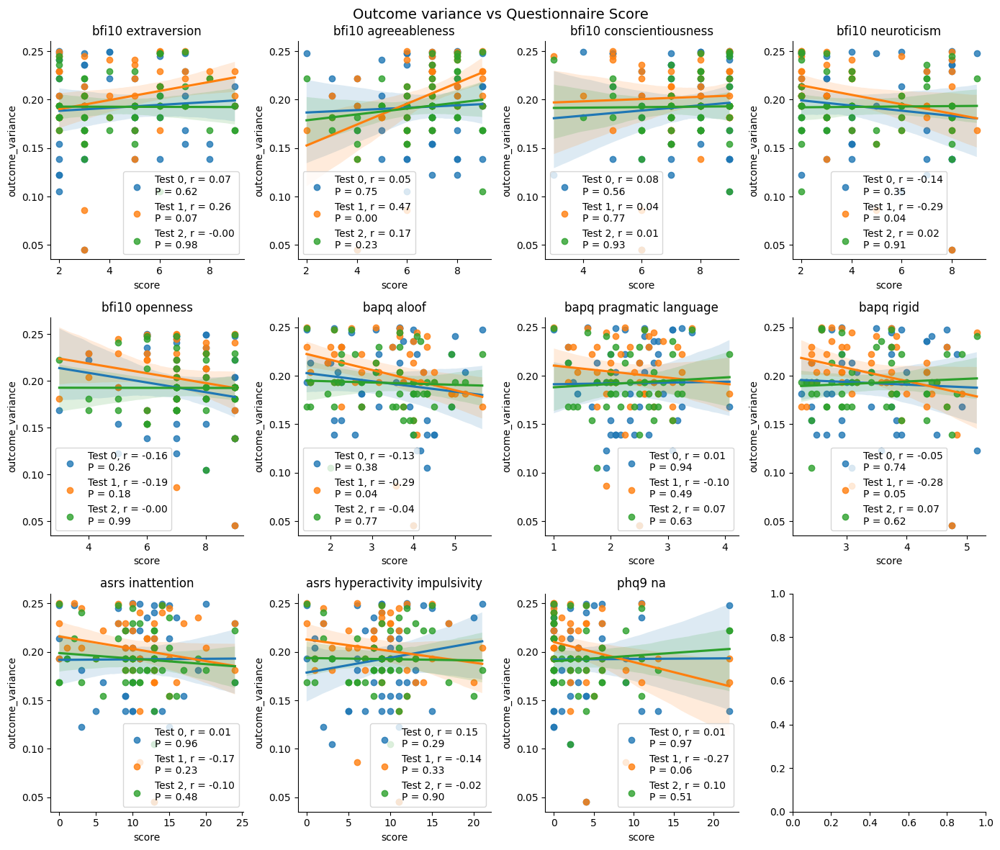

bfi10_extraversion 0 rewarded_score, N=50
bfi10_extraversion 1 rewarded_score, N=50
bfi10_extraversion 2 rewarded_score, N=50
bfi10_agreeableness 0 rewarded_score, N=50
bfi10_agreeableness 1 rewarded_score, N=50
bfi10_agreeableness 2 rewarded_score, N=50
bfi10_conscientiousness 0 rewarded_score, N=50
bfi10_conscientiousness 1 rewarded_score, N=50
bfi10_conscientiousness 2 rewarded_score, N=50
bfi10_neuroticism 0 rewarded_score, N=50
bfi10_neuroticism 1 rewarded_score, N=50
bfi10_neuroticism 2 rewarded_score, N=50
bfi10_openness 0 rewarded_score, N=50
bfi10_openness 1 rewarded_score, N=50
bfi10_openness 2 rewarded_score, N=50
bapq_aloof 0 rewarded_score, N=50
bapq_aloof 1 rewarded_score, N=50
bapq_aloof 2 rewarded_score, N=50
bapq_pragmatic_language 0 rewarded_score, N=50
bapq_pragmatic_language 1 rewarded_score, N=50
bapq_pragmatic_language 2 rewarded_score, N=50
bapq_rigid 0 rewarded_score, N=50
bapq_rigid 1 rewarded_score, N=50
bapq_rigid 2 rewarded_score, N=50
asrs_inattention 0 rew

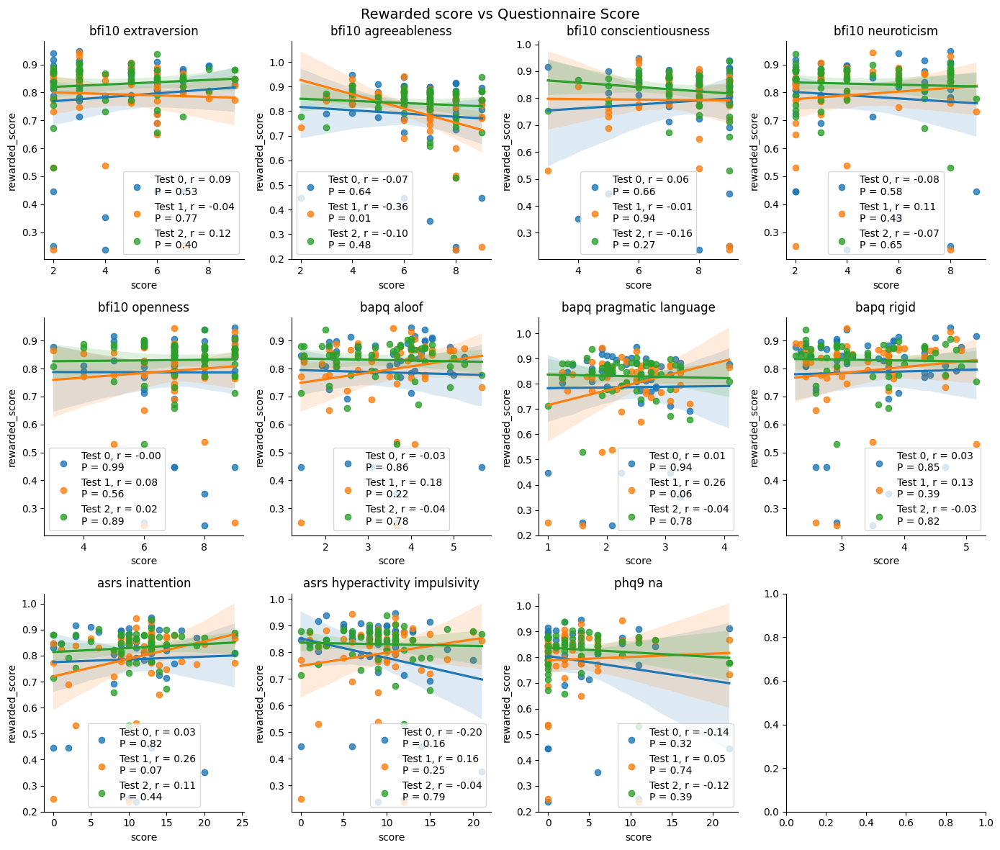

In [114]:
ratings = ['accuracy','brier_score','calibration','resolution','outcome_variance','rewarded_score']

well_calibrated_subscale_scores_df = joint_subscale_scores_df.loc[joint_subscale_scores_df.subject_id.isin(well_calibrated),:].drop_duplicates()

for rating in ratings:
    fig, ax = plt.subplots(3,4,figsize=(14,12))
    ax = ax.flatten()
    for i, subscale in enumerate(well_calibrated_subscale_scores_df.subscale.unique()):
        joint_df = highperf_subscale_scores_df.loc[well_calibrated_subscale_scores_df.subscale==subscale,:]
        for test in joint_df.test.unique():
            joint_test_df = joint_df.loc[joint_df.test==test,:]
            print(f'{subscale} {test} {rating}, N={joint_test_df.shape[0]}')
            corr, pval = pearsonr(joint_test_df["score"], joint_test_df[rating])
            ax[i] = sns.regplot(data=joint_test_df,x='score', y=rating,
                label=f'Test {test}, r = {corr:.2f}\nP = {pval:.2f}',ax=ax[i])
        ax[i].legend()
        ax[i].set_title(subscale.replace('_',' '))
    fig.suptitle(f"{rating.replace('_',' ').capitalize()} vs Questionnaire Score",fontsize=14)        
    fig.tight_layout()
    sns.despine()
    plt.show()

### Scores averaged across tests

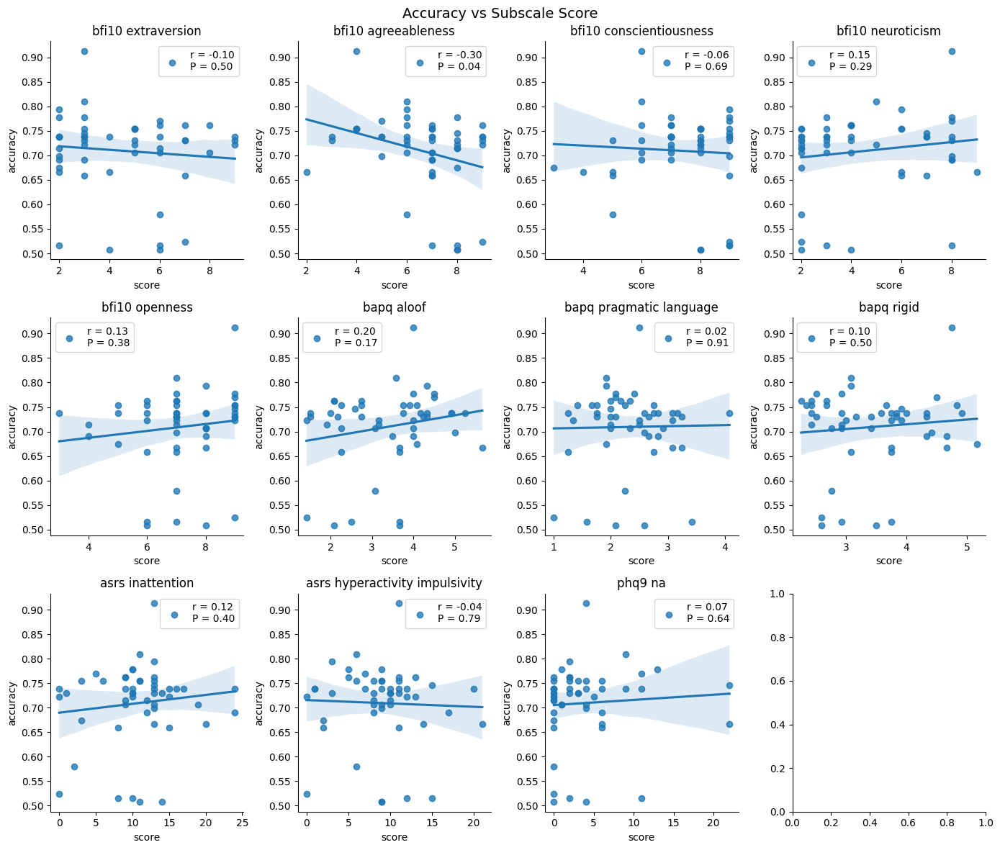

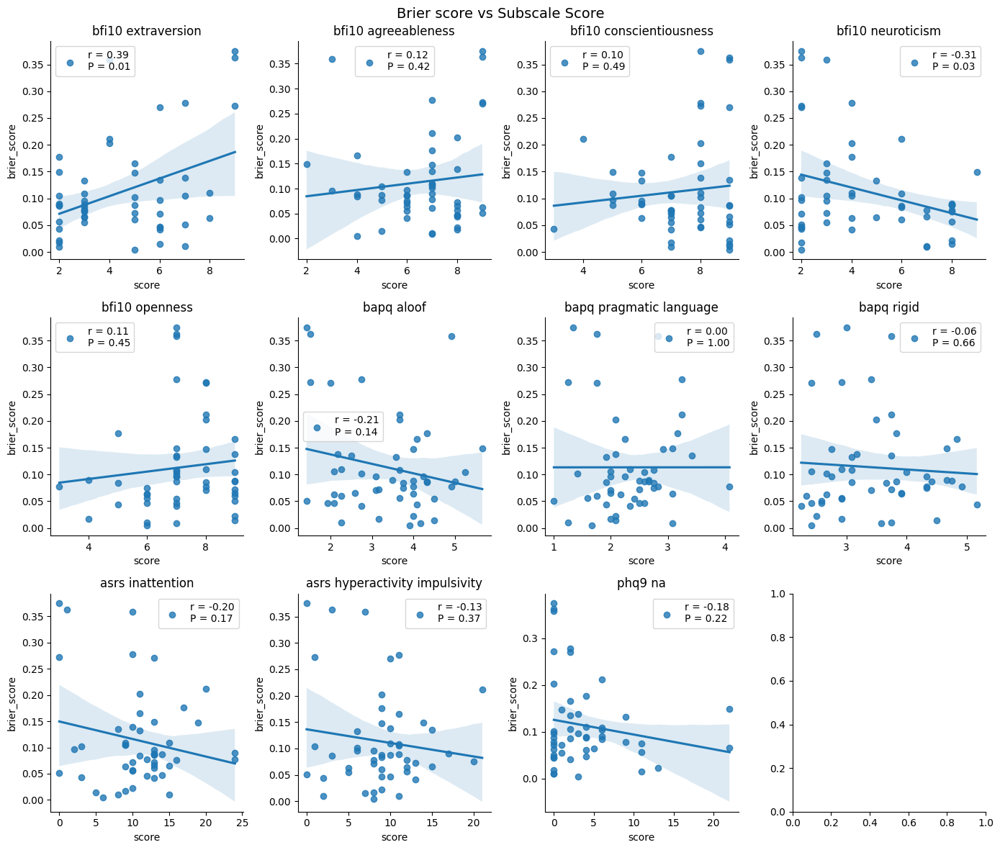

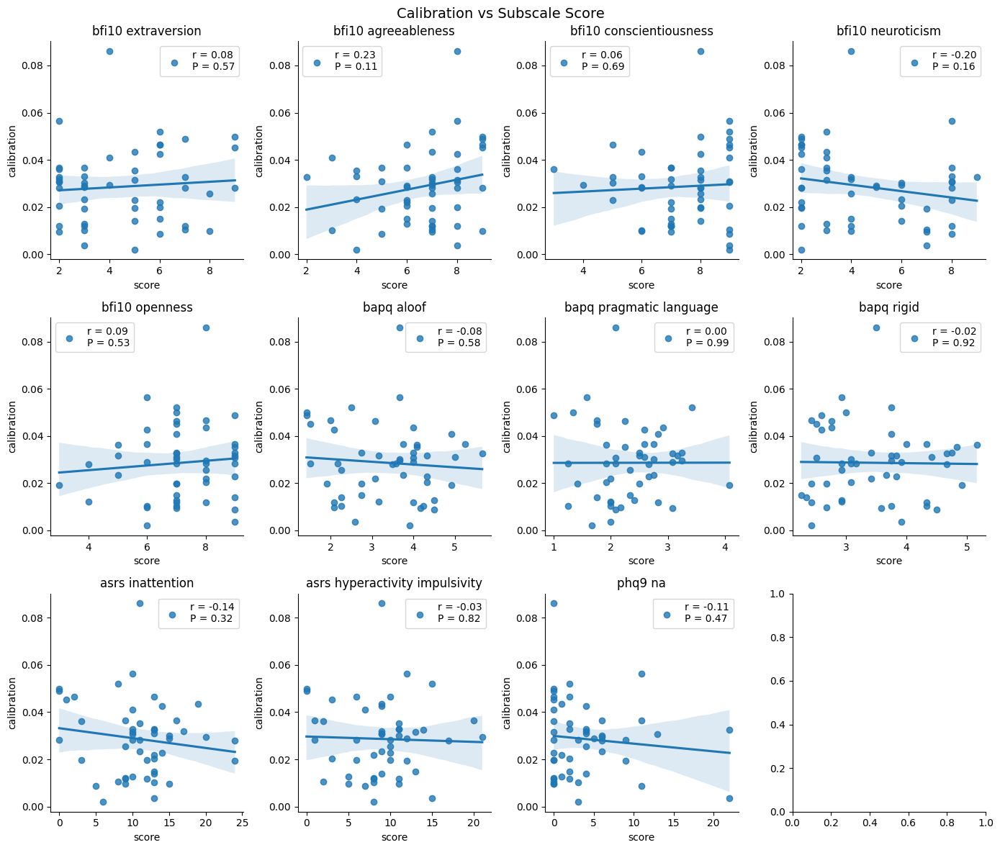

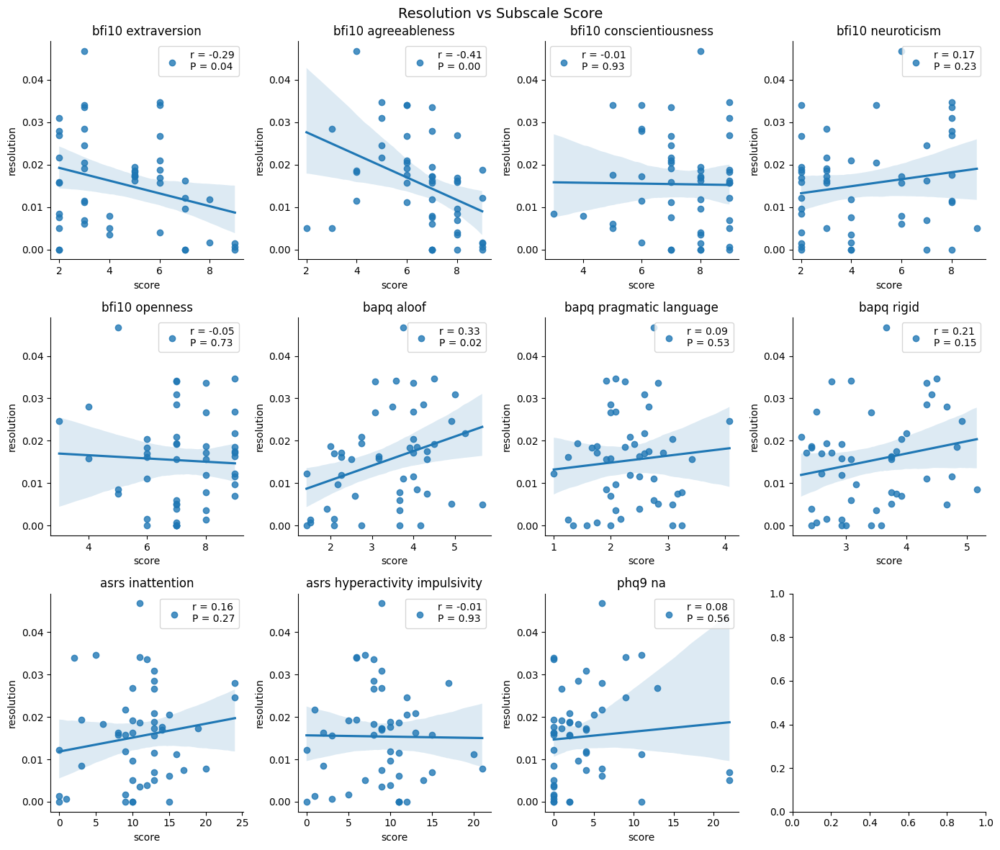

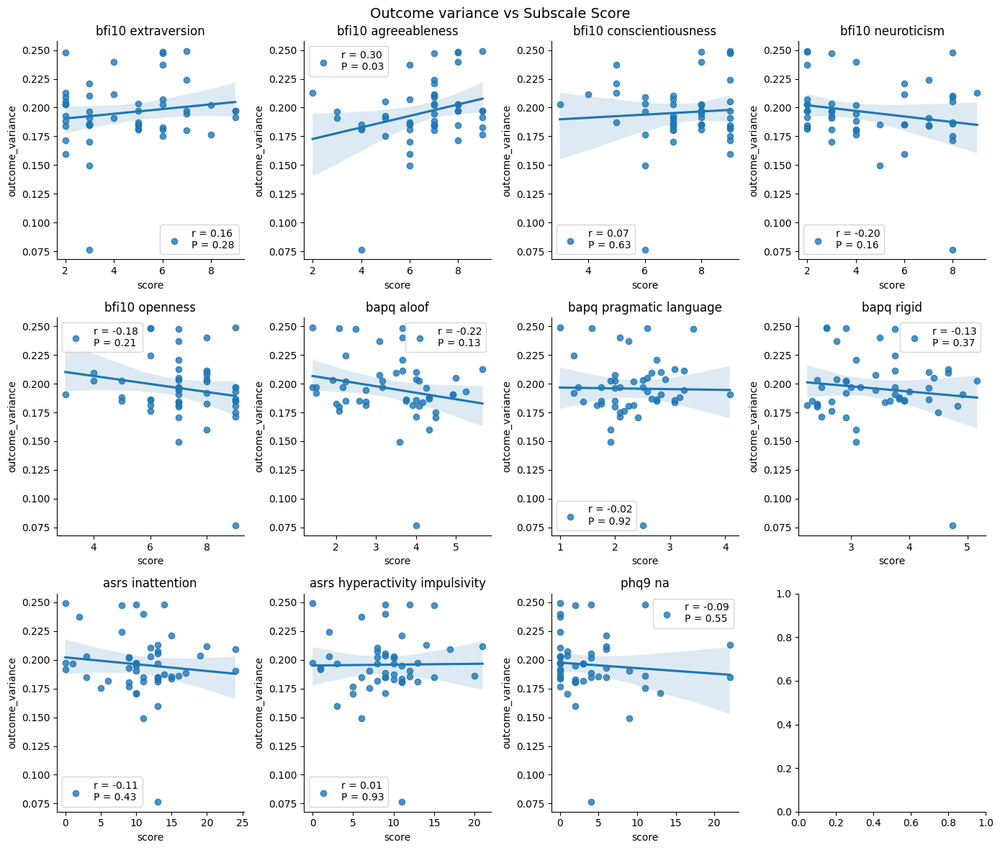

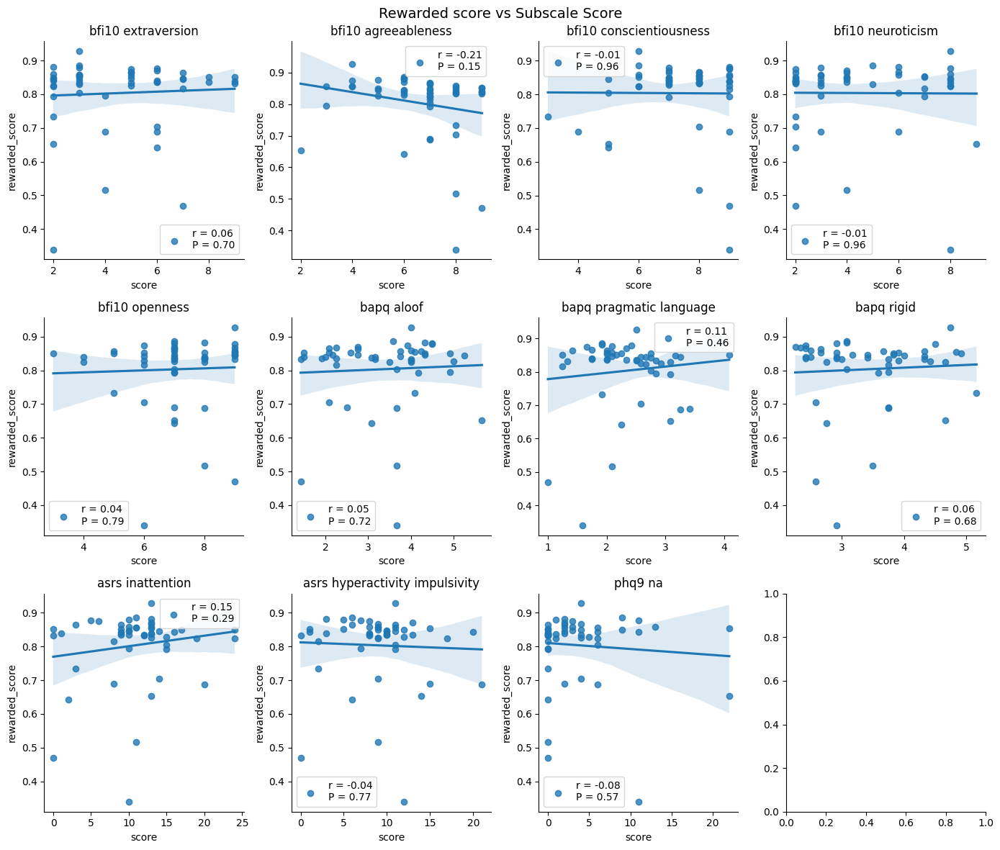

In [115]:
ratings = ['accuracy','brier_score','calibration','resolution','outcome_variance','rewarded_score']

mean_task_summaries = task_summaries.groupby('subject_id')[['accuracy', 'brier_score', 'calibration',
       'resolution','outcome_variance', 'calibration_converted_score', 'rewarded_score']].mean().reset_index()
mean_joint_subscale_scores_df = pd.merge(subscale_scores_df,mean_task_summaries,on='subject_id',how='left')

highperf_subscale_scores_df = mean_joint_subscale_scores_df.loc[mean_joint_subscale_scores_df.subject_id.isin(high_performing),:].drop_duplicates()

for rating in ratings:
    fig, ax = plt.subplots(3,4,figsize=(14,12))
    ax = ax.flatten()
    for i, subscale in enumerate(highperf_subscale_scores_df.subscale.unique()):
       joint_df = highperf_subscale_scores_df.loc[highperf_subscale_scores_df.subscale==subscale,:]
       corr, pval = pearsonr(joint_df["score"], joint_df[rating])
       ax[i] = sns.regplot(data=joint_df,x='score', y=rating,
              label=f'r = {corr:.2f}\nP = {pval:.2f}',ax=ax[i])
       ax[i].legend()
       ax[i].set_title(subscale.replace('_',' '))
    fig.suptitle(f"{rating.replace('_',' ').capitalize()} vs Subscale Score",fontsize=14)        
    fig.tight_layout()
    sns.despine()
    plt.show()

## Stats
Given the high covariance between subscales, linear independence assumptions are violated

In [116]:
well_calibrated_subscale_scores_df = joint_subscale_scores_df.loc[joint_subscale_scores_df.subject_id.isin(well_calibrated),:]
joint_subscale_pivot_df = pd.merge(well_calibrated_subscale_scores_df.pivot_table(values='score', index='subject_id', \
       columns='subscale', aggfunc='first').apply(zscore), task_summaries, on='subject_id', how='inner')
joint_subscale_pivot_df = pd.merge(joint_subscale_pivot_df,data_questionnaires.loc[:,\
       ['subject_id','gender', 'sex', 'age','education']].drop_duplicates(),on='subject_id',how='inner')
X = joint_subscale_pivot_df

subscales = ['asrs_hyperactivity_impulsivity', 'asrs_inattention','bapq_aloof', 'bapq_pragmatic_language', 'bapq_rigid',
       'bfi10_agreeableness', 'bfi10_conscientiousness', 'bfi10_extraversion','bfi10_neuroticism', 'bfi10_openness', 'phq9_na']
performance_metric = 'accuracy'

formula_multiple_regression=f"{performance_metric} ~ {'+'.join(subscales)}"

# est = smf.ols(formula=formula_multiple_regression,data=X).fit() 

# display(est.summary())

# vcf = { "sex": "0 + C(sex)"}
vcf = { "test": "0 + C(test)"}
X_ = copy.deepcopy(X)
X_['random_effects_group'] = 1
md = sm.MixedLM.from_formula(formula_multiple_regression, groups="random_effects_group",                                                    
                                vc_formula=vcf, re_formula="0", data=X_).fit()
print(md.summary())


                  Mixed Linear Model Regression Results
Model:                   MixedLM       Dependent Variable:       accuracy
No. Observations:        150           Method:                   REML    
No. Groups:              1             Scale:                    0.0101  
Min. group size:         150           Log-Likelihood:           94.2822 
Max. group size:         150           Converged:                Yes     
Mean group size:         150.0                                           
-------------------------------------------------------------------------
                               Coef.  Std.Err.   z    P>|z| [0.025 0.975]
-------------------------------------------------------------------------
Intercept                       0.709    0.009 76.030 0.000  0.691  0.728
asrs_hyperactivity_impulsivity -0.023    0.014 -1.641 0.101 -0.052  0.005
asrs_inattention                0.027    0.015  1.808 0.071 -0.002  0.055
bapq_aloof                     -0.014    0.025 -0.548 0.

/Users/warrenpettine/Dropbox/_PettineLab/Papers/2023_metacog_game/code/study_management_and_analysis/venv/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/warrenpettine/Dropbox/_PettineLab/Papers/2023_metacog_game/code/study_management_and_analysis/venv/lib/python3.12/site-packages/statsmodels/regression/mixed_linear_model.py:2201: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(
/Users/warrenpettine/Dropbox/_PettineLab/Papers/2023_metacog_game/code/study_management_and_analysis/venv/lib/python3.12/site-packages/statsmodels/regression/mixed_linear_model.py:2238: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


## Strategies among top and lowest calibrated

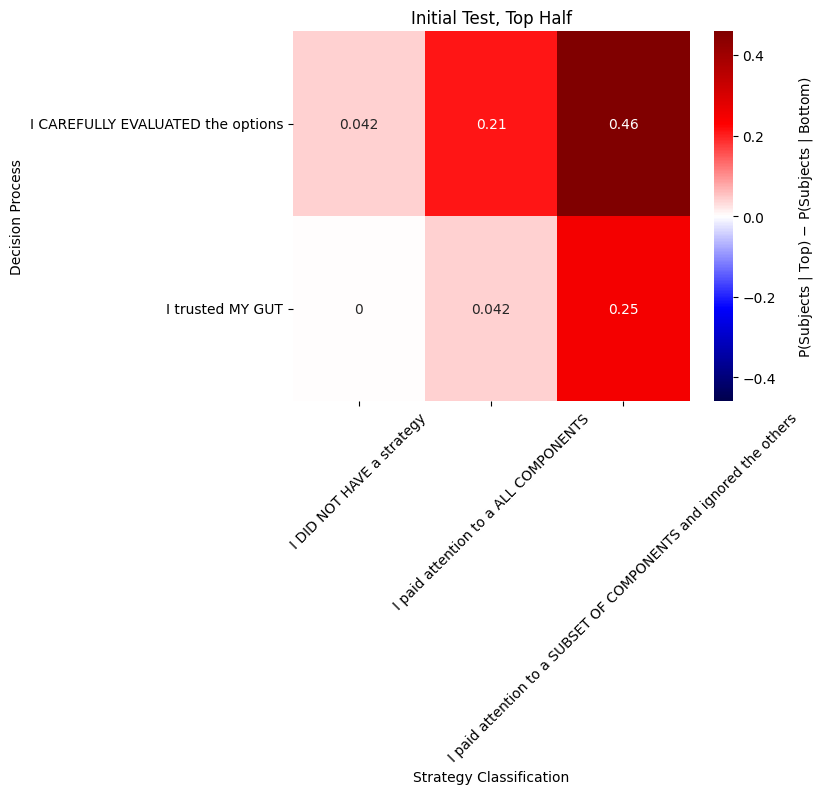

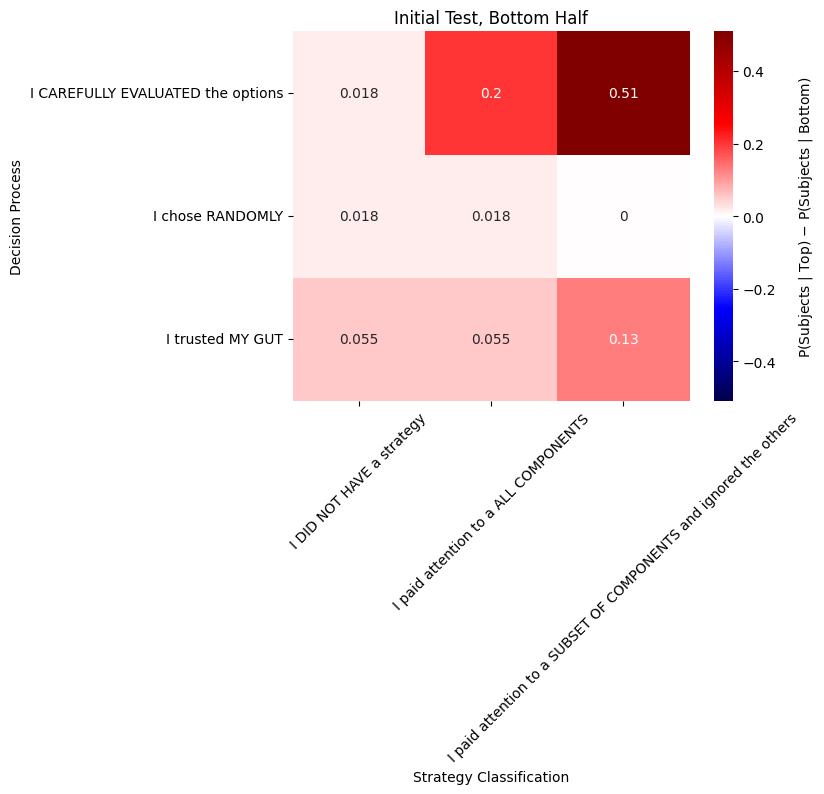

<Axes: title={'center': 'Initial Test, Difference'}, xlabel='Strategy Classification', ylabel='Decision Process'>

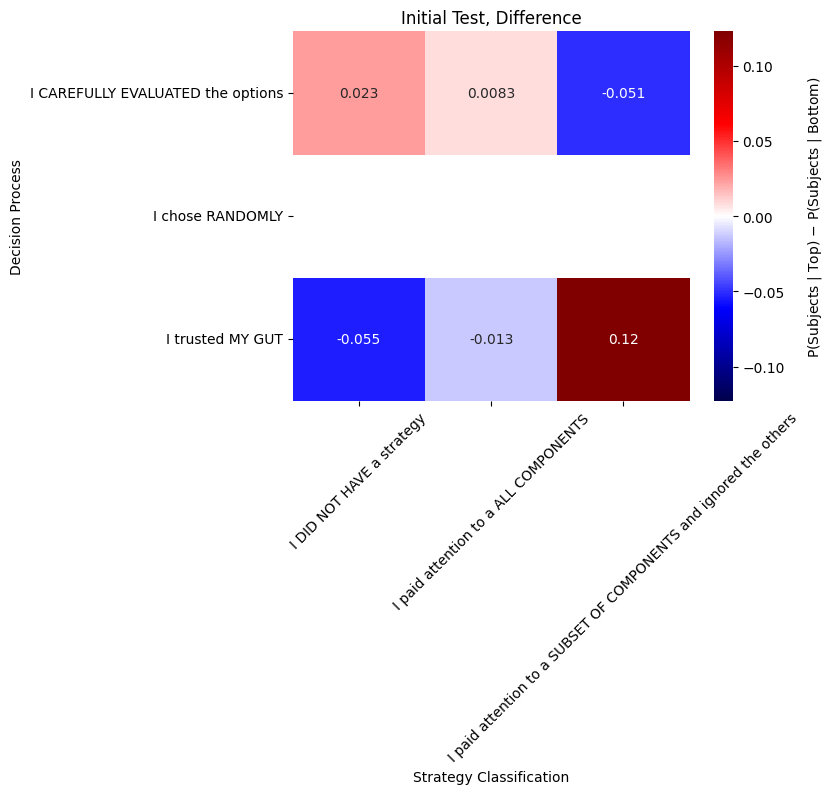

In [117]:
def createCrossTab(bar_df,test=0):
    strategy_df_tmp = bar_df.loc[:,['subject_id','strategy_prompt','strategy_response','test']].drop_duplicates()
    strategy_df_tmp = strategy_df_tmp.loc[strategy_df_tmp.test==test,:]
    strategy_df_tmp = strategy_df_tmp.pivot(index='subject_id',columns='strategy_prompt',values='strategy_response').\
        loc[:,['decision_process','strategy_classification']]
    # Create a cross-tabulation
    cross_tab = pd.crosstab(index=strategy_df_tmp['decision_process'], columns=strategy_df_tmp['strategy_classification'])
    return cross_tab

def plotCrosstabHeatmap(cross_tab_test0_diff,ttl='Initial Test',vmin=None,vmax=None):
    if vmin is None:
        vmin = -cross_tab_test0_diff.abs().max().max()
    if vmax is None:
        vmax = cross_tab_test0_diff.abs().max().max()
    ax = sns.heatmap(cross_tab_test0_diff, annot=True, cmap='seismic',vmin=vmin,vmax=vmax)
    ax.figure.axes[-1].set_ylabel('P(Subjects | Top) $-$ P(Subjects | Bottom)', labelpad=15)
    ax.tick_params(axis='x', rotation=45)
    ax.set_xlabel('Strategy Classification')
    ax.set_ylabel('Decision Process')
    ax.set_title(ttl)
    return ax
    
def calcCrosstabDiff(bar_df,test=0,fix=False,subject_ids_top=None):
    if subject_ids_top is None:
        subject_ids_top = bar_df.subject_id.unique()
    indx_subj_top = bar_df.subject_id.isin(subject_ids_top)
    cross_tab_top_calibration = createCrossTab(bar_df.loc[indx_subj_top,:],test=test)
    cross_tab_top_calibration = cross_tab_top_calibration / cross_tab_top_calibration.sum().sum()
    cross_tab_low_calibration = createCrossTab(bar_df.loc[~indx_subj_top,:],test=test)
    cross_tab_low_calibration = cross_tab_low_calibration / cross_tab_low_calibration.sum().sum()
    cross_tab_diff = cross_tab_top_calibration - cross_tab_low_calibration
    if fix:
        cross_tab_diff.loc[cross_tab_diff.index == 'I chose RANDOMLY',:] = cross_tab_low_calibration.loc[cross_tab_low_calibration.index == 'I chose RANDOMLY',:]
    return cross_tab_diff, cross_tab_top_calibration, cross_tab_low_calibration


task_summaries_mean = task_summaries.loc[task_summaries.subject_id.isin(well_calibrated),:].groupby('subject_id').mean()
task_summaries_mean = task_summaries_mean.reset_index().drop(columns=['test']).sort_values('calibration',ascending=True)

subject_ids_top = task_summaries_mean.subject_id[:int(task_summaries_mean.shape[0]/2)].to_list()

bar_df = pd.merge(data.loc[:,['subject_id','strategy_prompt','strategy_response','test']].drop_duplicates(),
                  task_summaries_mean, on=['subject_id'],how='left')

bar_df_ = bar_df.loc[bar_df.strategy_response != 'I WROTE DOWN the components and classifications' ,:]

cross_tab_test0_diff, cross_tab_test0_top_calibration, cross_tab_test0_low_calibration = \
    calcCrosstabDiff(bar_df_,test=0,subject_ids_top=subject_ids_top)
cross_tab_test1_diff, cross_tab_test1_top_calibration, cross_tab_test1_low_calibration = \
    calcCrosstabDiff(bar_df_,test=1,subject_ids_top=subject_ids_top)
cross_tab_test2_diff, cross_tab_test2_top_calibration, cross_tab_test2_low_calibration = \
    calcCrosstabDiff(bar_df_,test=2,fix=False,subject_ids_top=subject_ids_top)

# vmax = max(cross_tab_test0_diff.abs().max().max(),cross_tab_test1_diff.abs().max().max(),cross_tab_test2_diff.abs().max().max())
vmax = max(cross_tab_test0_diff.abs().max().max(),cross_tab_test0_top_calibration.abs().max().max(),cross_tab_test0_low_calibration.abs().max().max())

vmin = -vmax

vmax, vmin = None, None
fig_dir = 'plots/'

plotCrosstabHeatmap(cross_tab_test0_top_calibration,ttl='Initial Test, Top Half',vmin=vmin,vmax=vmax)
plt.savefig(os.path.join(fig_dir,'strategy_top_calibration.svg'),dpi=300)
plt.show()
plotCrosstabHeatmap(cross_tab_test0_low_calibration,ttl='Initial Test, Bottom Half',vmin=vmin,vmax=vmax)
plt.savefig(os.path.join(fig_dir,'strategy_bottom_calibration.svg'),dpi=300)
plt.show()
plotCrosstabHeatmap(cross_tab_test0_diff,ttl='Initial Test, Difference',vmin=vmin,vmax=vmax)
# plt.show()
# plotCrosstabHeatmap(cross_tab_test1_diff,ttl='Retest 1 Week',vmin=vmin,vmax=vmax)
# plt.show()
# plotCrosstabHeatmap(cross_tab_test2_diff,ttl='Retest 2 Weeks',vmin=vmin,vmax=vmax)
# plt.show()

#### Hack together to fill in the empty spaces

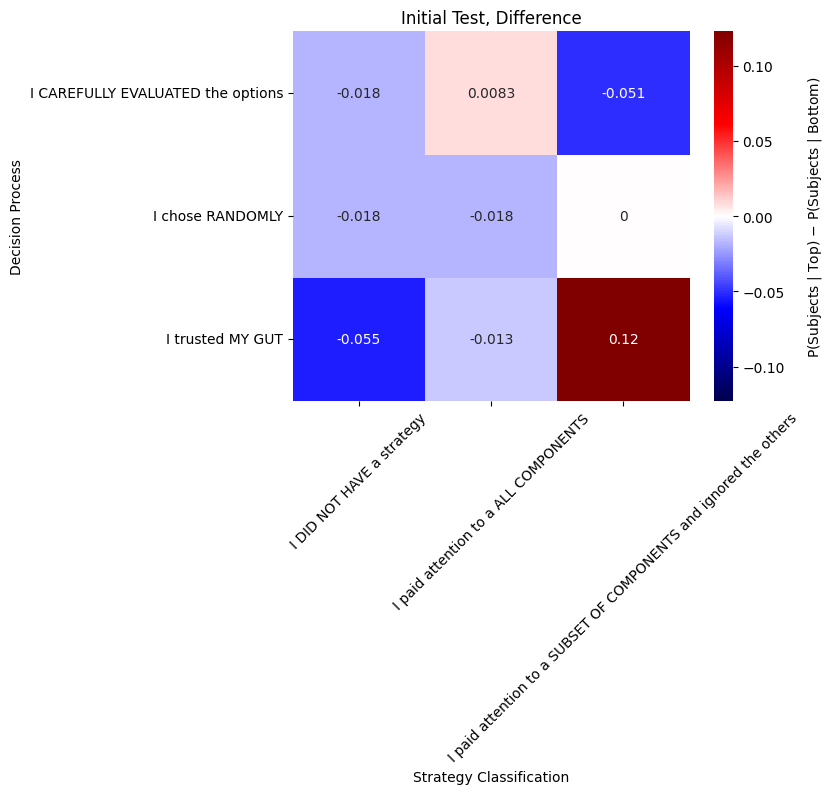

In [118]:
cross_tab_test0_reset = cross_tab_test0_low_calibration.copy()
cross_tab_test0_reset[:] = 0

cross_tab_test0_reset.loc[cross_tab_test0_reset.index == 'I CAREFULLY EVALUATED the options',
    ['I paid attention to a ALL COMPONENTS','I paid attention to a SUBSET OF COMPONENTS and ignored the others']] = \
cross_tab_test0_top_calibration.loc[cross_tab_test0_top_calibration.index == 'I CAREFULLY EVALUATED the options',\
    ['I paid attention to a ALL COMPONENTS','I paid attention to a SUBSET OF COMPONENTS and ignored the others']]

cross_tab_test0_reset.loc[cross_tab_test0_reset.index == 'I trusted MY GUT',
    ['I paid attention to a ALL COMPONENTS','I paid attention to a SUBSET OF COMPONENTS and ignored the others']] = \
cross_tab_test0_top_calibration.loc[cross_tab_test0_top_calibration.index == 'I trusted MY GUT',\
    ['I paid attention to a ALL COMPONENTS','I paid attention to a SUBSET OF COMPONENTS and ignored the others']]

cross_tab_test0_top_calibration_filled = cross_tab_test0_reset

cross_tab_test0_diff = cross_tab_test0_top_calibration_filled - cross_tab_test0_low_calibration


plotCrosstabHeatmap(cross_tab_test0_diff,ttl='Initial Test, Difference')
plt.savefig(os.path.join(fig_dir,'strategy_difference.svg'),dpi=300)


# Factor analysis of groups
Perform factor analysis using responses of all subjects
## First get scree and cumulative variance

547.6861101992763 2.4546712401244478e-82
0.7410015159868814


(array([2.49101624, 2.37568487, 0.92371381]),
 array([0.22645602, 0.21597135, 0.08397398]),
 array([0.22645602, 0.44242737, 0.52640136]))

array([4.5022354 , 1.64578725, 1.14449598, 0.8092373 , 0.73196224,
       0.61012531, 0.53185447, 0.44462078, 0.2968325 , 0.1743921 ,
       0.10845666])

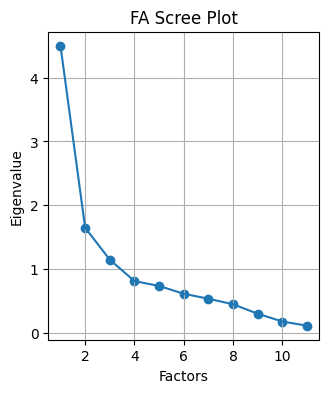

In [119]:
save_bool = False 
source='subscale' # 'individual' or 'subscale'

n_factors = 2

vals =  getSubdimMatrixDF(source=source,subscale_scores_df=subscale_scores_df,data_questionnaires=data_questionnaires)

chi_square_value,p_value=calculate_bartlett_sphericity(vals)
print(chi_square_value, p_value)

kmo_all,kmo_model=calculate_kmo(vals)
print(kmo_model)

# Create factor analysis object and perform factor analysis
fa = FactorAnalyzer()
# fa.analyze(vals, 25, rotation=None)
fa.fit(vals)
display(fa.get_factor_variance())
# Check Eigenvalues
ev, v = fa.get_eigenvalues()
display(ev)

# Create scree plot using matplotlib
fig, ax = plt.subplots(1,1,figsize=(3.5,4))
ax.scatter(range(1,vals.shape[1]+1),ev)
ax.plot(range(1,vals.shape[1]+1),ev)
ax.set_title('FA Scree Plot')
ax.set_xlabel('Factors')
ax.set_ylabel('Eigenvalue')
ax.grid()

if save_bool:
    plt.savefig(os.path.join(fig_dir,f'scree_plot_{source}.svg'),facecolor='w',dpi=300)
plt.show()

# fa = FactorAnalyzer(n_factors=n_factors,rotation='varimax')
# fa.fit(vals)

# new_variables = fa.fit_transform(vals.loc[vals.index.isin(task_summaries['subject_id']),:])

total_variance = sum(ev)

# Calculate the percentage of variance explained by each factor
percentage_variance_explained = ev / total_variance

fig, ax = plt.subplots(1,1,figsize=(2,4))
ax.bar(np.arange(len(percentage_variance_explained)),np.cumsum(percentage_variance_explained))
ax.plot(ax.get_xlim(),[0.6,0.6],'k--')
ax.set_ylabel('Proportion of Variance Explained')
ax.set_xlabel('Factor Number')
ax.set_title('Cumulative Variance')
sns.despine()
if save_bool:
    fig.savefig(os.path.join(fig_dir,f'cumulative_variance_{source}.svg'),facecolor='w',dpi=300)


### FA on those above cutoff

In [120]:
factor_threshold = 1
n_factors = np.sum(ev>factor_threshold)
# n_factors = 2
print(f'Number of factors: {n_factors}')
fa = FactorAnalyzer(n_factors=n_factors,rotation='varimax')
fa.fit(vals)
# fa.loadings_

print(pd.DataFrame(fa.loadings_,index=vals.columns))

print(pd.DataFrame(fa.get_factor_variance(),index=['Variance','Proportional Var','Cumulative Var']))

print(pd.DataFrame(fa.get_communalities(),index=vals.columns,columns=['Communalities']))


Number of factors: 3
                                       0         1         2
subscale                                                    
asrs_hyperactivity_impulsivity -0.091402  0.809789  0.254678
asrs_inattention                0.124852  0.704663  0.604183
bapq_aloof                      0.927617  0.022894  0.284707
bapq_pragmatic_language         0.352222  0.508241  0.527303
bapq_rigid                      0.583174  0.256070  0.243416
bfi10_agreeableness            -0.447814 -0.146857 -0.075392
bfi10_conscientiousness        -0.177642 -0.247052 -0.423233
bfi10_extraversion             -0.724707 -0.059458 -0.254029
bfi10_neuroticism               0.475511  0.587990 -0.027112
bfi10_openness                 -0.124394  0.020452 -0.389719
phq9_na                         0.380550  0.630182 -0.034330
                         0         1         2
Variance          2.492265  2.306131  1.251391
Proportional Var  0.226570  0.209648  0.113763
Cumulative Var    0.226570  0.436218  0.54998

### Plot the factors

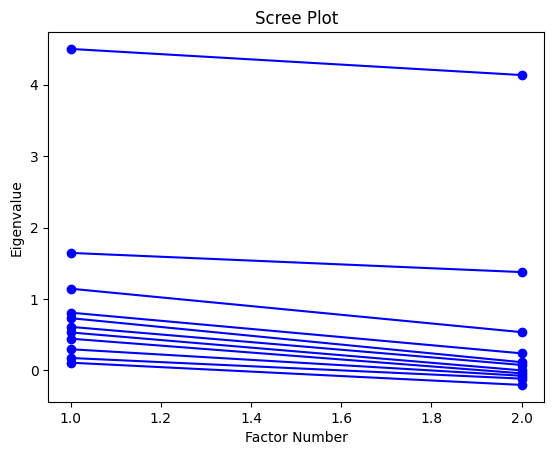

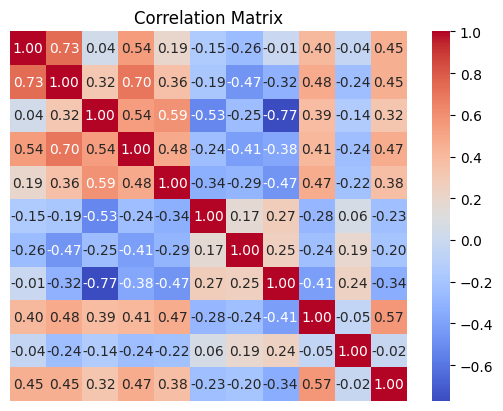

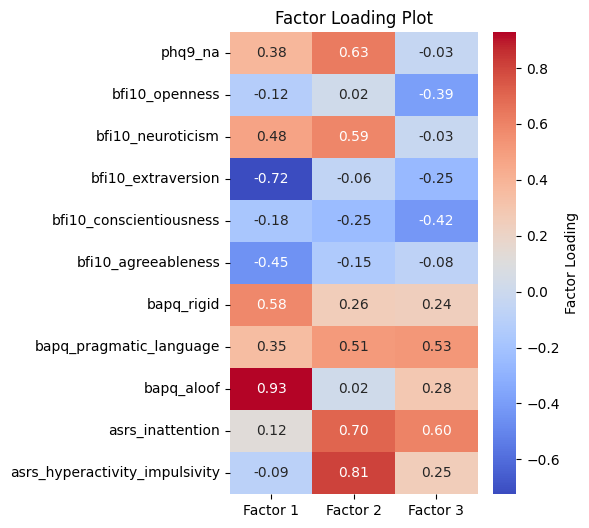

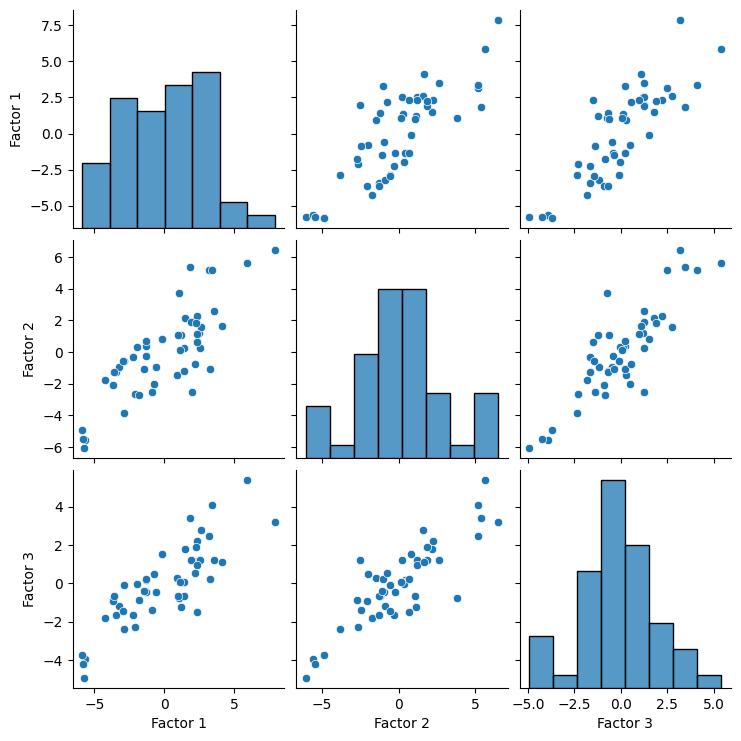

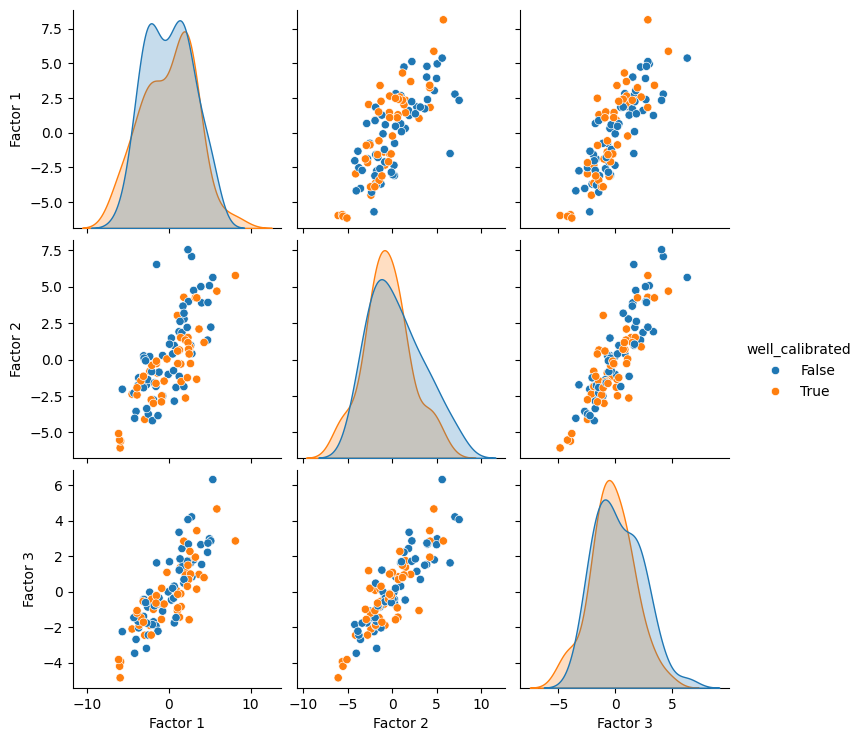

-0.1381025994905626 0.8904289609368958
-1.7869814264244592 0.07688205133924304
-1.3991748462471716 0.16476483103304096


In [123]:
factor_model = fa

loadings = factor_model.loadings_

# Scree plot
eigenvalues = factor_model.get_eigenvalues()
plt.plot(np.arange(1, len(eigenvalues) + 1), eigenvalues, 'bo-')
plt.xlabel('Factor Number')
plt.ylabel('Eigenvalue')
plt.title('Scree Plot')
plt.show()

# Correlation matrix
corr_matrix = np.corrcoef(vals, rowvar=False)
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", xticklabels=False, yticklabels=False)
plt.title('Correlation Matrix')
plt.show()

# Factor loading plot
plt.figure(figsize=(4, 6))
# ax = sns.heatmap(loadings, annot=True, fmt=".2f", cmap="coolwarm", yticklabels=renameDfColumns(vals).columns,
#             xticklabels=[f'Factor {i+1}' for i in np.arange(n_factors)],cbar_kws={'label': 'Factor Loading'})
ax = sns.heatmap(loadings, annot=True, fmt=".2f", cmap="coolwarm", yticklabels=vals.columns,
            xticklabels=[f'Factor {i+1}' for i in np.arange(n_factors)],cbar_kws={'label': 'Factor Loading'})
ax.invert_yaxis()
plt.title('Factor Loading Plot')
plt.show()

target_subscale_scores_df = subscale_scores_df.loc[subscale_scores_df.subject_id.isin(well_calibrated),:].drop_duplicates()
vals_target =  getSubdimMatrixDF(source=source,subscale_scores_df=target_subscale_scores_df,data_questionnaires=data_questionnaires)

subject_projection = vals_target @ loadings
subject_projection.rename(columns={i:f'Factor {i+1}' for i in np.arange(n_factors)},inplace=True)
sns.pairplot(subject_projection)
plt.show()


subject_projection_group = vals @ loadings
vals_groups = copy.deepcopy(subject_projection_group)
vals_groups['well_calibrated'] = vals.index.isin(subscale_scores_df[subscale_scores_df.subject_id.isin(well_calibrated)].subject_id.unique())
vals_groups.rename(columns={i:f'Factor {i+1}' for i in np.arange(n_factors)},inplace=True)
sns.pairplot(vals_groups,hue='well_calibrated')
plt.show()

for i in np.arange(n_factors):
    t_val, p_val = ttest_ind(vals_groups[vals_groups.well_calibrated][f'Factor {i+1}'],
                          vals_groups[~vals_groups.well_calibrated][f'Factor {i+1}'])

    print(t_val, p_val)

## Factors versus task metrics

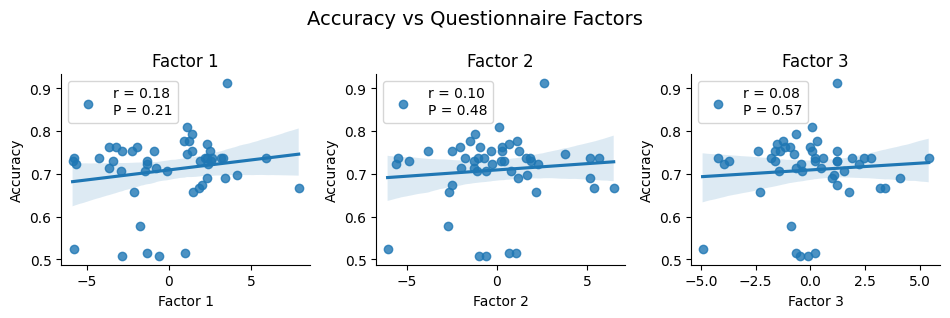

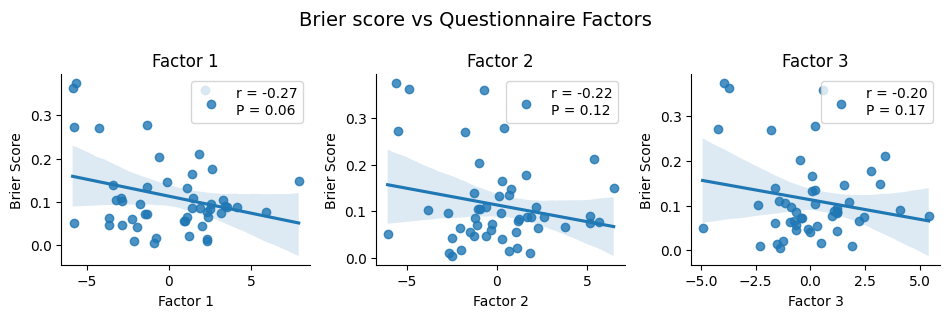

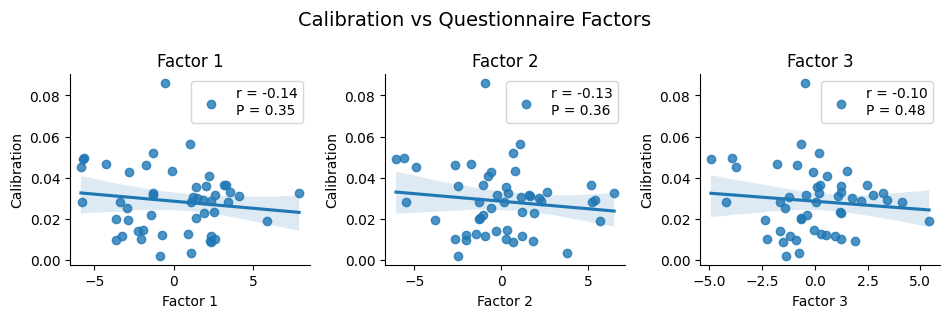

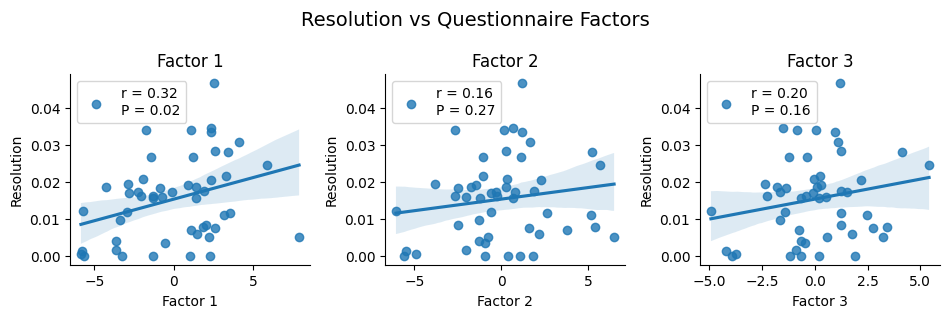

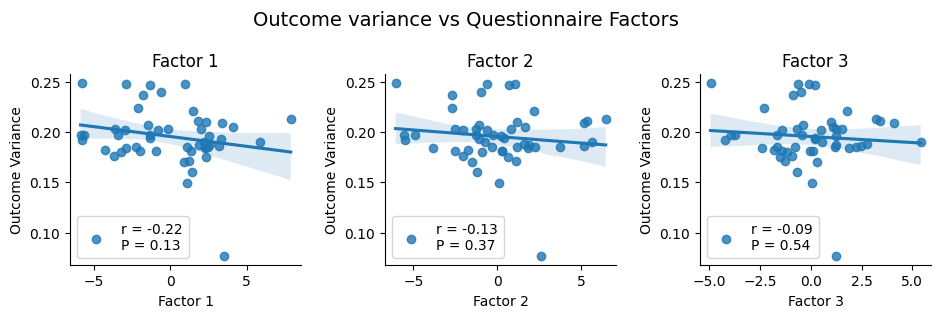

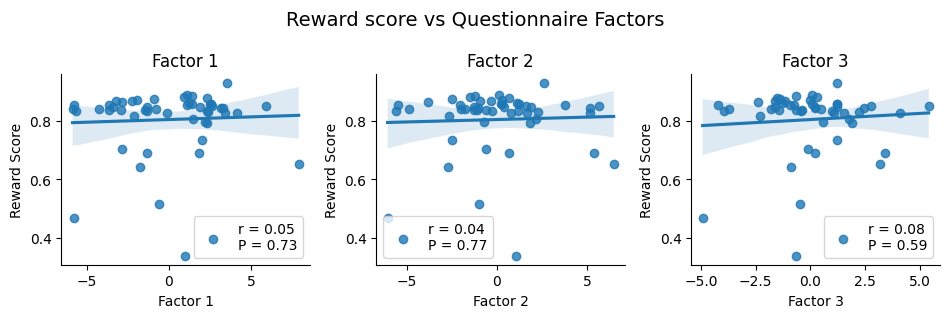

In [127]:
save_bool = False

factor_jointplot = pd.merge(subject_projection,task_summaries.loc[task_summaries.subject_id.isin(subject_projection.index),:],left_index=True,right_on='subject_id',how='inner')
# factor_jointplot = pd.merge(subject_projection,task_summaries,left_index=True,right_on='subject_id',how='inner')


factor_names = [f'Factor {i+1}' for i in np.arange(n_factors)]


fig_dir = 'plots/'
mean_factor_jointplot = factor_jointplot.groupby('subject_id')[factor_names +
       ['accuracy', 'brier_score', 'calibration', 'resolution',
       'outcome_variance', 'calibration_converted_score', 'rewarded_score']].mean().reset_index()

mean_factor_jointplot.rename(columns={'accuracy':'Accuracy','brier_score':'Brier Score','calibration':'Calibration','resolution':'Resolution',
                                      'outcome_variance':'Outcome Variance','rewarded_score':'Reward Score'},inplace=True)

ratings = ['accuracy','brier_score','calibration','resolution','outcome_variance','rewarded_score']
ratings = ['Accuracy','Brier Score','Calibration','Resolution','Outcome Variance','Reward Score']

# highperf_subscale_scores_df = joint_subscale_scores_df.loc[joint_subscale_scores_df.subject_id.isin(high_performing),:].drop_duplicates()

for rating in ratings:
    fig, ax = plt.subplots(1,n_factors,figsize=np.array([n_factors*4,4])*.8)
    ax = ax.flatten()
    for i, factor in enumerate(factor_names):
       corr, pval = pearsonr(mean_factor_jointplot[factor], mean_factor_jointplot[rating])
       ax[i] = sns.regplot(data=mean_factor_jointplot,x=factor, y=rating,
              label=f'r = {corr:.2f}\nP = {pval:.2f}',ax=ax[i])
       ax[i].legend()
       ax[i].set_title(factor)
    fig.suptitle(f"{rating.replace('_',' ').capitalize()} vs Questionnaire Factors",fontsize=14)        
    fig.tight_layout()
    sns.despine()
    if save_bool:
       fig.savefig(os.path.join(fig_dir,f'factors_vs_{rating}.svg'),facecolor='w',dpi=300)
    plt.show()

### Fit results of factors to metrics

In [130]:
X = mean_factor_jointplot.copy()
factors = [f'Factor_{i+1}' for i in np.arange(n_factors)]
X.rename(columns={f'Factor {i+1}':f'Factor_{i+1}' for i in np.arange(n_factors)},inplace=True)
performance_metric = 'Resolution'

formula_multiple_regression=f"{performance_metric} ~ {'+'.join(factors)}"

est = smf.ols(formula=formula_multiple_regression,data=X).fit() 

display(est.summary())


# vcf = { "sex": "0 + C(sex)"}
# vcf = { "test": "0 + C(test)"}
# X_ = copy.deepcopy(X)
# X_['random_effects_group'] = 1
# md = sm.MixedLM.from_formula(formula_multiple_regression, groups="random_effects_group",                                                    
#                                 vc_formula=vcf, re_formula="0", data=X_).fit()
# print(md.summary())


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:             Resolution   R-squared:                       0.137
Model:                            OLS   Adj. R-squared:                  0.081
Method:                 Least Squares   F-statistic:                     2.435
Date:                Sat, 18 Nov 2023   Prob (F-statistic):             0.0767
Time:                        15:56:12   Log-Likelihood:                 157.81
No. Observations:                  50   AIC:                            -307.6
Df Residuals:                      46   BIC:                            -300.0
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.0154      0.002     10.124      0.000       0.012       0.018
Factor_1       0.0021      0.001      2.269      0.028       0.000       0.004
Factor_2      -0.0010      0.001     -0.905      0.370      -0.003       0.001
Factor_3      -0.0004      0.002     -0.243      0.809      -0.004       0.003
==============================================================================
Omnibus:                        0.725   Durbin-Watson:                   2.165
Prob(Omnibus):                  0.696   Jarque-Bera (JB):                0.790
Skew:                           0.260   Prob(JB):                        0.674
Kurtosis:                       2.671   Cond. No.                         5.27
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [9]:
subject_ids = data_test_all.subject_id.unique()

for id in subject_ids:
    id
    break

In [13]:
stim_names = data_test_all.loc[(data_test_all.subject_id==id)&(data_test_all.use=='task'),:].name.unique()

data_slice = data_test_all.loc[(data_test_all.subject_id==id)&(data_test_all.use=='task'),:]

for stim in stim_names:
    data_test_all

In [26]:
stim_names = data_retest_2.name.unique()

In [30]:
# Load all subject task data from all sessions
data_initial_test = pd.read_csv(os.path.join(data_dir,'task_data_initial_test.csv'))
data_retest_1 = pd.read_csv(os.path.join(data_dir,'task_data_retest_1.csv'))
data_retest_2 = pd.read_csv(os.path.join(data_dir,'task_data_retest_2.csv'))
data_initial_test['test'] = 0
data_retest_1['test'] = 1
data_retest_2['test'] = 2
data_test_all = pd.concat([data_initial_test,data_retest_1,data_retest_2])

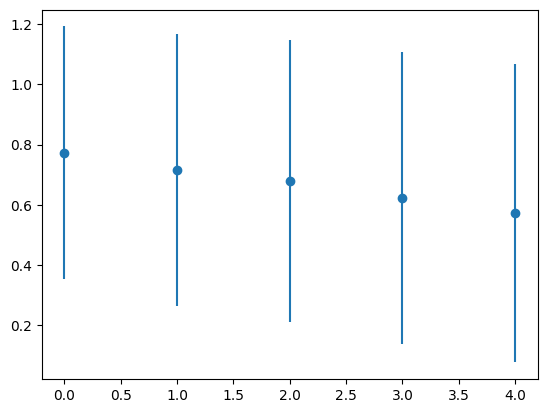

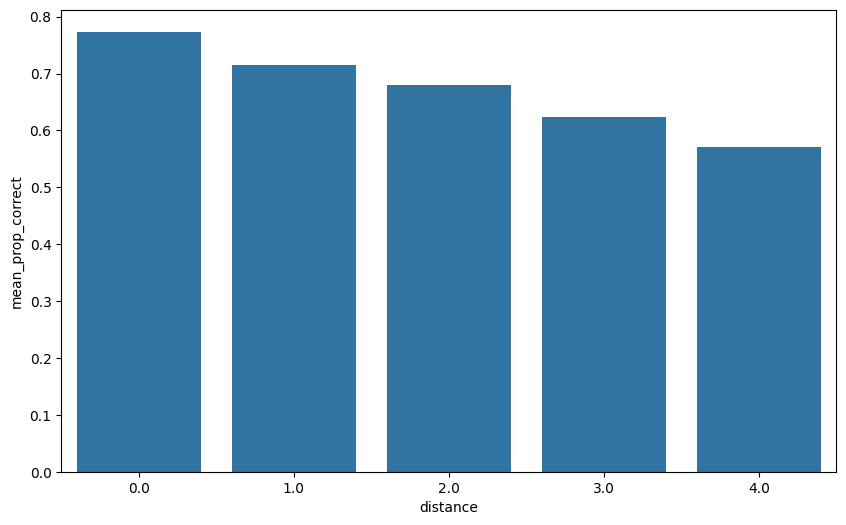

In [81]:
data_slice = data_initial_test.loc[(data_initial_test.use=='task')&
                                   (data_initial_test.subject_id.isin(well_calibrated)),:]
data_slice.loc[data_slice.name.str.contains('prototype'),['distance']] = 0
data_slice.loc[data_slice.name.str.contains('d1'),['distance']] = 1
data_slice.loc[data_slice.name.str.contains('d2'),['distance']] = 2
data_slice.loc[data_slice.name.str.contains('d3'),['distance']] = 3
data_slice.loc[data_slice.name.str.contains('d4'),['distance']] = 4

# Calculate mean proportion correct and standard deviation across subjects for each distance
mean_prop_correct = data_slice.groupby('distance')['correct'].mean()
std_across_subjects = data_slice.groupby('distance')['correct'].std()

# Combine the results into a new DataFrame
result_df = pd.DataFrame({
    'distance': mean_prop_correct.index,
    'mean_prop_correct': mean_prop_correct.values,
    'std_across_subjects': std_across_subjects.values
})

plt.errorbar(mean_prop_correct.index,mean_prop_correct.values,yerr=std_across_subjects.values,fmt='o')

# Plot the mean proportion correct with error bars
plt.figure(figsize=(10, 6))
sns.barplot(x='distance', y='mean_prop_correct', data=result_df, errorbar='sd')

# Show the plot
plt.show()

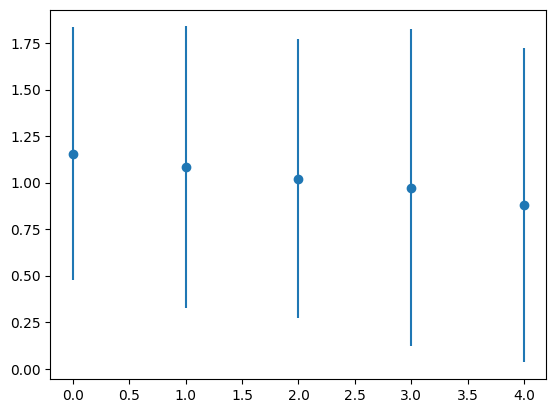

In [83]:
df = data_slice.copy()

# Calculate mean proportion correct for each subject
subject_mean_prop_correct = df.groupby('subject_id')['correct'].mean()

# Merge the mean proportion correct for each subject back into the original DataFrame
df = pd.merge(df, subject_mean_prop_correct, left_on='subject_id', right_index=True, suffixes=('', '_subject'))

# Normalize each subject's proportion correct by their overall proportion correct
df['prop_correct_normalized'] = df['correct'] / df['correct_subject']

# Calculate mean proportion correct and standard deviation across subjects for each distance
mean_prop_correct = df.groupby('distance')['prop_correct_normalized'].mean()
std_across_subjects = df.groupby('distance')['prop_correct_normalized'].std()

# Combine the results into a new DataFrame
result_df = pd.DataFrame({
    'distance': mean_prop_correct.index,
    'mean_prop_correct': mean_prop_correct.values,
    'std_across_subjects': std_across_subjects.values
})

plt.errorbar(mean_prop_correct.index,mean_prop_correct.values,yerr=std_across_subjects.values,fmt='o')

plt.show()

In [84]:
subject_mean_prop_correct

subject_id
8      0.812500
12     0.890625
17     0.484375
20     0.796875
23     0.718750
26     0.437500
29     0.734375
30     0.468750
31     0.703125
35     0.750000
37     0.750000
38     0.687500
39     0.203125
41     0.687500
46     0.718750
47     0.750000
48     0.515625
49     0.687500
51     0.718750
52     0.750000
53     0.640625
55     0.562500
57     0.531250
59     0.562500
61     0.703125
66     0.703125
70     0.812500
71     0.687500
74     0.609375
75     0.718750
79     0.484375
80     0.750000
81     0.750000
82     0.593750
83     0.796875
85     0.437500
86     0.671875
88     0.796875
90     0.812500
91     0.328125
92     0.546875
93     0.828125
95     0.625000
96     0.718750
97     0.390625
98     0.656250
103    0.750000
104    0.562500
106    0.578125
109    0.750000
110    0.515625
112    0.828125
113    0.781250
Name: correct, dtype: float64

In [88]:
# Ensure 'correct' column is boolean
df['correct'] = df['correct'].astype(bool)

# Calculate mean proportion correct for each subject
subject_mean_prop_correct = df.groupby('subject_id')['correct'].mean()

# Merge the mean proportion correct for each subject back into the original DataFrame
df = pd.merge(df, subject_mean_prop_correct, left_on='subject_id', right_index=True, suffixes=('', '_subject'))

# Ensure 'correct_subject' column is boolean
df['correct_subject'] = df['correct_subject'].astype(bool)

# Normalize each subject's proportion correct by their overall proportion correct
df['prop_correct_normalized'] = df['correct'].astype(int) / df['correct_subject'].astype(int)

# Perform linear regression for each subject
regression_results = sns.lmplot(x='distance', y='prop_correct_normalized', hue='subject_id', data=df, ci=None, height=6, aspect=1.5)

# Set labels and title
plt.xlabel('Distance')
plt.ylabel('Normalized Proportion Correct')
plt.title('Linear Regression for Each Subject')

# Show the plot
plt.show()

TypeError: '<' not supported between instances of 'str' and 'int'

        Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: correct 
No. Observations: 320     Method:             REML    
No. Groups:       64      Scale:              0.0144  
Min. group size:  5       Log-Likelihood:     149.4414
Max. group size:  5       Converged:          Yes     
Mean group size:  5.0                                 
------------------------------------------------------
           Coef.  Std.Err.    z    P>|z| [0.025 0.975]
------------------------------------------------------
Intercept   0.761    0.022  35.009 0.000  0.719  0.804
distance   -0.049    0.005 -10.258 0.000 -0.058 -0.039
Group Var   0.022    0.041                            



/Users/warrenpettine/Dropbox/_PettineLab/Papers/2023_metacog_game/code/study_management_and_analysis/venv/lib/python3.12/site-packages/statsmodels/regression/mixed_linear_model.py:2238: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


        Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: correct 
No. Observations: 320     Method:             REML    
No. Groups:       64      Scale:              0.0183  
Min. group size:  5       Log-Likelihood:     162.1945
Max. group size:  5       Converged:          Yes     
Mean group size:  5.0                                 
------------------------------------------------------
           Coef.  Std.Err.    z    P>|z| [0.025 0.975]
------------------------------------------------------
Intercept   0.870    0.015  59.739 0.000  0.841  0.898
distance   -0.084    0.005 -15.744 0.000 -0.095 -0.074
Group Var   0.003    0.009                            



/Users/warrenpettine/Dropbox/_PettineLab/Papers/2023_metacog_game/code/study_management_and_analysis/venv/lib/python3.12/site-packages/statsmodels/regression/mixed_linear_model.py:2238: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


        Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: correct 
No. Observations: 320     Method:             REML    
No. Groups:       64      Scale:              0.0112  
Min. group size:  5       Log-Likelihood:     229.5621
Max. group size:  5       Converged:          Yes     
Mean group size:  5.0                                 
------------------------------------------------------
           Coef.  Std.Err.    z    P>|z| [0.025 0.975]
------------------------------------------------------
Intercept   0.914    0.012  73.975 0.000  0.890  0.939
distance   -0.071    0.004 -16.991 0.000 -0.079 -0.063
Group Var   0.003    0.010                            



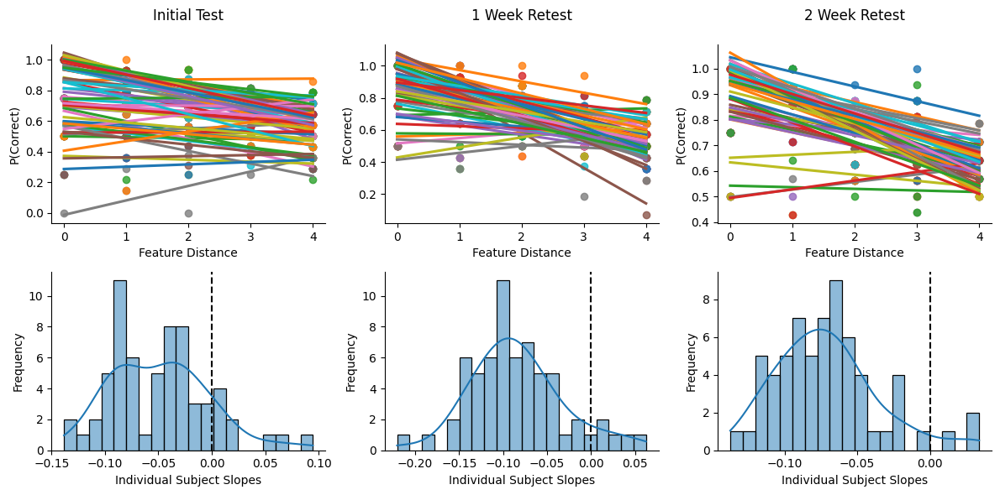

In [158]:
# Define a function to fit linear regression to each group
def fit_regression(group):
    slope, intercept, _, _, _ = linregress(group['distance'], group['correct'])
    return pd.Series({'slope': slope, 'intercept': intercept})

def getRetestDistances(df,retest=1):
    prototype_A = prototype_codes.name[(prototype_codes.prototype=='A')&(prototype_codes.retest==retest)].values[0].split('_')
    prototype_B = prototype_codes.name[(prototype_codes.prototype=='B')&(prototype_codes.retest==retest)].values[0].split('_')
    distance = np.zeros((df.shape[0],2))
    # distance_B = np.zeros(df.shape[0])
    for i, name in enumerate(df.name.to_list()):
        stim_code = name.split('_')
        distance[i,0]= sum([proto_val != stim_val for proto_val, stim_val in zip(prototype_A,stim_code)])
        distance[i,1]= sum([proto_val != stim_val for proto_val, stim_val in zip(prototype_B,stim_code)])
        
    distance = np.min(distance,axis=1)
    return distance

def calcDistancePerfRegression(df):
    # Sample DataFrameGroupBy object (replace this with your actual DataFrameGroupBy)
    grouped_df = df.groupby(['subject_id', 'distance'])['correct'].mean().reset_index()

    # Apply the function to each group
    regression_results = grouped_df.groupby('subject_id').apply(fit_regression)

    # Merge the results back into the original DataFrameGroupBy
    grouped_df = pd.merge(grouped_df.reset_index(), regression_results, on='subject_id')
    
    return grouped_df, regression_results

def plotSlopesLine(grouped_df,ttl='Linear Regression for Each Subject',ax=None):
    if ax is None:
        _, ax = plt.subplots(1,1,figsize=(10, 6))
    # Plot the results
    # sns.lmplot(x='distance', y='correct', hue='subject_id', data=grouped_df, ci=None, height=6, 
    #         aspect=1.5,legend=False,ax=ax)
        # Fit linear regression to the group
    for subject_id in grouped_df.subject_id.unique():
        sns.regplot(data=grouped_df.loc[grouped_df.subject_id==subject_id,:],x='distance', y='correct',
                    ci=None,ax=ax)
        # slope, _, _, _, _ = linregress(group['distance'], group['correct'])
        # Plot lmplot on the provided axis
        # sns.regplot(x='distance', y='correct', data=group, ci=None, ax=ax)
    
    # Set labels and title
    ax.set_xlabel('Feature Distance')
    ax.set_ylabel('P(Correct)')
    ax.set_title(ttl)
    return ax

def plotSlopesHist(regression_results,ttl='Histogram of Slopes for Each Subject\'s Regression',ax=None):
    if ax is None:
        _, ax = plt.subplots(1,1,figsize=(10, 6))
    # Plot a histogram of the slopes
    ax = sns.histplot(regression_results['slope'], bins=20, kde=True, ax=ax)
    ax.axvline(0, color='k', linestyle='--')
    ax.set_xlabel('Individual Subject Slopes')
    ax.set_ylabel('Frequency')
    ax.set_title(ttl)
    return ax

prototype_codes = pd.DataFrame({
    'prototype': ['A','B','A','B'],
    'retest': [1,1,2,2],
    'name': ['0-A-1_1-B-1_2-C-1_3-D-2_4-E-1_5-A-3_6-B-3_7-C-3_8-D-4_9-E-3',
             '0-A-2_1-B-2_2-C-2_3-D-1_4-E-2_5-A-4_6-B-4_7-C-4_8-D-3_9-E-4',
             '0-A-1_1-B-2_2-C-1_3-D-2_4-E-1_5-A-4_6-B-4_7-C-3_8-D-4_9-E-4',
             '0-A-2_1-B-1_2-C-2_3-D-1_4-E-2_5-A-3_6-B-3_7-C-4_8-D-3_9-E-3']
})

fig, ax = plt.subplots(2,3,figsize=(12,6))

# Initial test (used unique file names before standardization)
data_slice = data_initial_test.loc[(data_initial_test.use=='task')&
                                   (data_initial_test.subject_id.isin(well_calibrated)),:]
data_slice.loc[data_slice.name.str.contains('prototype'),['distance']] = 0
data_slice.loc[data_slice.name.str.contains('d1'),['distance']] = 1
data_slice.loc[data_slice.name.str.contains('d2'),['distance']] = 2
data_slice.loc[data_slice.name.str.contains('d3'),['distance']] = 3
data_slice.loc[data_slice.name.str.contains('d4'),['distance']] = 4

line_ttl, hist_ttl = '', ''

grouped_df, regression_results = calcDistancePerfRegression(data_slice)
plotSlopesLine(grouped_df,ttl=f'Initial Test\n{line_ttl}',ax=ax[0,0])
plotSlopesHist(regression_results,ttl=hist_ttl,ax=ax[1,0])

# Fit a mixed-effects model
mixed_lm_model = smf.mixedlm("correct ~ distance", grouped_df, groups=grouped_df["subject_id"])
mixed_lm_result = mixed_lm_model.fit()

# Display the summary of the model
print(mixed_lm_result.summary())

# Retest 1
data_slice = data_retest_1.copy()
data_slice = data_slice.loc[(data_slice.use=='task')&
                            (data_slice.subject_id.isin(well_calibrated)),:]
data_slice['distance'] = getRetestDistances(data_slice,retest=1)
grouped_df, regression_results = calcDistancePerfRegression(data_slice)
plotSlopesLine(grouped_df,ttl=f'1 Week Retest\n{line_ttl}',ax=ax[0,1])
plotSlopesHist(regression_results,ttl=hist_ttl,ax=ax[1,1])

# Fit a mixed-effects model
mixed_lm_model = smf.mixedlm("correct ~ distance", grouped_df, groups=grouped_df["subject_id"])
mixed_lm_result = mixed_lm_model.fit()

# Display the summary of the model
print(mixed_lm_result.summary())

# Retest 2
data_slice = data_retest_2.copy()
data_slice = data_slice.loc[(data_slice.use=='task')&
                            (data_slice.subject_id.isin(well_calibrated)),:]
data_slice['distance'] = getRetestDistances(data_slice,retest=2)
grouped_df, regression_results = calcDistancePerfRegression(data_slice)
plotSlopesLine(grouped_df,ttl=f'2 Week Retest\n{line_ttl}',ax=ax[0,2])
plotSlopesHist(regression_results,ttl=hist_ttl,ax=ax[1,2])

# Fit a mixed-effects model
mixed_lm_model = smf.mixedlm("correct ~ distance", grouped_df, groups=grouped_df["subject_id"])
mixed_lm_result = mixed_lm_model.fit()

# Display the summary of the model
print(mixed_lm_result.summary())

sns.despine()
plt.savefig(os.path.join(fig_dir,'distance_regression.svg'),dpi=300)
plt.tight_layout()
plt.show()

In [135]:
prototype_codes = pd.DataFrame({
    'prototype': ['A','B','A','B'],
    'retest': [1,1,2,2],
    'name': ['0-A-1_1-B-1_2-C-1_3-D-2_4-E-1_5-A-3_6-B-3_7-C-3_8-D-4_9-E-3',
             '0-A-2_1-B-2_2-C-2_3-D-1_4-E-2_5-A-4_6-B-4_7-C-4_8-D-3_9-E-4',
             '0-A-1_1-B-2_2-C-1_3-D-2_4-E-1_5-A-4_6-B-4_7-C-3_8-D-4_9-E-4',
             '0-A-2_1-B-1_2-C-2_3-D-1_4-E-2_5-A-3_6-B-3_7-C-4_8-D-3_9-E-3']
})

retest = 1

df = data_retest_1.loc[data_retest_1.use=='task',:]

def getRetestDistances(df,retest=1):
    prototype_A = prototype_codes.name[(prototype_codes.prototype=='A')&(prototype_codes.retest==retest)].values[0].split('_')
    prototype_B = prototype_codes.name[(prototype_codes.prototype=='B')&(prototype_codes.retest==retest)].values[0].split('_')
    distance = np.zeros((df.shape[0],2))
    # distance_B = np.zeros(df.shape[0])
    for i, name in enumerate(df.name.to_list()):
        stim_code = name.split('_')
        distance[i,0]= sum([proto_val != stim_val for proto_val, stim_val in zip(prototype_A,stim_code)])
        distance[i,1]= sum([proto_val != stim_val for proto_val, stim_val in zip(prototype_B,stim_code)])
        
    distance = np.min(distance,axis=1)
    return distance

data_slice = data_retest_2.copy()
data_slice = data_slice.loc[(data_slice.use=='task')&
                            (data_slice.subject_id.isin(well_calibrated)),:]

data_slice['distance'] = getRetestDistances(data_slice,retest=2)

In [153]:
# Fit a mixed-effects model
mixed_lm_model = smf.mixedlm("correct ~ distance", grouped_df, groups=grouped_df["subject_id"])
mixed_lm_result = mixed_lm_model.fit()

# Display the summary of the model
print(mixed_lm_result.summary())

        Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: correct 
No. Observations: 320     Method:             REML    
No. Groups:       64      Scale:              0.0112  
Min. group size:  5       Log-Likelihood:     229.5621
Max. group size:  5       Converged:          Yes     
Mean group size:  5.0                                 
------------------------------------------------------
           Coef.  Std.Err.    z    P>|z| [0.025 0.975]
------------------------------------------------------
Intercept   0.914    0.012  73.975 0.000  0.890  0.939
distance   -0.071    0.004 -16.991 0.000 -0.079 -0.063
Group Var   0.003    0.010                            



/Users/warrenpettine/Dropbox/_PettineLab/Papers/2023_metacog_game/code/study_management_and_analysis/venv/lib/python3.12/site-packages/statsmodels/regression/mixed_linear_model.py:2238: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


In [152]:
grouped_df

,index,subject_id,distance,correct,slope,intercept
0,0,8,0.0,1.000000,-0.076786,0.980357
1,1,8,1.0,0.928571,-0.076786,0.980357
2,2,8,2.0,0.687500,-0.076786,0.980357
3,3,8,3.0,0.875000,-0.076786,0.980357
4,4,8,4.0,0.642857,-0.076786,0.980357
...,...,...,...,...,...,...
315,315,113,0.0,1.000000,-0.075893,0.976786
316,316,113,1.0,0.857143,-0.075893,0.976786
317,317,113,2.0,0.812500,-0.075893,0.976786
318,318,113,3.0,0.812500,-0.075893,0.976786
